## Changes made to 3rd submission:

1. scaling the input images to the discriminator so that the input to discriminator is the same from the real images and the generator.
2. I tried to run the generator twice during training as adviced by the reviewer
3. I ran train method twice once with uniform noise sampling and the other with normal distribution for the z_input (as adviced by the ganhack link: https://github.com/soumith/ganhacks )  
4. I plotted the D and G loss ( in some output I even plotted the lose per each iteration)
5. I tried to change the hyperparameters like: learning rate, batch_size, beta and alpha
6. I tried to use smoothening for the label. Actually i used as follow:


  
>    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_real, labels=tf.ones_like(d_output_real)*(1-smooth)))  
      d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_fake, labels=tf.zeros_like(d_output_fake)))

so only the real loss was smoothed to about .9 instead of 1

then I used the following method to smoothe even the fake as:

  
>    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_real, labels=tf.ones_like(d_output_real)*(1-smooth)))  
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_fake, labels=tf.ones_like(d_output_fake)*smooth))
    
7. Most importantly I added one layer to the discriminator and two layers to the generator.

### I am not happy with the result although it ws improved, and this makes me realize how difficult the GAN network to train.
#### I had a problem of the speed of my device; so I moved to the udacity workspace but it sometimes disconnect in the middle of training ; then I moved to aws ec2 p2.xlarge instance machine but still it disconnect in the middle of the training and I tried to research how to make the connection alive via ssh_config. 
    
    

# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [22]:
#the following line didn't work on aws ec2 machine instance
#data_dir = '/data'
#data_dir = '/data'

data_dir = 'data'
!pip install matplotlib==2.2.2


# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

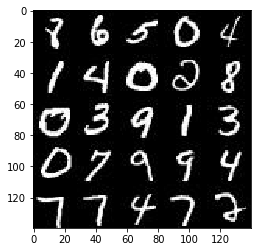

In [24]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

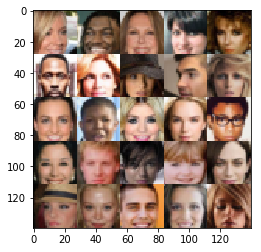

In [25]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [26]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.8.0


/Users/shakiralharthi/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [27]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, [None, image_width,image_height, image_channels], name='real_input')
    z_input = tf.placeholder(tf.float32,[None, z_dim], name='z_input')
    lr = tf.placeholder(tf.float32, name= 'lr')

    return real_input, z_input, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


In [39]:
#set alpha 

alpha = .06

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [29]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    #print(images.shape)
    with tf.variable_scope('discriminator',reuse=reuse):
        x = tf.layers.conv2d(inputs=images, filters = 32 , kernel_size= 5, strides= 2 ,  padding='same',activation= None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        relul = tf.maximum(x * alpha, x)
        
   
        #now shape is 14*14*32
        
        x2 = tf.layers.conv2d(relul, filters = 64, kernel_size= 5, strides=2, padding = 'same',activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training= True)
        relul2 = tf.maximum(x2 * alpha, x2)
        #relul2 = tf.layers.dropout(relul2,rate=.8)
        
        # Now shape is 7*7*64

        x3 =  tf.layers.conv2d(relul2, filters = 128, kernel_size= 5, strides=1, padding = 'same',activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 =  tf.layers.batch_normalization(x3, training= True)
        relul3 = tf.maximum(x3 * alpha, x3)
        #relul3 = tf.layers.dropout(relul3,rate=.8)
        #print(relul3.shape)
        
        x4 =  tf.layers.conv2d(relul3, filters = 256, kernel_size= 5, strides=2, padding = 'same',activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        x4 =  tf.layers.batch_normalization(x4, training= True)
        relul4 = tf.maximum(x4 * alpha, x4)
        #print('relul4  =',relul4.shape)
        

        
        flat = tf.reshape(relul4, (-1, 4*4*256))
        
        logits = tf.layers.dense(flat, 1)
        
        output = tf.sigmoid(logits)
        
        
        
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


In [51]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    #print(images.shape)
    with tf.variable_scope('discriminator',reuse=reuse):
        x = tf.layers.conv2d(inputs=images, filters = 32 , kernel_size= 5, strides= 2 ,  padding='same',activation= None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        relul = tf.maximum(x * alpha, x)
        
   
        #now shape is 14*14*32
        
        x2 = tf.layers.conv2d(relul, filters = 64, kernel_size= 5, strides=2, padding = 'same',activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training= True)
        relul2 = tf.maximum(x2 * alpha, x2)
        #relul2 = tf.layers.dropout(relul2,rate=.8)
        
        # Now shape is 7*7*64

        x3 =  tf.layers.conv2d(relul2, filters = 128, kernel_size= 5, strides=2, padding = 'same',activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 =  tf.layers.batch_normalization(x3, training= True)
        relul3 = tf.maximum(x3 * alpha, x3)
        #relul3 = tf.layers.dropout(relul3,rate=.8)
        #print(relul3.shape)
        
#         x4 =  tf.layers.conv2d(relul3, filters = 256, kernel_size= 5, strides=2, padding = 'same',activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
#         x4 =  tf.layers.batch_normalization(x4, training= True)
#         relul4 = tf.maximum(x4 * alpha, x4)
#         #print('relul4  =',relul4.shape)
        

        
        flat = tf.reshape(relul3, (-1, 4*4*256))
        
        logits = tf.layers.dense(flat, 1)
        
        output = tf.sigmoid(logits)
        
        
        
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [50]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
   
    # TODO: Implement Function

    reuse = False if is_train else True
    with tf.variable_scope('generator', reuse = reuse):
        
        x1= tf.layers.dense(z,2*2*1024, kernel_initializer=tf.contrib.layers.xavier_initializer())
        #print(x1.shape)
        x1= tf.reshape(x1, (-1, 2,2,1024))
        #x1= tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        #print (x1.shape)
        x2 = tf.layers.conv2d_transpose(x1, 512,5, strides=2, padding='valid', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        #x2 = tf.layers.dropout(x2, rate= .2)
        x2 = tf.maximum(alpha * x2, x2)
        #print(x2.shape)
        
        x3 = tf.layers.conv2d_transpose(x2, 256,5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        #print(x3.shape)
        x4 = tf.layers.conv2d_transpose(x3, 128,5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha * x4, x4)
        #print(x4.shape)
        
        
        

        
        #print(out_channel_dim)
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        # 28x28x
        
#         print(logits.shape, 'logits shape')
        output = tf.tanh(logits)
        
#         print(logits)
#         print(output)
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [31]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    g_output = generator(input_z, out_channel_dim, is_train=True)
    
    d_output_real, d_logit_real = discriminator(input_real, reuse= False)
    d_output_fake, d_logit_fake = discriminator(g_output, reuse= True)
    
    
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_real, labels=tf.ones_like(d_output_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_fake, labels=tf.zeros_like(d_output_fake)))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_fake,labels = tf.ones_like(d_output_fake)))
    
    
    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [32]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [33]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

In [34]:
from time import gmtime, strftime
import matplotlib.pyplot as plt

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [53]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
  

    
    #print(data_shape)
    step = 0
    real_input,z_input,lr = model_inputs(data_shape[1],data_shape[2],data_shape[3], z_dim)
    
    d_loss, g_loss = model_loss(real_input, z_input, data_shape[3])
    
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    
    d_loss_change =[]
    g_loss_change =[]
    
    d_loss_local_change =[]
    g_loss_local_change =[]
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            
            for batch_images in get_batches(batch_size):
                #print(batch_images.shape)
                
                
                step += 1
                # TODO: Train Model
                batch_z = np.random.normal(0,.2 , size=(batch_size, z_dim))

                #print('batch_z shape',batch_z.shape)
                batch_images = batch_images * 2
                # Run optimizers
                _ = sess.run(g_train_opt, feed_dict = {z_input: batch_z, real_input: batch_images, lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict = {z_input: batch_z, real_input: batch_images, lr: learning_rate})
                _ = sess.run(d_train_opt, feed_dict = {real_input: batch_images, z_input: batch_z,lr: learning_rate})
                
                d, g = sess.run([d_loss, g_loss], feed_dict={z_input: batch_z, real_input: batch_images})
                #print(d,g)
                d_loss_change.append(d)
                g_loss_change.append(g)
                
                d_loss_local_change.append(d)

                g_loss_local_change.append(g)
                
                if step % 90 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({z_input: batch_z, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
               
                    show_generator_output(sess,25, z_input, data_shape[3], data_image_mode)
    
#                     Discriminator_loss, = plt.plot(d_loss_local_change, color='b', label='Discriminator loss')
#                     Genereator_loss, = plt.plot(g_loss_local_change, color='r', label='Generator loss')
#                     plt.legend(handles=[ Discriminator_loss, Genereator_loss])
#                     print("****Local Iteration loss comparison****")
#                     plt.show()
#                     d_loss_local_change.clear()
#                     g_loss_local_change.clear()

    Discriminator_loss, = plt.plot(d_loss_change, color='b', label='Discriminator loss')
    Genereator_loss, = plt.plot(g_loss_change, color='r', label='Generator loss')
    plt.legend(handles=[ Discriminator_loss, Genereator_loss])
    print("****Whole epochs loss comparison****")
    plt.show()

             
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.0614... Generator Loss: 1.5780


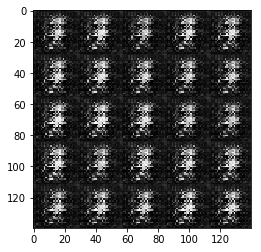

Epoch 1/2... Discriminator Loss: 1.2383... Generator Loss: 1.5197


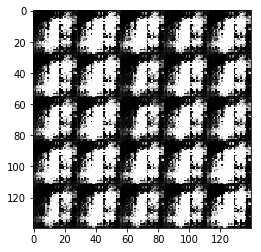

Epoch 1/2... Discriminator Loss: 0.9817... Generator Loss: 1.7113


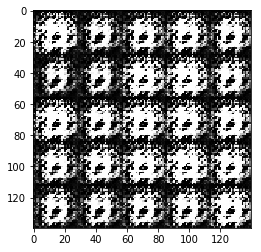

Epoch 1/2... Discriminator Loss: 1.1382... Generator Loss: 1.1793


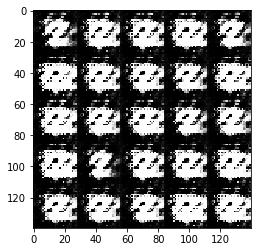

Epoch 1/2... Discriminator Loss: 1.2472... Generator Loss: 1.0659


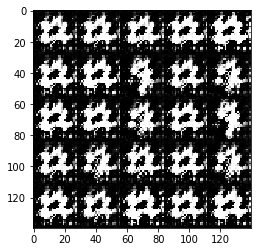

Epoch 1/2... Discriminator Loss: 1.1709... Generator Loss: 1.0558


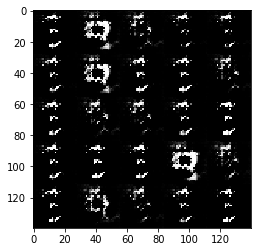

Epoch 1/2... Discriminator Loss: 1.0584... Generator Loss: 1.2802


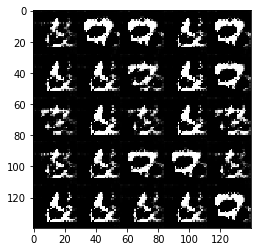

Epoch 1/2... Discriminator Loss: 1.1066... Generator Loss: 1.2232


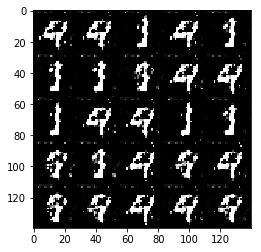

Epoch 1/2... Discriminator Loss: 0.9477... Generator Loss: 1.8070


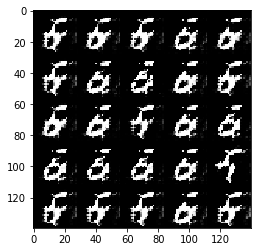

Epoch 1/2... Discriminator Loss: 0.9514... Generator Loss: 1.7372


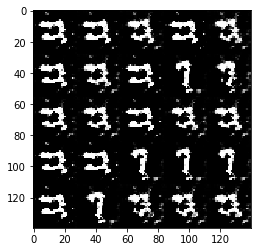

Epoch 1/2... Discriminator Loss: 1.0629... Generator Loss: 1.9056


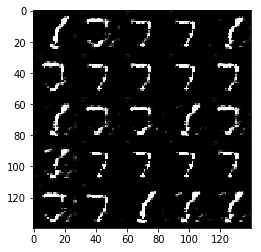

Epoch 1/2... Discriminator Loss: 0.7376... Generator Loss: 1.4894


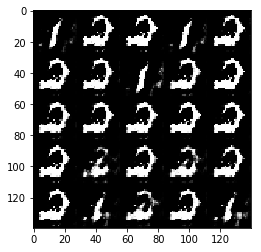

Epoch 1/2... Discriminator Loss: 1.0043... Generator Loss: 1.4928


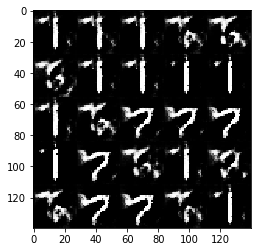

Epoch 1/2... Discriminator Loss: 0.8499... Generator Loss: 1.3944


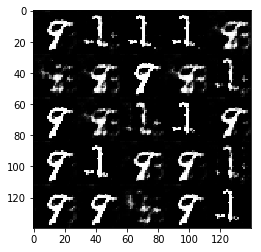

Epoch 1/2... Discriminator Loss: 0.9223... Generator Loss: 1.8509


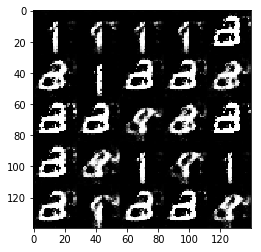

Epoch 1/2... Discriminator Loss: 0.9399... Generator Loss: 2.1067


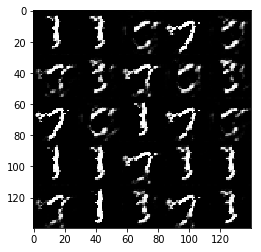

Epoch 1/2... Discriminator Loss: 0.9529... Generator Loss: 1.6632


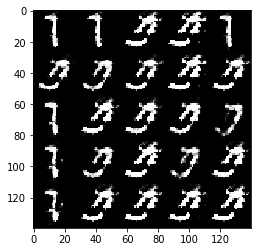

Epoch 1/2... Discriminator Loss: 0.7313... Generator Loss: 1.5246


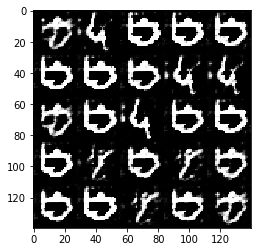

Epoch 1/2... Discriminator Loss: 0.8738... Generator Loss: 1.7627


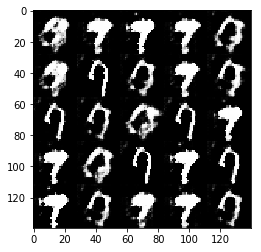

Epoch 1/2... Discriminator Loss: 1.2055... Generator Loss: 1.4176


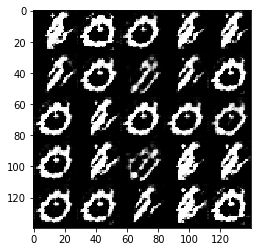

Epoch 2/2... Discriminator Loss: 0.8047... Generator Loss: 1.6151


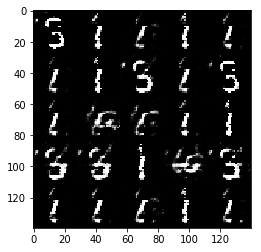

Epoch 2/2... Discriminator Loss: 0.8560... Generator Loss: 1.6360


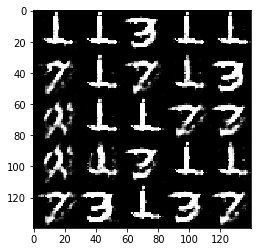

Epoch 2/2... Discriminator Loss: 1.0331... Generator Loss: 1.1401


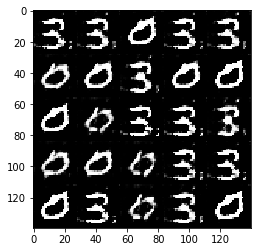

Epoch 2/2... Discriminator Loss: 1.0612... Generator Loss: 1.1755


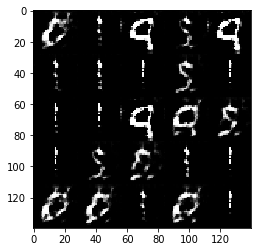

Epoch 2/2... Discriminator Loss: 0.9744... Generator Loss: 1.2193


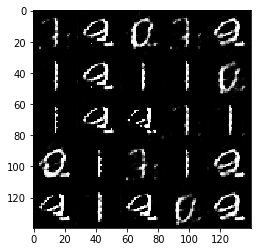

Epoch 2/2... Discriminator Loss: 1.1200... Generator Loss: 2.2479


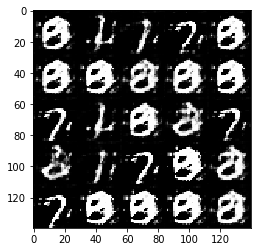

Epoch 2/2... Discriminator Loss: 0.7649... Generator Loss: 1.8961


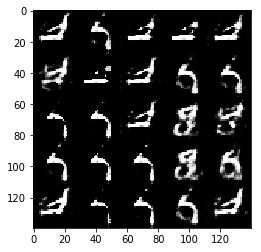

Epoch 2/2... Discriminator Loss: 0.9215... Generator Loss: 1.6366


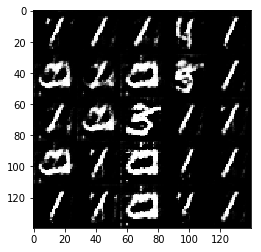

Epoch 2/2... Discriminator Loss: 0.9311... Generator Loss: 1.1128


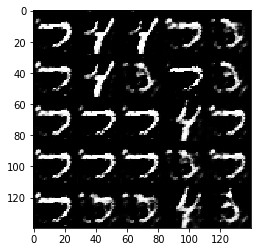

Epoch 2/2... Discriminator Loss: 1.0410... Generator Loss: 1.4347


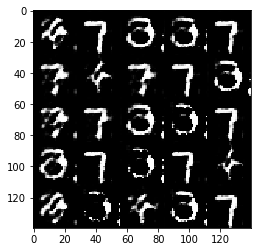

Epoch 2/2... Discriminator Loss: 1.0053... Generator Loss: 1.5309


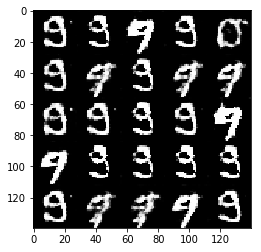

Epoch 2/2... Discriminator Loss: 1.1034... Generator Loss: 2.0138


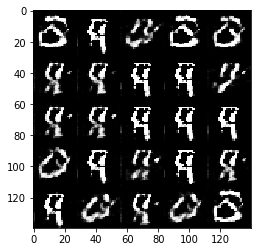

Epoch 2/2... Discriminator Loss: 0.9521... Generator Loss: 2.6006


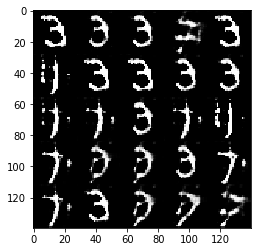

Epoch 2/2... Discriminator Loss: 1.0070... Generator Loss: 1.1731


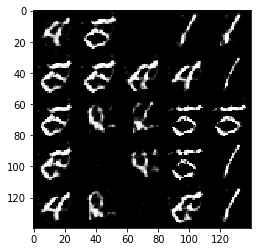

Epoch 2/2... Discriminator Loss: 0.8328... Generator Loss: 1.4670


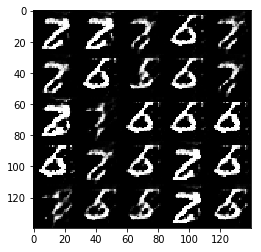

Epoch 2/2... Discriminator Loss: 0.7611... Generator Loss: 2.2622


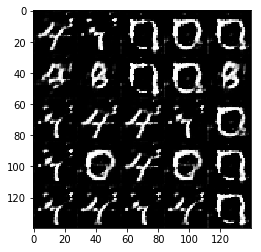

Epoch 2/2... Discriminator Loss: 1.0660... Generator Loss: 2.4252


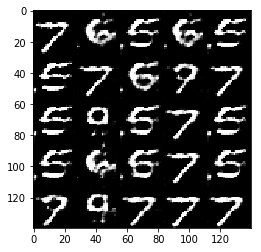

Epoch 2/2... Discriminator Loss: 0.6757... Generator Loss: 1.4926


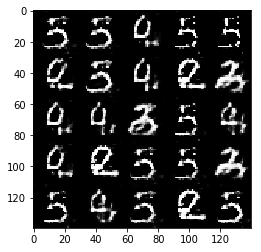

Epoch 2/2... Discriminator Loss: 1.1873... Generator Loss: 1.7889


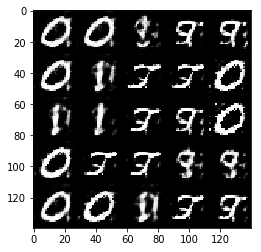

Epoch 2/2... Discriminator Loss: 0.5092... Generator Loss: 2.6752


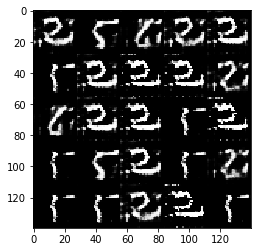

Epoch 2/2... Discriminator Loss: 0.6123... Generator Loss: 2.3385


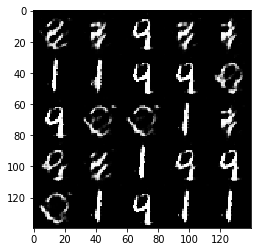

****Whole epochs loss comparison****


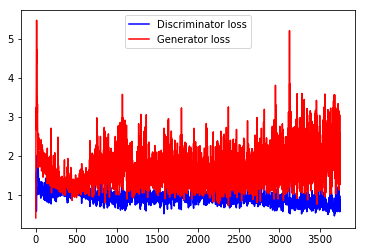

finsihed


In [54]:
batch_size =32
z_dim = 100
learning_rate = 0.0004
beta1 = .4
alpha= .02

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)
    
print('finsihed')

Epoch 1/4... Discriminator Loss: 0.9452... Generator Loss: 3.1355


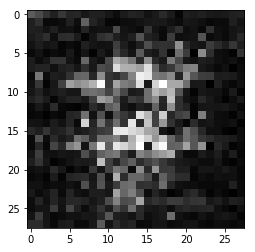

Epoch 1/4... Discriminator Loss: 0.9914... Generator Loss: 5.8404


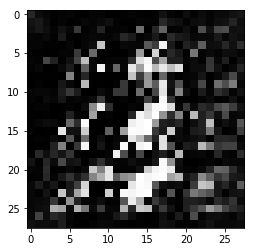

Epoch 1/4... Discriminator Loss: 0.8481... Generator Loss: 1.7334


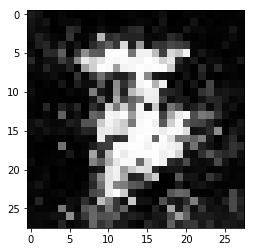

Epoch 1/4... Discriminator Loss: 0.9946... Generator Loss: 2.1700


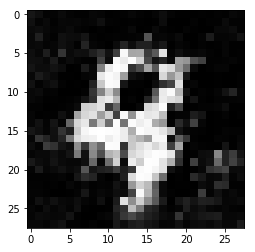

Epoch 1/4... Discriminator Loss: 1.1395... Generator Loss: 2.4855


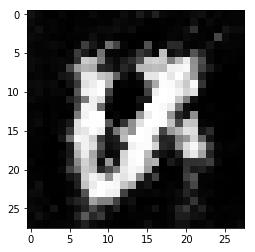

Epoch 1/4... Discriminator Loss: 0.6871... Generator Loss: 1.9092


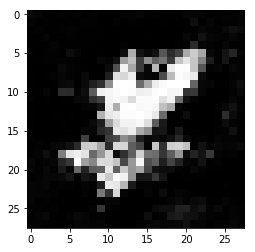

Epoch 1/4... Discriminator Loss: 0.9170... Generator Loss: 1.4482


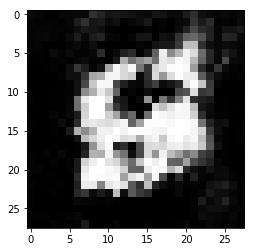

Epoch 1/4... Discriminator Loss: 0.9847... Generator Loss: 2.0798


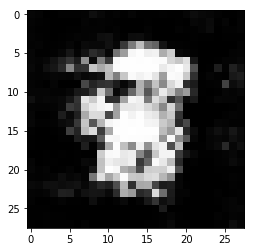

Epoch 1/4... Discriminator Loss: 0.8663... Generator Loss: 2.3626


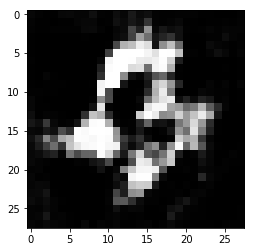

Epoch 1/4... Discriminator Loss: 0.7423... Generator Loss: 1.8770


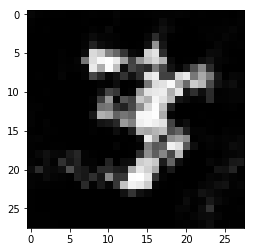

Epoch 2/4... Discriminator Loss: 0.6071... Generator Loss: 1.8373


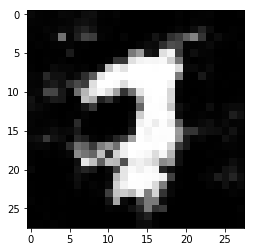

Epoch 2/4... Discriminator Loss: 0.6384... Generator Loss: 2.3149


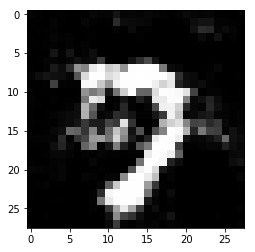

Epoch 2/4... Discriminator Loss: 0.5417... Generator Loss: 2.9290


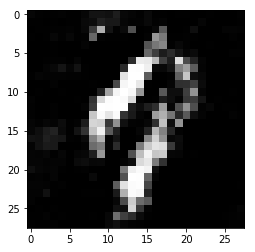

Epoch 2/4... Discriminator Loss: 0.4924... Generator Loss: 2.6731


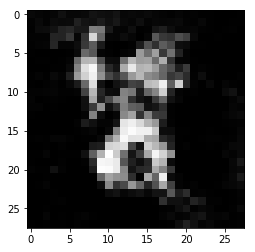

Epoch 2/4... Discriminator Loss: 0.4727... Generator Loss: 2.5503


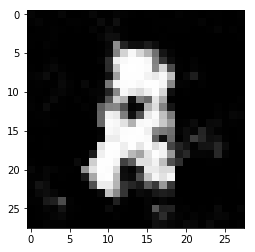

Epoch 2/4... Discriminator Loss: 0.4497... Generator Loss: 2.5134


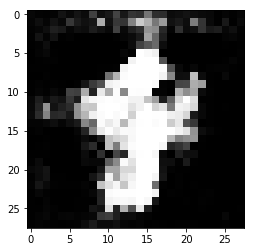

Epoch 2/4... Discriminator Loss: 0.3758... Generator Loss: 3.5974


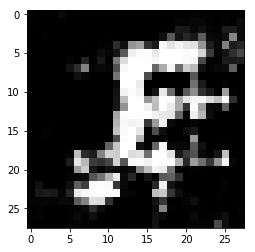

Epoch 2/4... Discriminator Loss: 0.3753... Generator Loss: 3.6605


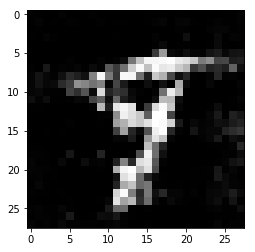

Epoch 2/4... Discriminator Loss: 0.3633... Generator Loss: 3.6162


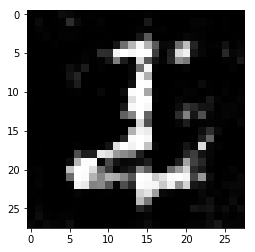

Epoch 2/4... Discriminator Loss: 0.3629... Generator Loss: 4.0477


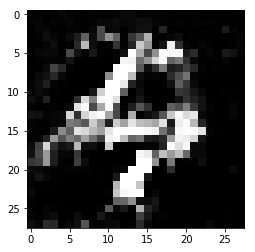

Epoch 3/4... Discriminator Loss: 0.3511... Generator Loss: 4.3219


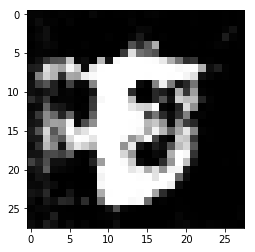

Epoch 3/4... Discriminator Loss: 0.3503... Generator Loss: 4.4364


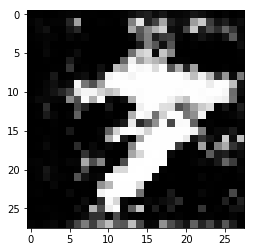

Epoch 3/4... Discriminator Loss: 0.3497... Generator Loss: 4.1234


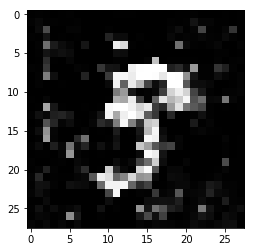

Epoch 3/4... Discriminator Loss: 0.3435... Generator Loss: 4.9639


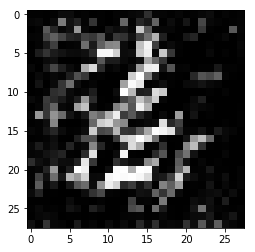

Epoch 3/4... Discriminator Loss: 0.3442... Generator Loss: 4.9209


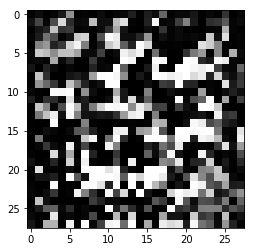

Epoch 3/4... Discriminator Loss: 0.3427... Generator Loss: 4.6475


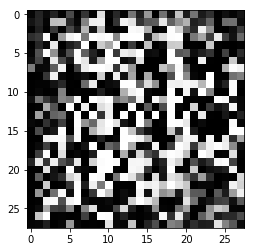

Epoch 3/4... Discriminator Loss: 0.3366... Generator Loss: 5.3685


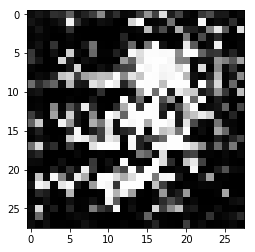

Epoch 3/4... Discriminator Loss: 0.3426... Generator Loss: 5.0917


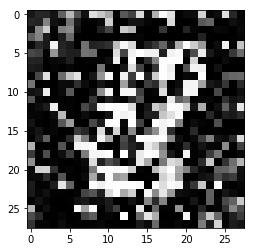

Epoch 3/4... Discriminator Loss: 0.3365... Generator Loss: 5.4562


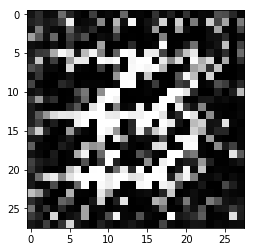

Epoch 3/4... Discriminator Loss: 0.3376... Generator Loss: 5.2744


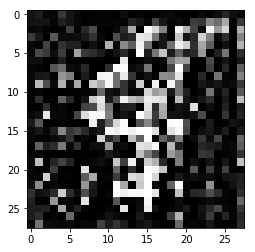

Epoch 3/4... Discriminator Loss: 0.3434... Generator Loss: 4.3746


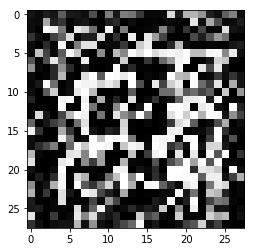

Epoch 4/4... Discriminator Loss: 0.3389... Generator Loss: 4.9122


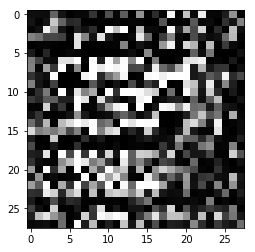

Epoch 4/4... Discriminator Loss: 0.3373... Generator Loss: 5.1175


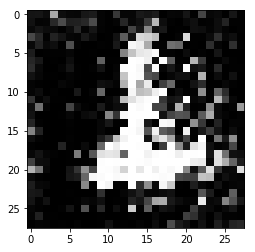

Epoch 4/4... Discriminator Loss: 0.3332... Generator Loss: 5.5912


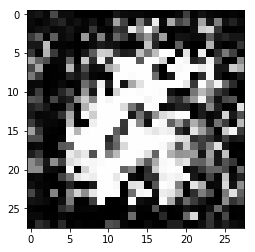

Epoch 4/4... Discriminator Loss: 0.3333... Generator Loss: 5.4058


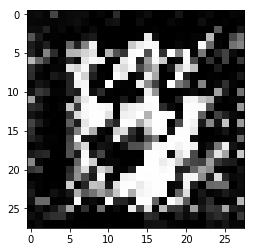

Epoch 4/4... Discriminator Loss: 0.3369... Generator Loss: 6.0861


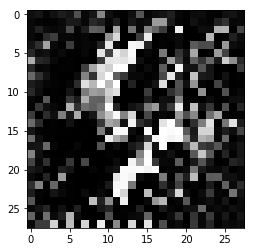

Epoch 4/4... Discriminator Loss: 0.3330... Generator Loss: 5.5674


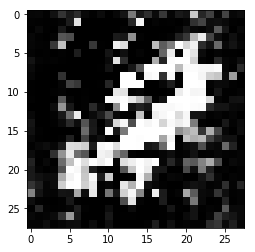

Epoch 4/4... Discriminator Loss: 0.3353... Generator Loss: 4.9361


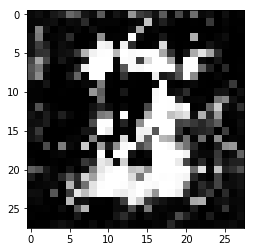

Epoch 4/4... Discriminator Loss: 0.3367... Generator Loss: 5.6185


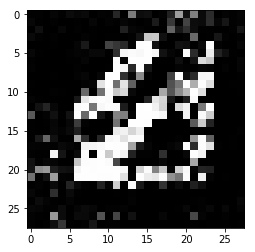

Epoch 4/4... Discriminator Loss: 0.3369... Generator Loss: 4.8341


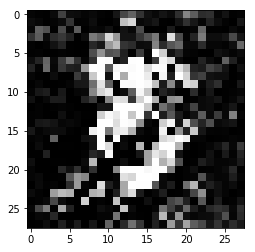

Epoch 4/4... Discriminator Loss: 0.3308... Generator Loss: 7.0071


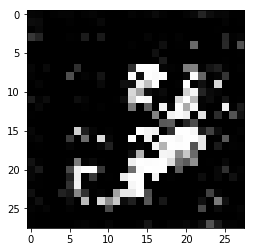

****Whole epochs loss comparison****


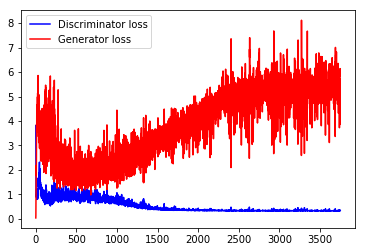

finsihed


In [14]:
batch_size =64
z_dim = 128
learning_rate = 0.0001
beta1 = .2
alpha= .2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 4

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)
    
print('finsihed')

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/3... Discriminator Loss: 1.0922... Generator Loss: 2.9755


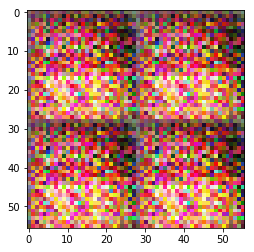

****Local Iteration loss comparison****


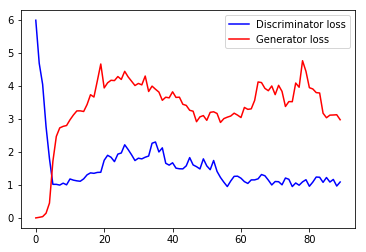

Epoch 1/3... Discriminator Loss: 0.5302... Generator Loss: 3.0356


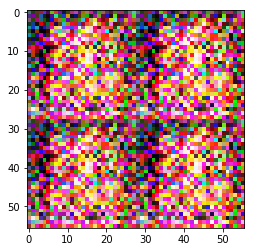

****Local Iteration loss comparison****


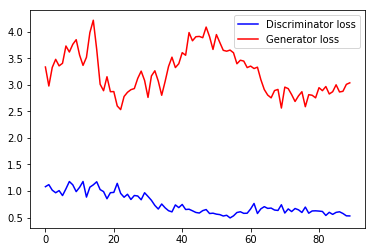

Epoch 1/3... Discriminator Loss: 0.4108... Generator Loss: 3.7168


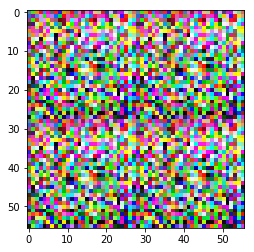

****Local Iteration loss comparison****


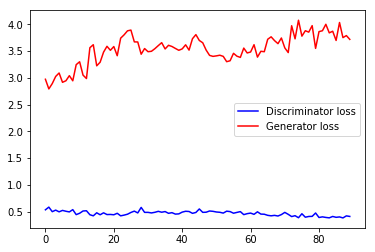

Epoch 1/3... Discriminator Loss: 0.3756... Generator Loss: 3.8924


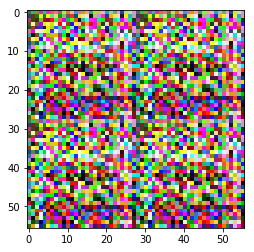

****Local Iteration loss comparison****


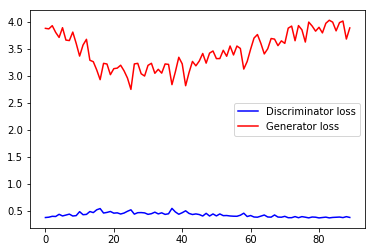

Epoch 1/3... Discriminator Loss: 0.3707... Generator Loss: 3.9059


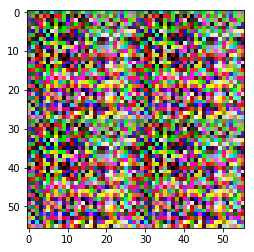

****Local Iteration loss comparison****


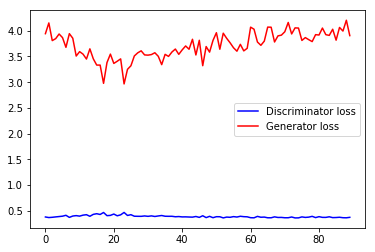

Epoch 1/3... Discriminator Loss: 0.3565... Generator Loss: 4.2894


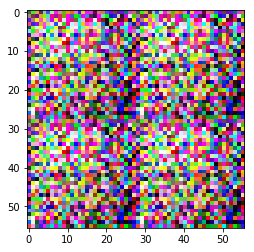

****Local Iteration loss comparison****


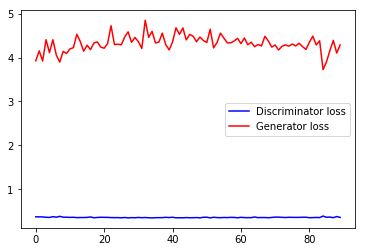

Epoch 1/3... Discriminator Loss: 0.3545... Generator Loss: 3.9615


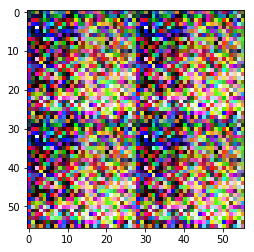

****Local Iteration loss comparison****


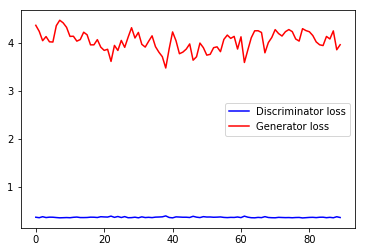

Epoch 1/3... Discriminator Loss: 0.3430... Generator Loss: 4.9151


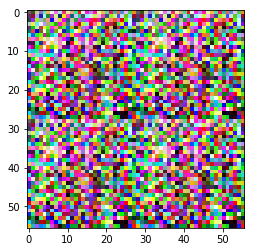

****Local Iteration loss comparison****


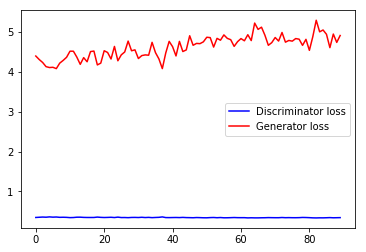

Epoch 1/3... Discriminator Loss: 0.3407... Generator Loss: 4.8175


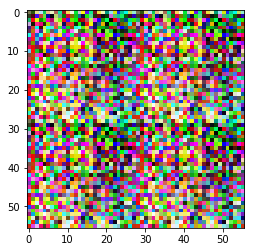

****Local Iteration loss comparison****


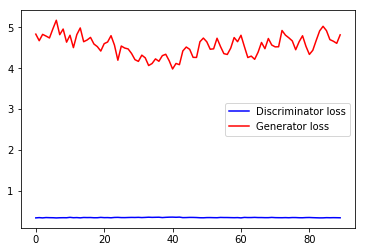

Epoch 1/3... Discriminator Loss: 0.3337... Generator Loss: 5.4569


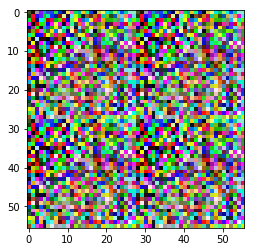

****Local Iteration loss comparison****


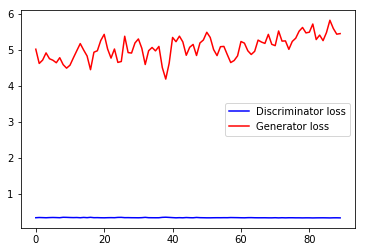

Epoch 1/3... Discriminator Loss: 0.3342... Generator Loss: 5.2709


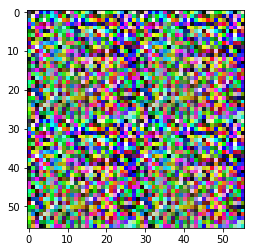

****Local Iteration loss comparison****


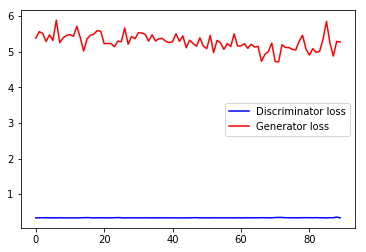

Epoch 1/3... Discriminator Loss: 0.3337... Generator Loss: 5.3035


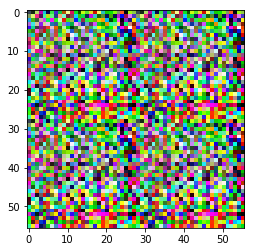

****Local Iteration loss comparison****


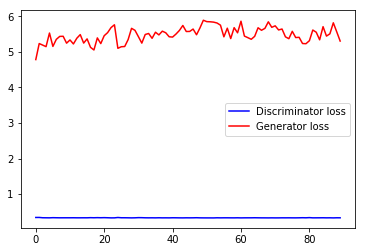

Epoch 1/3... Discriminator Loss: 0.3334... Generator Loss: 5.6278


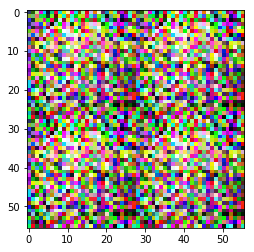

****Local Iteration loss comparison****


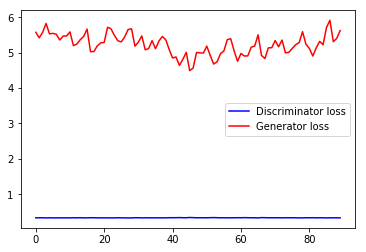

Epoch 1/3... Discriminator Loss: 0.3324... Generator Loss: 5.6927


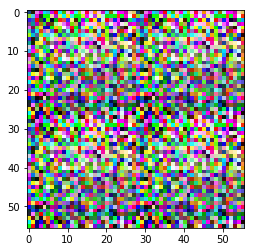

****Local Iteration loss comparison****


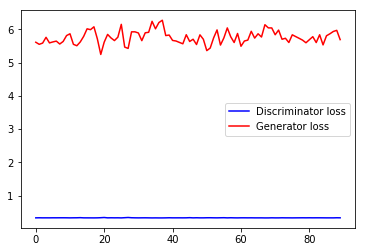

Epoch 2/3... Discriminator Loss: 0.3357... Generator Loss: 4.9746


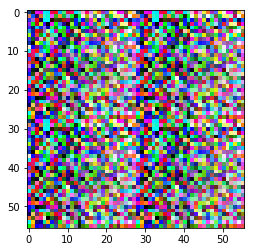

****Local Iteration loss comparison****


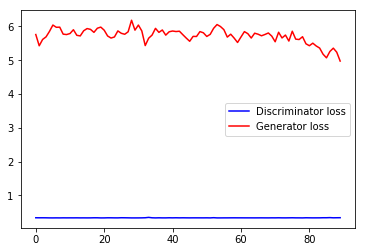

Epoch 2/3... Discriminator Loss: 0.3346... Generator Loss: 5.3646


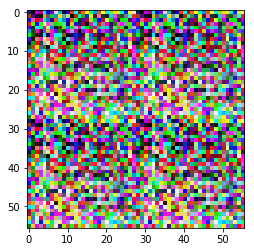

****Local Iteration loss comparison****


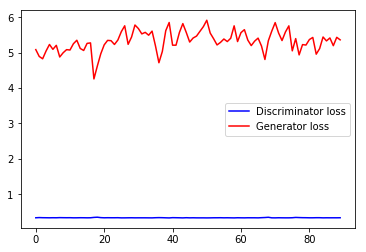

Epoch 2/3... Discriminator Loss: 0.3305... Generator Loss: 5.7063


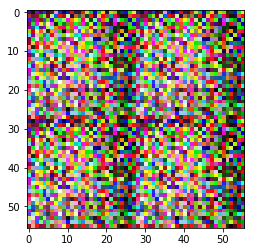

****Local Iteration loss comparison****


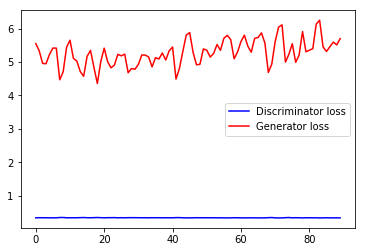

Epoch 2/3... Discriminator Loss: 0.3304... Generator Loss: 5.8153


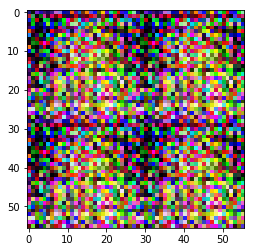

****Local Iteration loss comparison****


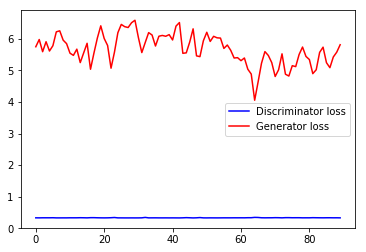

Epoch 2/3... Discriminator Loss: 0.3301... Generator Loss: 6.0364


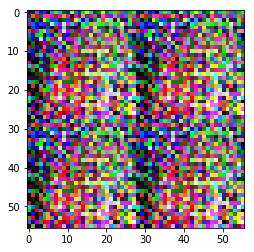

****Local Iteration loss comparison****


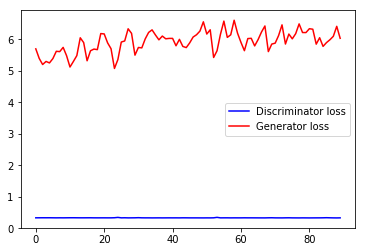

Epoch 2/3... Discriminator Loss: 0.3279... Generator Loss: 6.5799


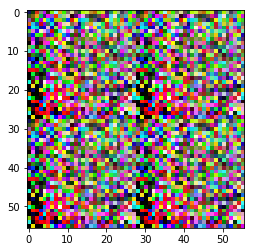

****Local Iteration loss comparison****


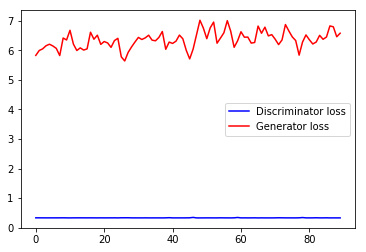

Epoch 2/3... Discriminator Loss: 0.3305... Generator Loss: 5.7841


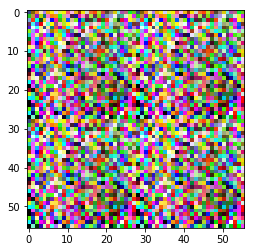

****Local Iteration loss comparison****


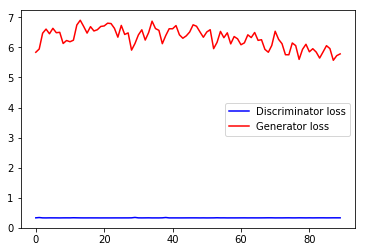

Epoch 2/3... Discriminator Loss: 0.3279... Generator Loss: 6.6393


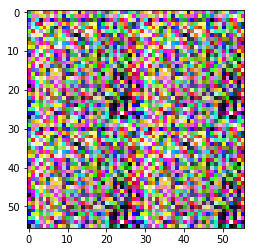

****Local Iteration loss comparison****


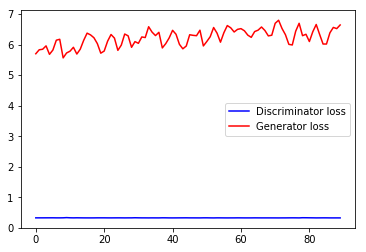

Epoch 2/3... Discriminator Loss: 0.3284... Generator Loss: 6.1979


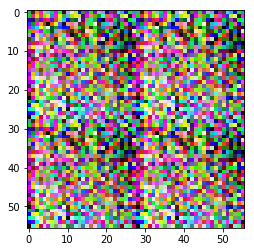

****Local Iteration loss comparison****


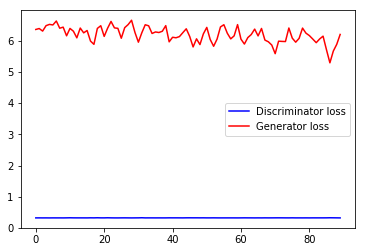

Epoch 2/3... Discriminator Loss: 0.3290... Generator Loss: 6.0469


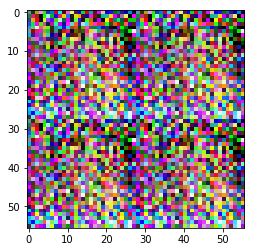

****Local Iteration loss comparison****


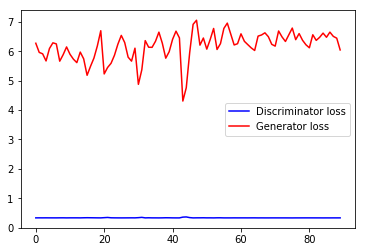

Epoch 2/3... Discriminator Loss: 0.3295... Generator Loss: 6.0624


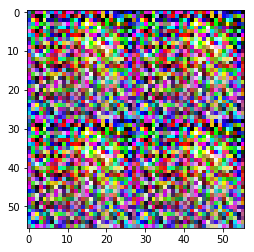

****Local Iteration loss comparison****


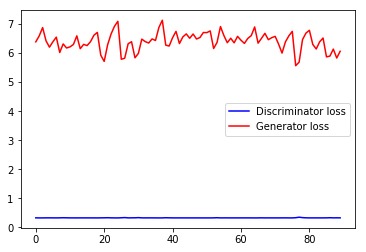

Epoch 2/3... Discriminator Loss: 0.3283... Generator Loss: 6.2007


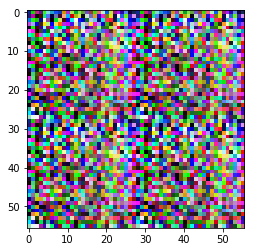

****Local Iteration loss comparison****


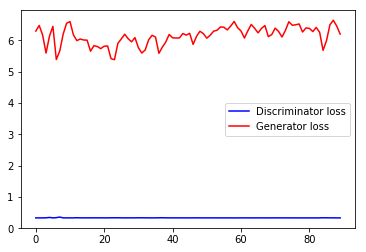

Epoch 2/3... Discriminator Loss: 0.3275... Generator Loss: 7.0895


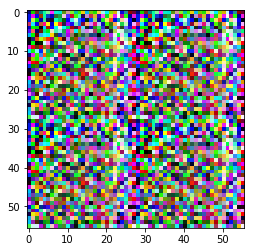

****Local Iteration loss comparison****


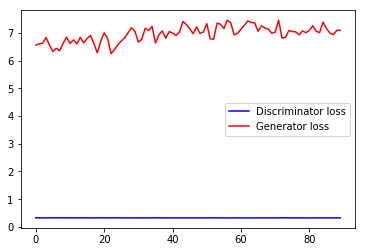

Epoch 2/3... Discriminator Loss: 0.3273... Generator Loss: 7.2992


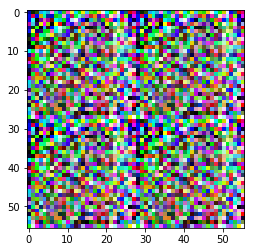

****Local Iteration loss comparison****


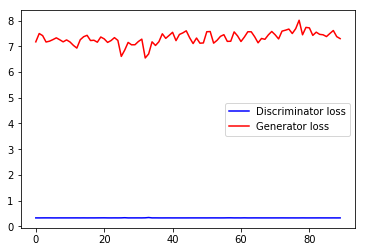

Epoch 3/3... Discriminator Loss: 0.3264... Generator Loss: 7.4221


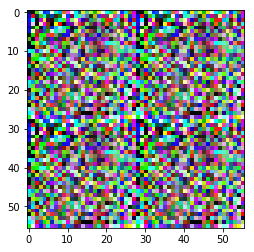

****Local Iteration loss comparison****


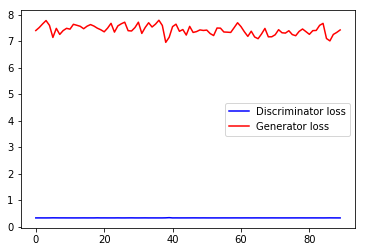

Epoch 3/3... Discriminator Loss: 0.3290... Generator Loss: 6.0038


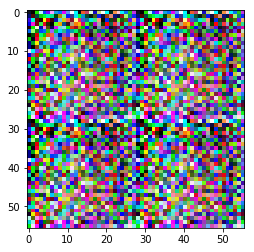

****Local Iteration loss comparison****


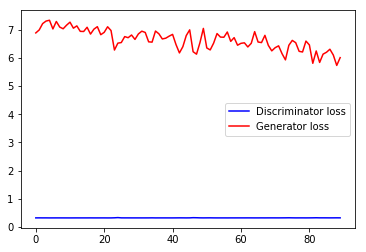

Epoch 3/3... Discriminator Loss: 0.3277... Generator Loss: 7.2428


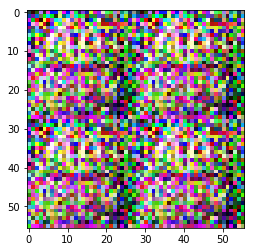

****Local Iteration loss comparison****


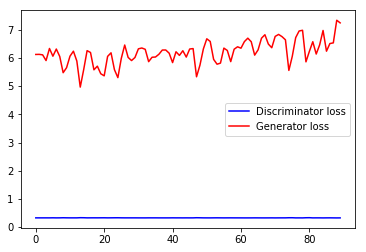

Epoch 3/3... Discriminator Loss: 0.3266... Generator Loss: 7.1907


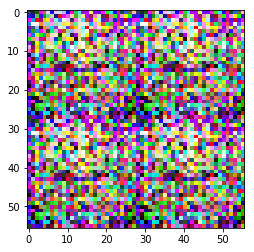

****Local Iteration loss comparison****


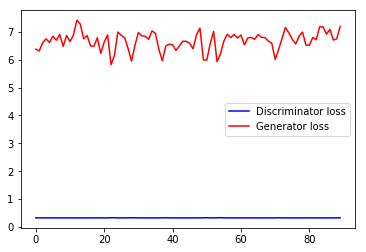

Epoch 3/3... Discriminator Loss: 0.3269... Generator Loss: 7.5472


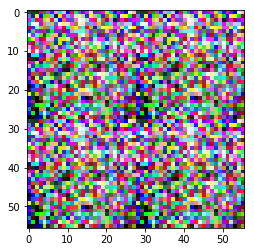

****Local Iteration loss comparison****


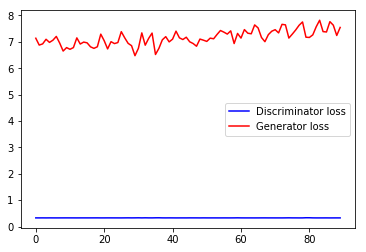

Epoch 3/3... Discriminator Loss: 0.3270... Generator Loss: 7.8882


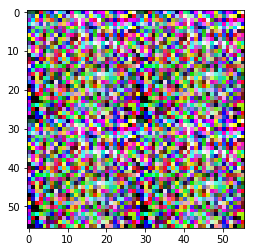

****Local Iteration loss comparison****


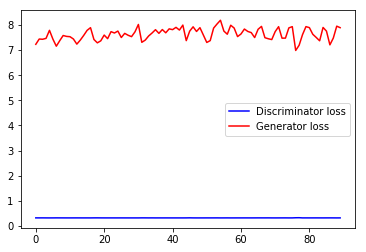

Epoch 3/3... Discriminator Loss: 0.3269... Generator Loss: 7.2265


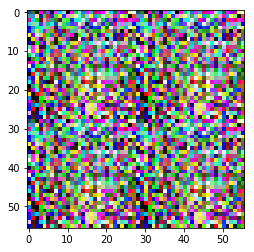

****Local Iteration loss comparison****


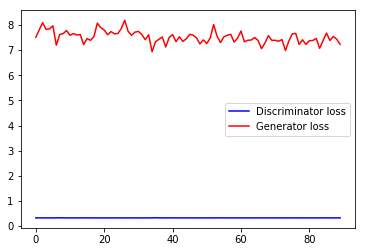

Epoch 3/3... Discriminator Loss: 0.3308... Generator Loss: 5.9738


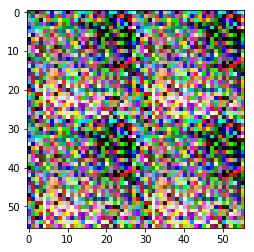

****Local Iteration loss comparison****


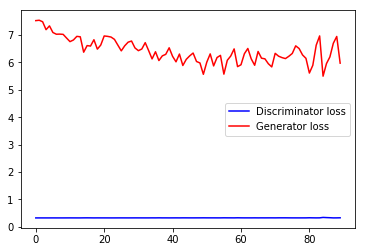

Epoch 3/3... Discriminator Loss: 1.1098... Generator Loss: 1.5074


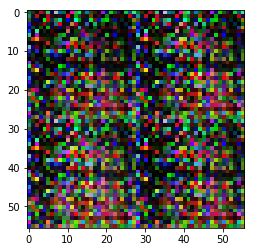

****Local Iteration loss comparison****


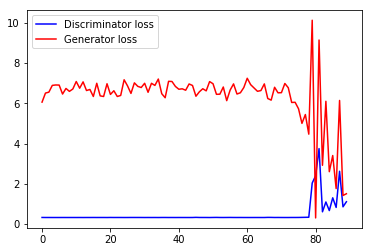

Epoch 3/3... Discriminator Loss: 1.0422... Generator Loss: 1.9265


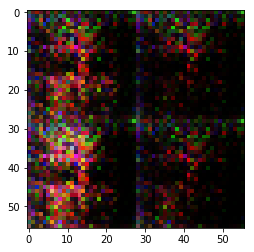

****Local Iteration loss comparison****


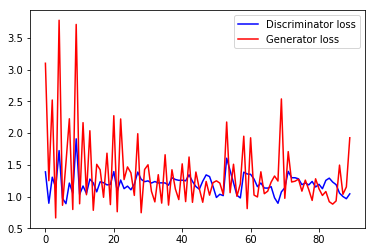

Epoch 3/3... Discriminator Loss: 0.8673... Generator Loss: 1.6870


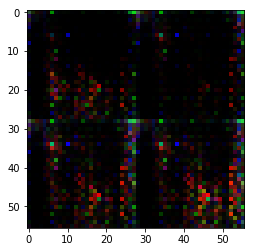

****Local Iteration loss comparison****


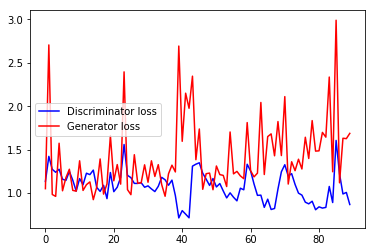

Epoch 3/3... Discriminator Loss: 1.1979... Generator Loss: 0.9718


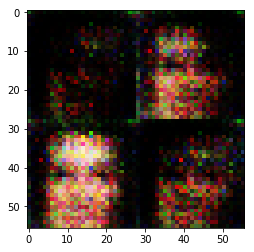

****Local Iteration loss comparison****


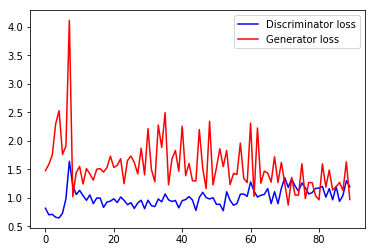

Epoch 3/3... Discriminator Loss: 1.1288... Generator Loss: 1.2792


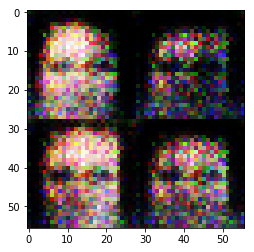

****Local Iteration loss comparison****


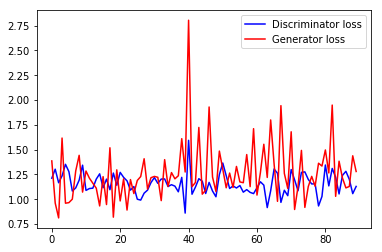

Epoch 3/3... Discriminator Loss: 1.1357... Generator Loss: 1.1530


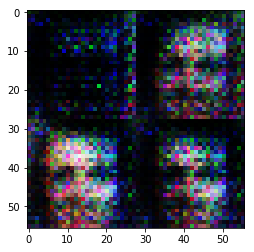

****Local Iteration loss comparison****


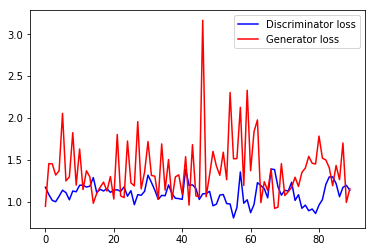

****Whole epochs loss comparison****


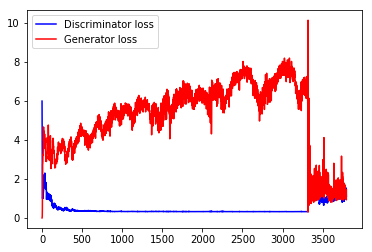

finished


In [18]:
batch_size = 64
z_dim = 256
learning_rate = .0001
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 1.2843... Generator Loss: 1.1432


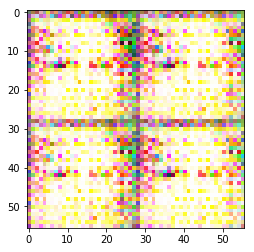

****Local Iteration loss comparison****


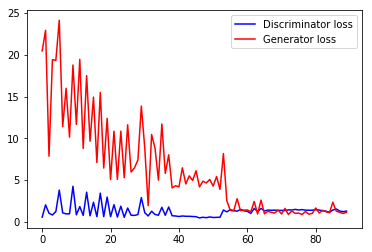

Epoch 1/3... Discriminator Loss: 1.3780... Generator Loss: 0.8028


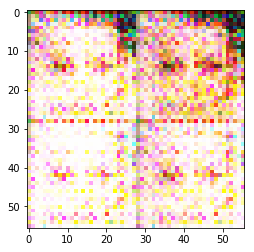

****Local Iteration loss comparison****


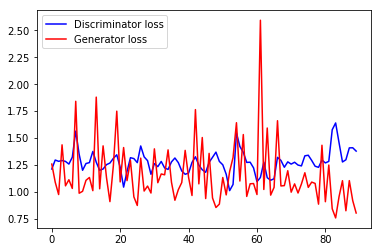

Epoch 1/3... Discriminator Loss: 1.3009... Generator Loss: 0.9997


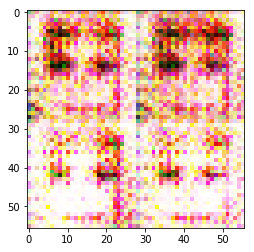

****Local Iteration loss comparison****


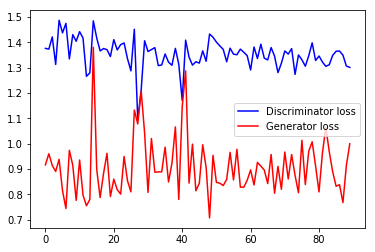

Epoch 1/3... Discriminator Loss: 1.3358... Generator Loss: 0.8474


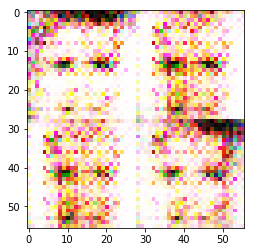

****Local Iteration loss comparison****


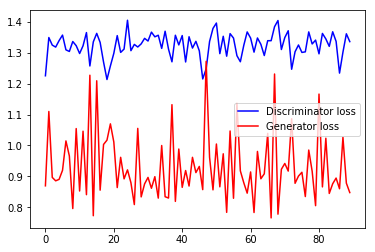

Epoch 1/3... Discriminator Loss: 1.3415... Generator Loss: 0.8802


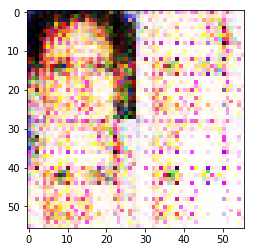

****Local Iteration loss comparison****


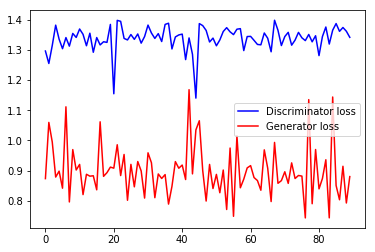

Epoch 1/3... Discriminator Loss: 1.3746... Generator Loss: 0.8223


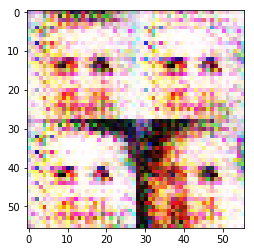

****Local Iteration loss comparison****


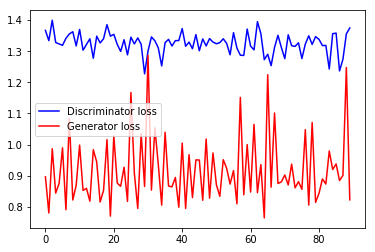

Epoch 1/3... Discriminator Loss: 1.2855... Generator Loss: 0.8096


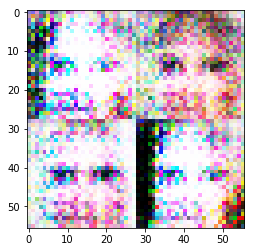

****Local Iteration loss comparison****


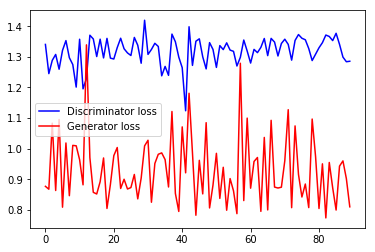

Epoch 1/3... Discriminator Loss: 1.3027... Generator Loss: 0.8860


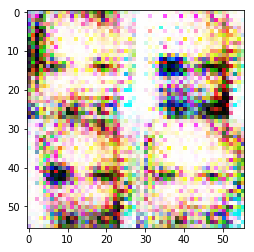

****Local Iteration loss comparison****


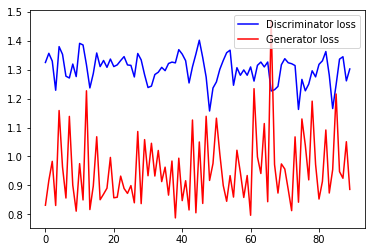

Epoch 1/3... Discriminator Loss: 0.9816... Generator Loss: 1.8533


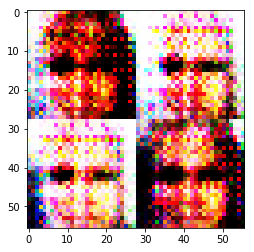

****Local Iteration loss comparison****


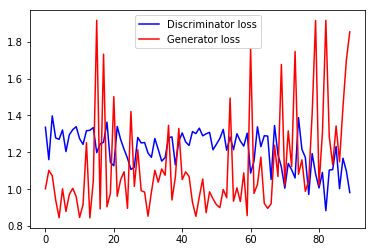

Epoch 1/3... Discriminator Loss: 0.3791... Generator Loss: 3.7309


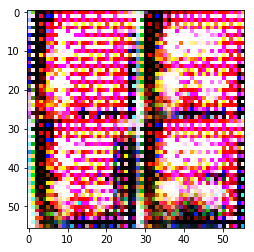

****Local Iteration loss comparison****


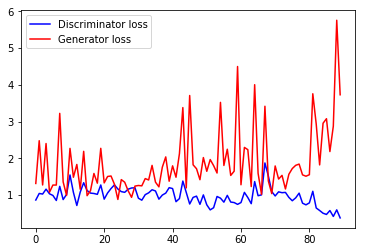

Epoch 1/3... Discriminator Loss: 0.7566... Generator Loss: 3.4150


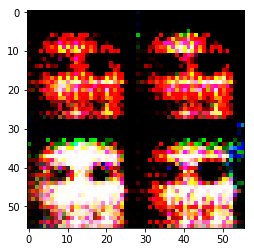

****Local Iteration loss comparison****


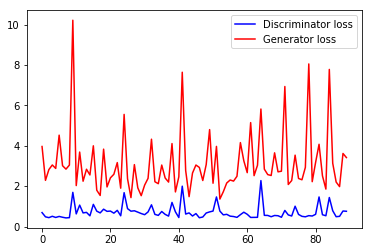

Epoch 1/3... Discriminator Loss: 0.6706... Generator Loss: 2.3527


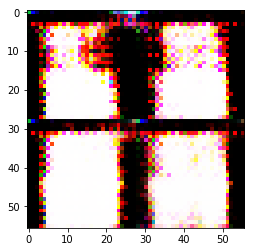

****Local Iteration loss comparison****


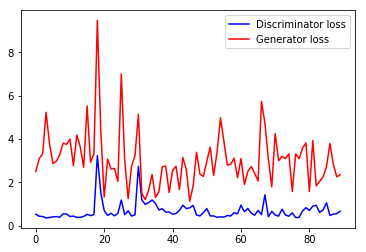

Epoch 1/3... Discriminator Loss: 0.3476... Generator Loss: 4.6433


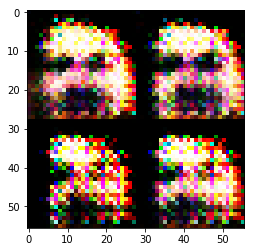

****Local Iteration loss comparison****


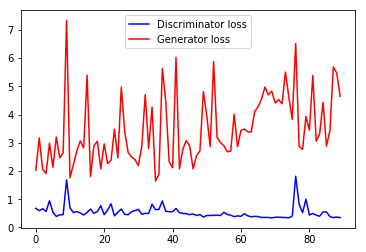

Epoch 1/3... Discriminator Loss: 0.3703... Generator Loss: 4.0905


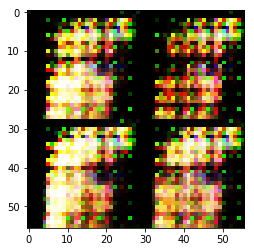

****Local Iteration loss comparison****


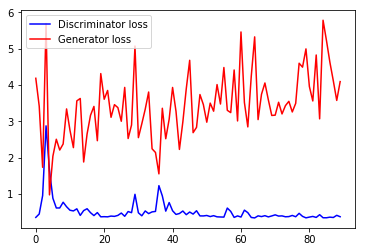

Epoch 2/3... Discriminator Loss: 0.3782... Generator Loss: 3.6503


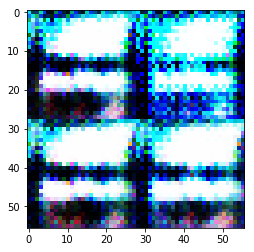

****Local Iteration loss comparison****


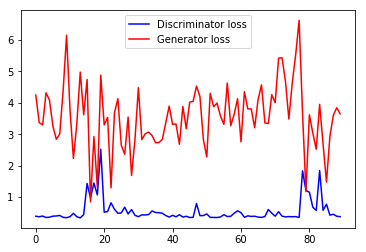

Epoch 2/3... Discriminator Loss: 0.3673... Generator Loss: 3.8623


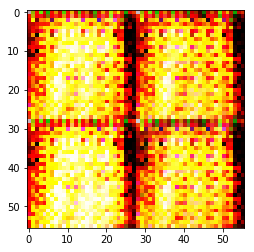

****Local Iteration loss comparison****


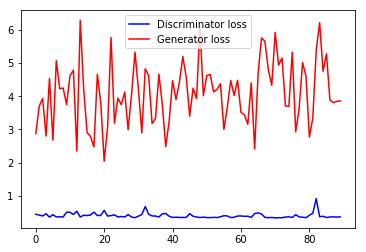

Epoch 2/3... Discriminator Loss: 0.3684... Generator Loss: 3.6608


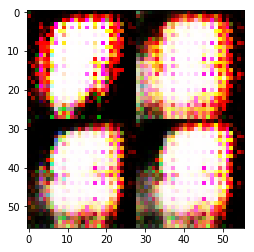

****Local Iteration loss comparison****


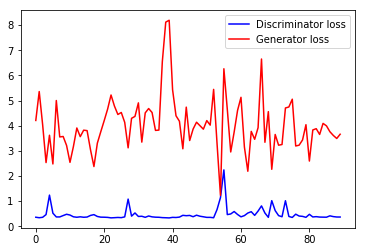

Epoch 2/3... Discriminator Loss: 0.3414... Generator Loss: 5.2880


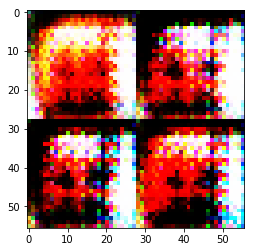

****Local Iteration loss comparison****


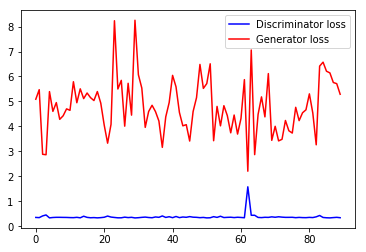

Epoch 2/3... Discriminator Loss: 0.3720... Generator Loss: 3.9900


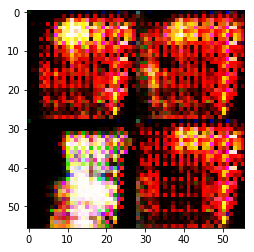

****Local Iteration loss comparison****


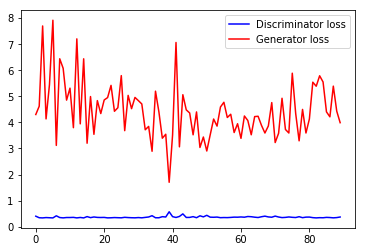

Epoch 2/3... Discriminator Loss: 0.3978... Generator Loss: 4.1593


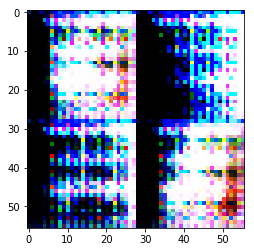

****Local Iteration loss comparison****


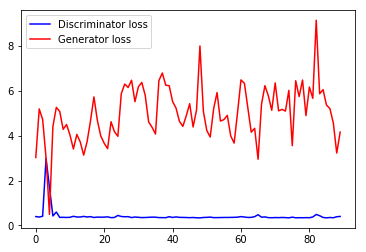

Epoch 2/3... Discriminator Loss: 0.4203... Generator Loss: 2.8427


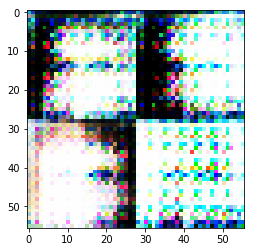

****Local Iteration loss comparison****


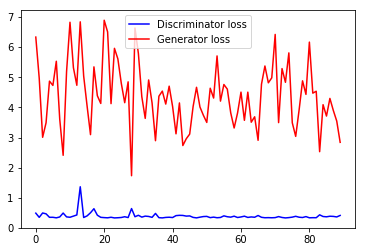

Epoch 2/3... Discriminator Loss: 0.3773... Generator Loss: 3.5422


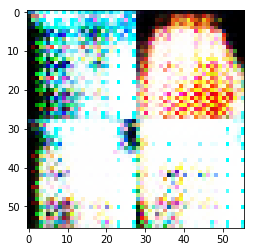

****Local Iteration loss comparison****


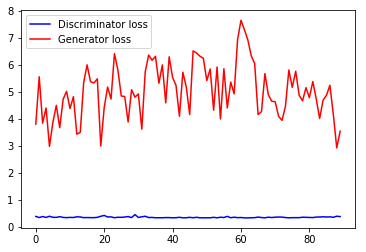

Epoch 2/3... Discriminator Loss: 0.3365... Generator Loss: 5.0867


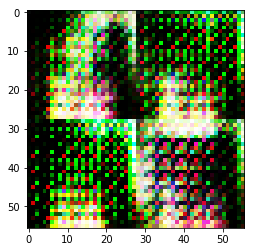

****Local Iteration loss comparison****


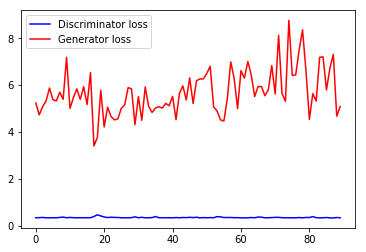

Epoch 2/3... Discriminator Loss: 0.3419... Generator Loss: 5.3338


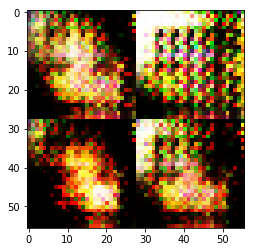

****Local Iteration loss comparison****


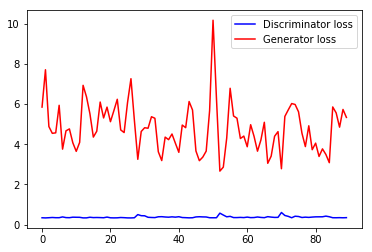

Epoch 2/3... Discriminator Loss: 0.3314... Generator Loss: 5.8964


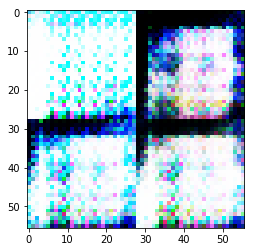

****Local Iteration loss comparison****


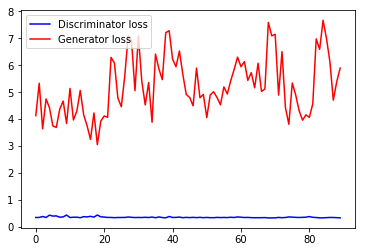

Epoch 2/3... Discriminator Loss: 0.4033... Generator Loss: 3.2028


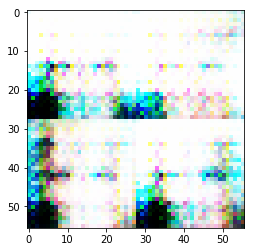

****Local Iteration loss comparison****


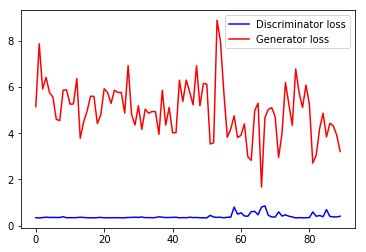

Epoch 2/3... Discriminator Loss: 0.3441... Generator Loss: 4.3030


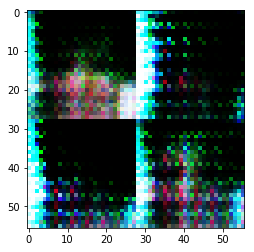

****Local Iteration loss comparison****


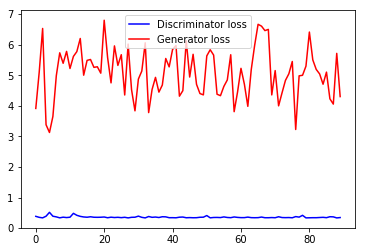

Epoch 2/3... Discriminator Loss: 0.3336... Generator Loss: 5.6304


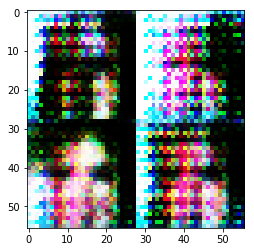

****Local Iteration loss comparison****


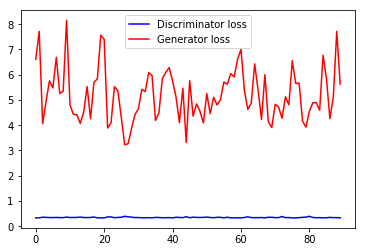

Epoch 3/3... Discriminator Loss: 0.3386... Generator Loss: 5.2164


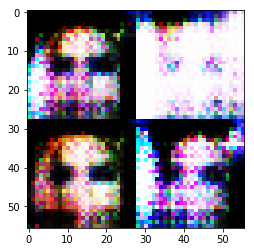

****Local Iteration loss comparison****


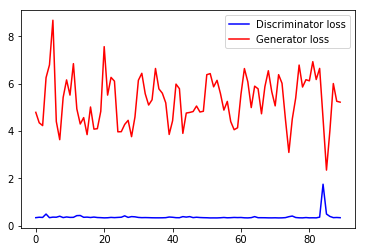

Epoch 3/3... Discriminator Loss: 0.3977... Generator Loss: 6.3681


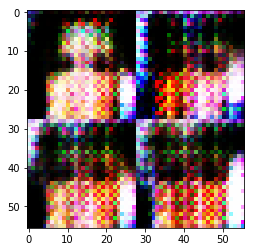

****Local Iteration loss comparison****


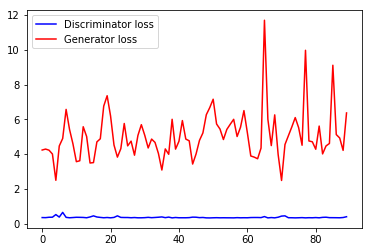

Epoch 3/3... Discriminator Loss: 0.3441... Generator Loss: 5.6656


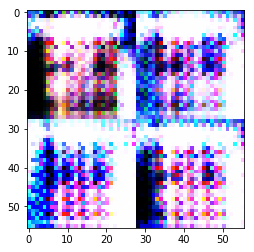

****Local Iteration loss comparison****


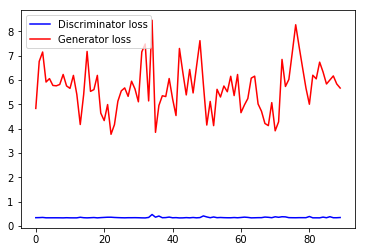

Epoch 3/3... Discriminator Loss: 0.3870... Generator Loss: 4.6059


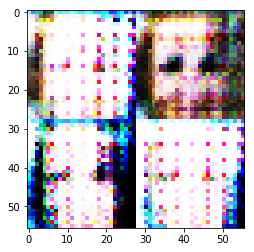

****Local Iteration loss comparison****


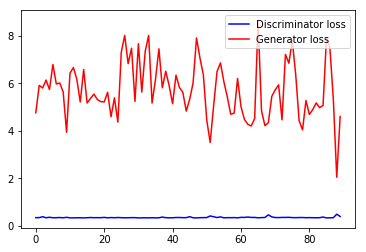

Epoch 3/3... Discriminator Loss: 0.3462... Generator Loss: 5.3395


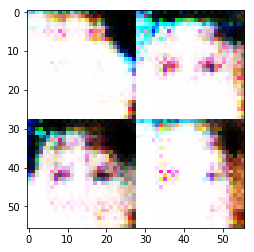

****Local Iteration loss comparison****


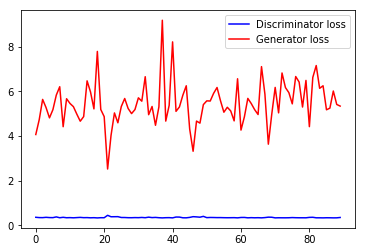

Epoch 3/3... Discriminator Loss: 0.3445... Generator Loss: 4.9121


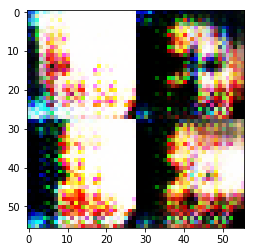

****Local Iteration loss comparison****


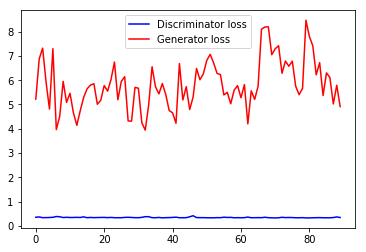

Epoch 3/3... Discriminator Loss: 0.3489... Generator Loss: 4.8623


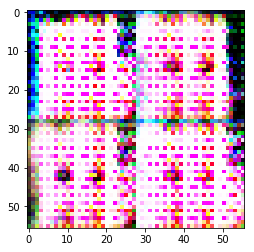

****Local Iteration loss comparison****


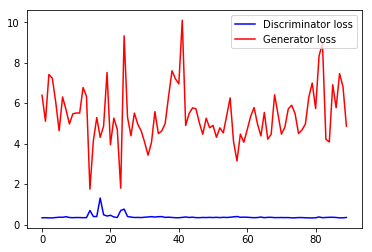

Epoch 3/3... Discriminator Loss: 0.3414... Generator Loss: 4.5941


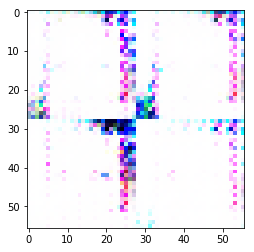

****Local Iteration loss comparison****


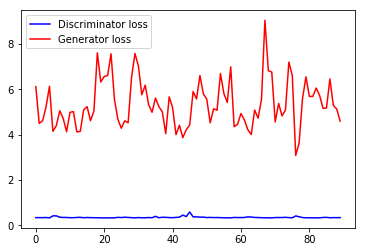

Epoch 3/3... Discriminator Loss: 0.3541... Generator Loss: 4.2697


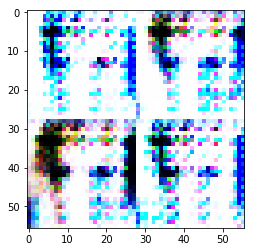

****Local Iteration loss comparison****


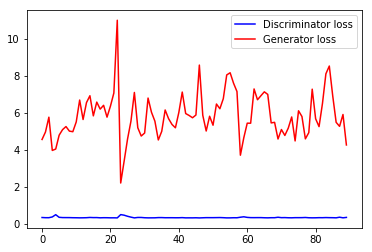

Epoch 3/3... Discriminator Loss: 0.3624... Generator Loss: 5.4396


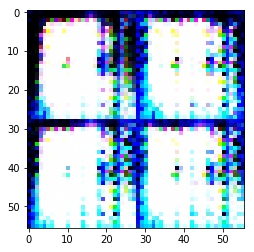

****Local Iteration loss comparison****


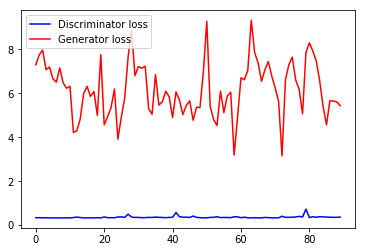

Epoch 3/3... Discriminator Loss: 0.3279... Generator Loss: 7.6436


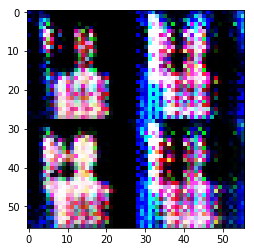

****Local Iteration loss comparison****


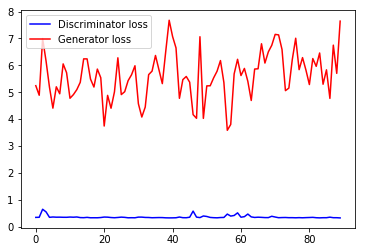

Epoch 3/3... Discriminator Loss: 0.3329... Generator Loss: 5.2142


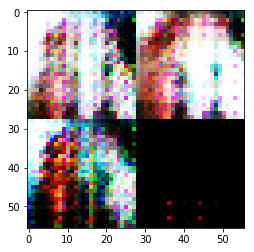

****Local Iteration loss comparison****


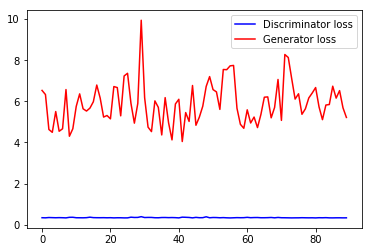

Epoch 3/3... Discriminator Loss: 2.1576... Generator Loss: 2.9274


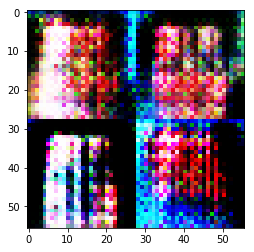

****Local Iteration loss comparison****


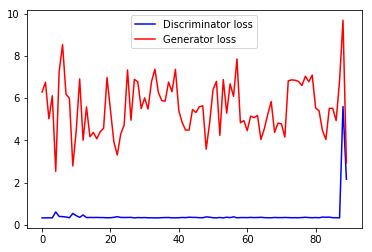

Epoch 3/3... Discriminator Loss: 0.3368... Generator Loss: 5.0838


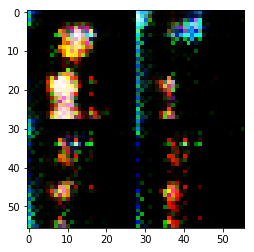

****Local Iteration loss comparison****


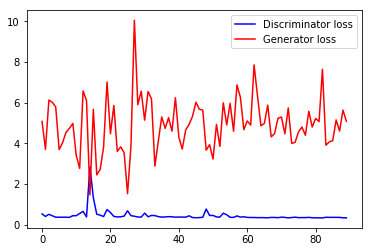

****Whole epochs loss comparison****


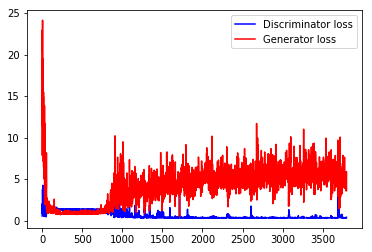

finished


In [16]:
batch_size = 32
z_dim = 256
learning_rate = .0008
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 1.0234... Generator Loss: 4.1481


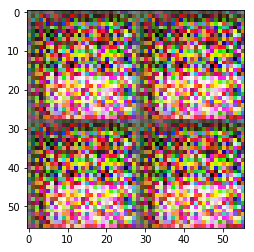

****Local Iteration loss comparison****


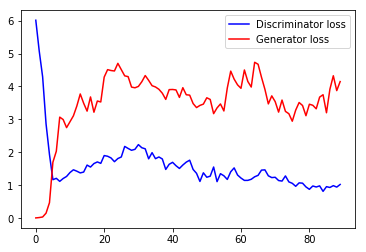

Epoch 1/3... Discriminator Loss: 0.5696... Generator Loss: 2.9624


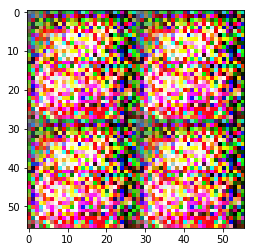

****Local Iteration loss comparison****


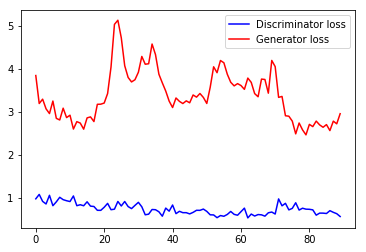

Epoch 1/3... Discriminator Loss: 0.4314... Generator Loss: 3.3216


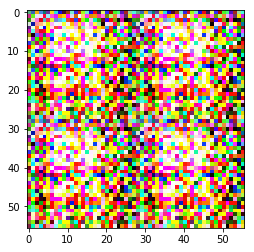

****Local Iteration loss comparison****


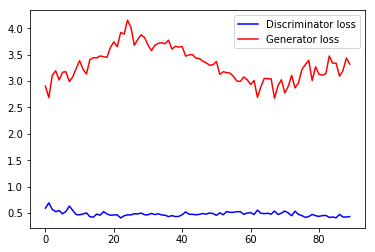

Epoch 1/3... Discriminator Loss: 1.3107... Generator Loss: 1.0508


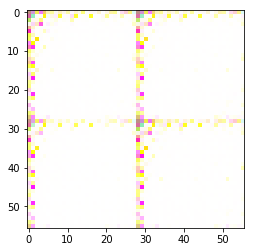

****Local Iteration loss comparison****


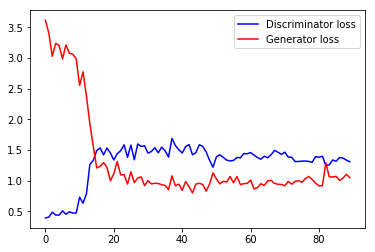

Epoch 1/3... Discriminator Loss: 1.1484... Generator Loss: 1.1372


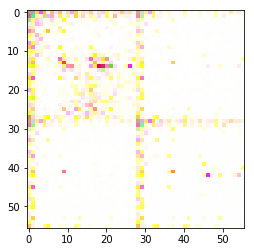

****Local Iteration loss comparison****


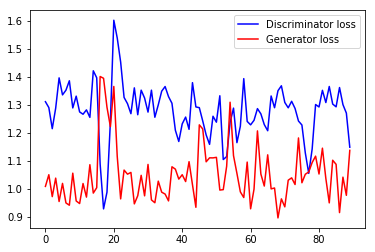

Epoch 1/3... Discriminator Loss: 1.3859... Generator Loss: 0.9924


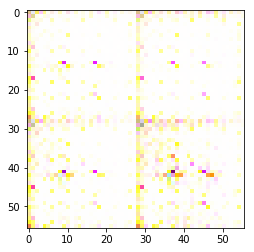

****Local Iteration loss comparison****


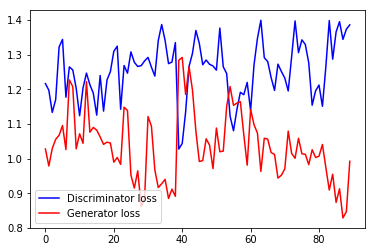

Epoch 1/3... Discriminator Loss: 1.3894... Generator Loss: 0.7929


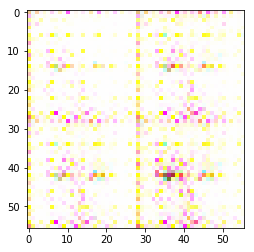

****Local Iteration loss comparison****


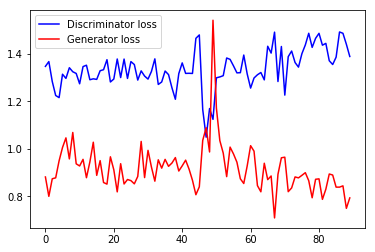

Epoch 1/3... Discriminator Loss: 1.3716... Generator Loss: 0.8233


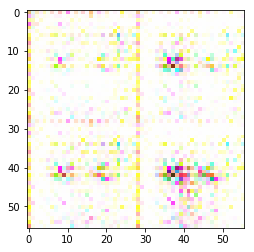

****Local Iteration loss comparison****


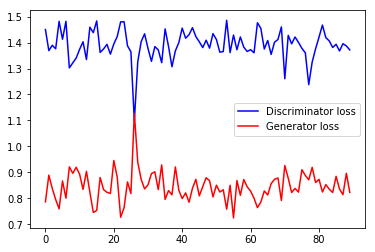

Epoch 1/3... Discriminator Loss: 1.3935... Generator Loss: 0.8007


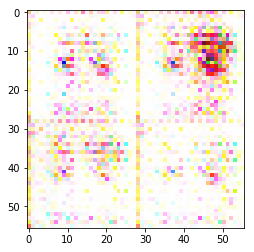

****Local Iteration loss comparison****


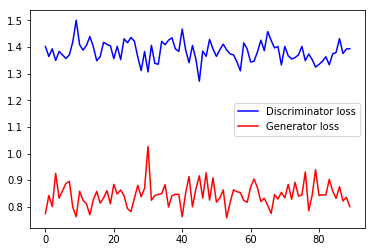

Epoch 1/3... Discriminator Loss: 1.3565... Generator Loss: 0.8621


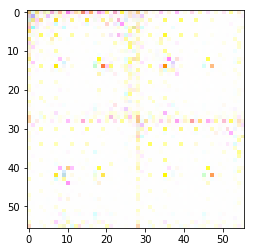

****Local Iteration loss comparison****


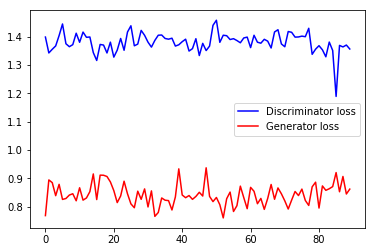

Epoch 1/3... Discriminator Loss: 1.3602... Generator Loss: 0.9011


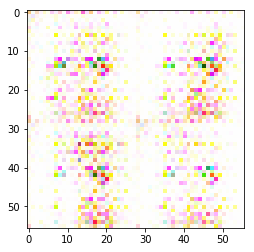

****Local Iteration loss comparison****


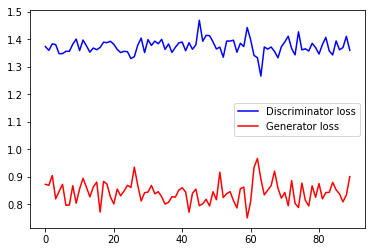

Epoch 1/3... Discriminator Loss: 1.3962... Generator Loss: 0.8314


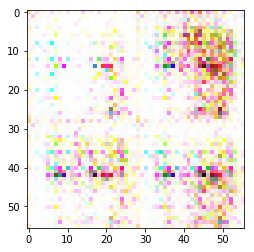

****Local Iteration loss comparison****


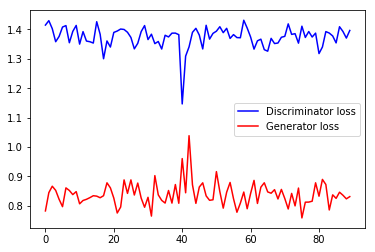

Epoch 1/3... Discriminator Loss: 1.3903... Generator Loss: 0.8366


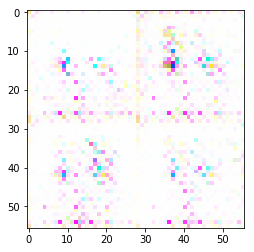

****Local Iteration loss comparison****


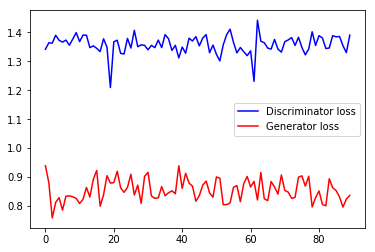

Epoch 1/3... Discriminator Loss: 1.3380... Generator Loss: 0.8903


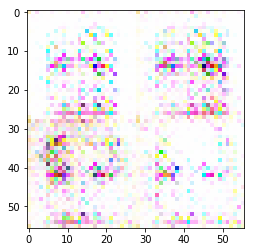

****Local Iteration loss comparison****


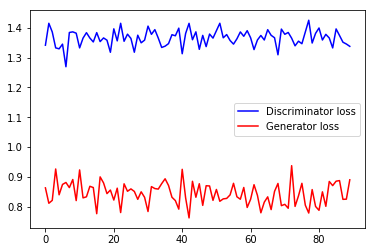

Epoch 2/3... Discriminator Loss: 1.3461... Generator Loss: 0.8786


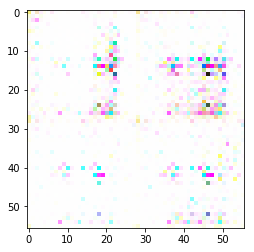

****Local Iteration loss comparison****


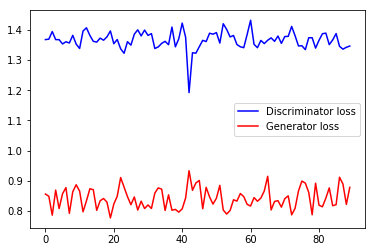

Epoch 2/3... Discriminator Loss: 1.3584... Generator Loss: 0.8125


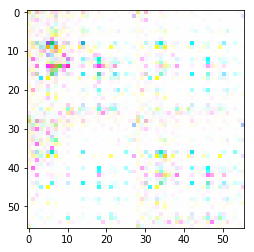

****Local Iteration loss comparison****


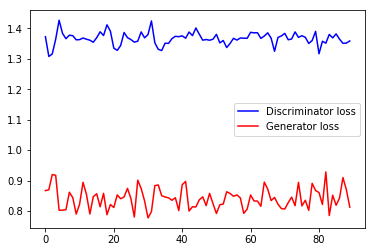

Epoch 2/3... Discriminator Loss: 1.3820... Generator Loss: 0.8122


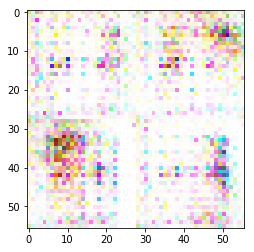

****Local Iteration loss comparison****


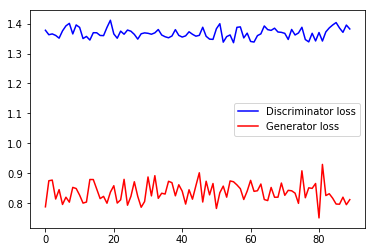

Epoch 2/3... Discriminator Loss: 1.3797... Generator Loss: 0.8860


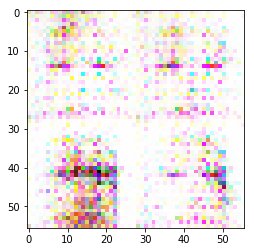

****Local Iteration loss comparison****


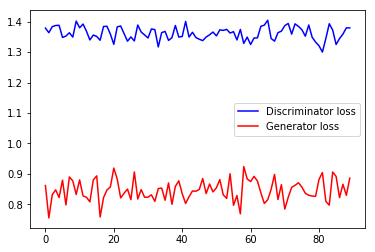

Epoch 2/3... Discriminator Loss: 1.3915... Generator Loss: 0.7746


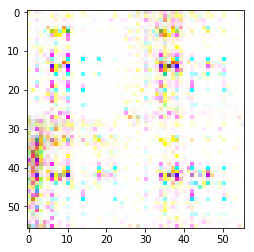

****Local Iteration loss comparison****


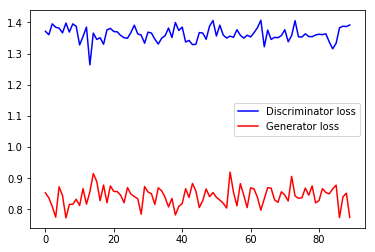

Epoch 2/3... Discriminator Loss: 1.3714... Generator Loss: 0.8648


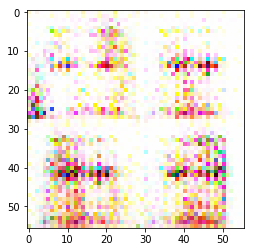

****Local Iteration loss comparison****


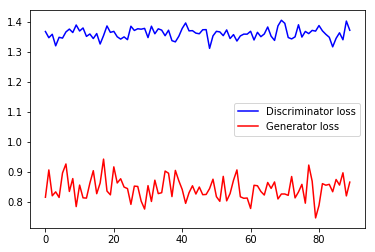

Epoch 2/3... Discriminator Loss: 1.3669... Generator Loss: 0.8610


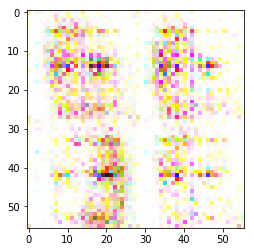

****Local Iteration loss comparison****


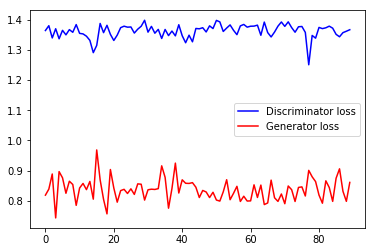

Epoch 2/3... Discriminator Loss: 1.3341... Generator Loss: 0.8778


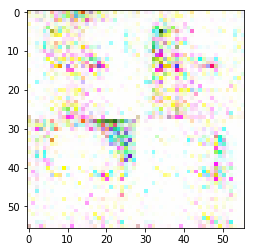

****Local Iteration loss comparison****


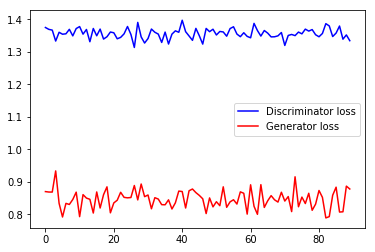

Epoch 2/3... Discriminator Loss: 1.3533... Generator Loss: 0.8415


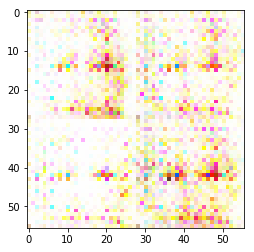

****Local Iteration loss comparison****


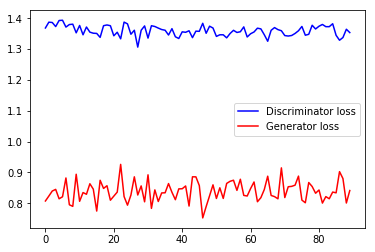

Epoch 2/3... Discriminator Loss: 1.3567... Generator Loss: 0.8407


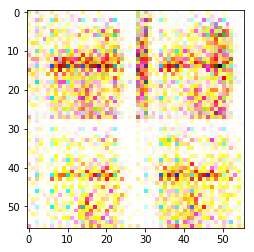

****Local Iteration loss comparison****


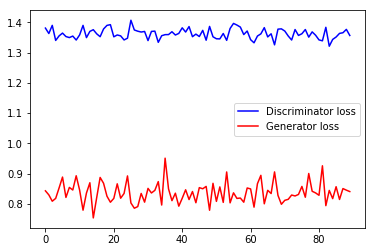

Epoch 2/3... Discriminator Loss: 1.3437... Generator Loss: 0.8450


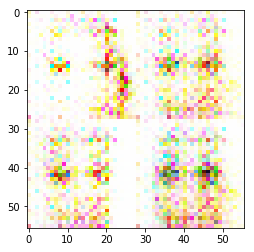

****Local Iteration loss comparison****


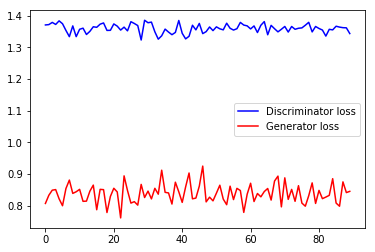

Epoch 2/3... Discriminator Loss: 1.3740... Generator Loss: 0.8331


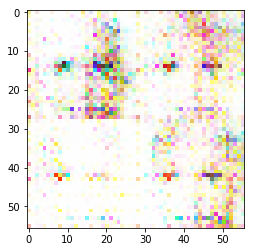

****Local Iteration loss comparison****


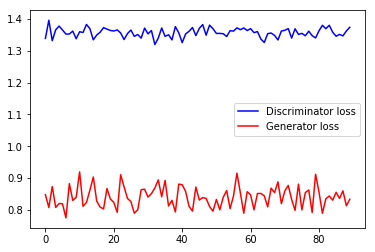

Epoch 2/3... Discriminator Loss: 1.3597... Generator Loss: 0.8376


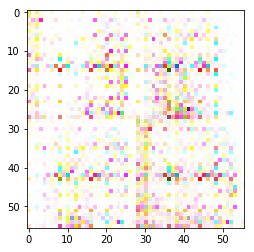

****Local Iteration loss comparison****


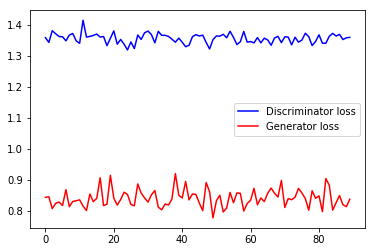

Epoch 2/3... Discriminator Loss: 1.3650... Generator Loss: 0.8674


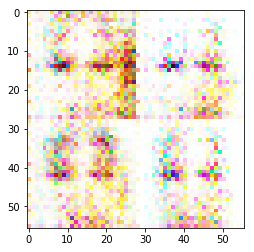

****Local Iteration loss comparison****


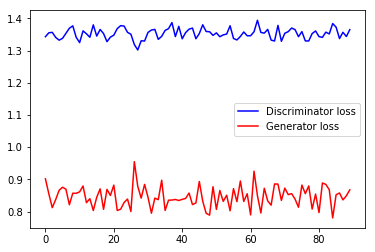

Epoch 3/3... Discriminator Loss: 1.3677... Generator Loss: 0.8187


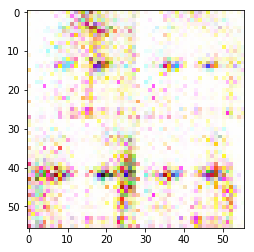

****Local Iteration loss comparison****


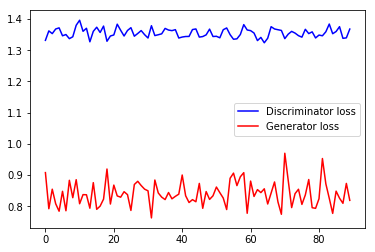

Epoch 3/3... Discriminator Loss: 1.3519... Generator Loss: 0.8273


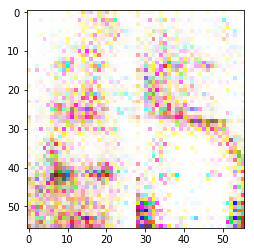

****Local Iteration loss comparison****


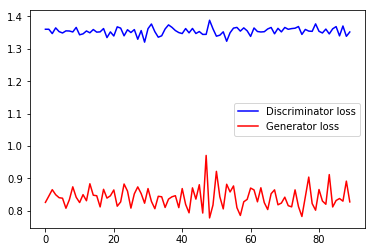

Epoch 3/3... Discriminator Loss: 1.3570... Generator Loss: 0.8443


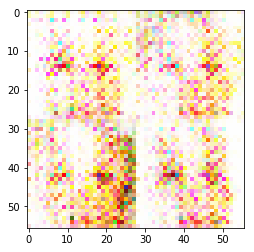

****Local Iteration loss comparison****


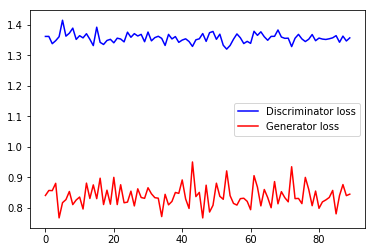

Epoch 3/3... Discriminator Loss: 1.3555... Generator Loss: 0.8722


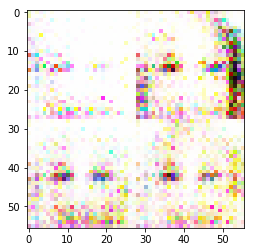

****Local Iteration loss comparison****


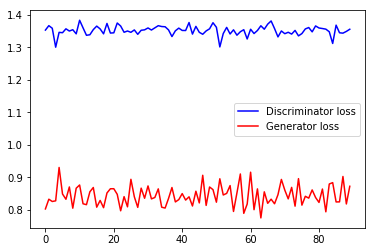

Epoch 3/3... Discriminator Loss: 1.3392... Generator Loss: 0.8721


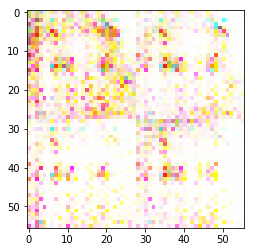

****Local Iteration loss comparison****


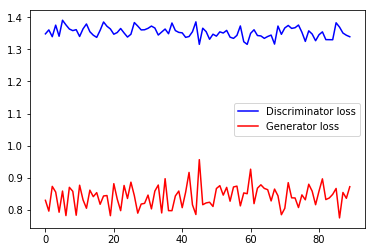

Epoch 3/3... Discriminator Loss: 1.3750... Generator Loss: 0.8628


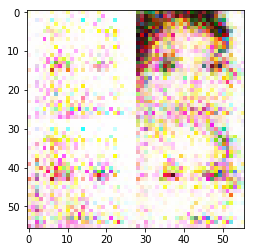

****Local Iteration loss comparison****


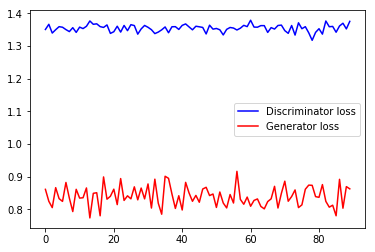

Epoch 3/3... Discriminator Loss: 1.3493... Generator Loss: 0.8668


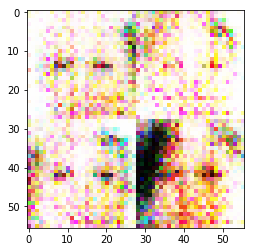

****Local Iteration loss comparison****


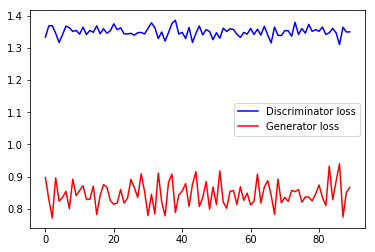

Epoch 3/3... Discriminator Loss: 1.3527... Generator Loss: 0.7932


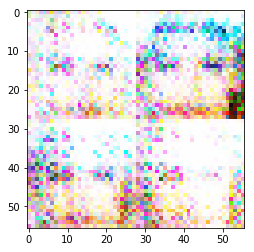

****Local Iteration loss comparison****


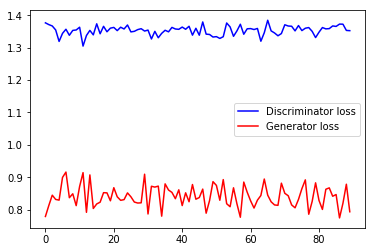

Epoch 3/3... Discriminator Loss: 1.3669... Generator Loss: 0.8813


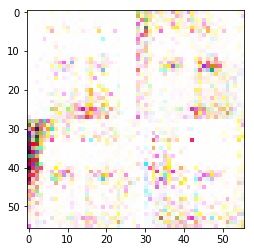

****Local Iteration loss comparison****


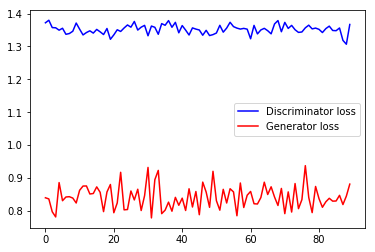

Epoch 3/3... Discriminator Loss: 1.3249... Generator Loss: 0.8807


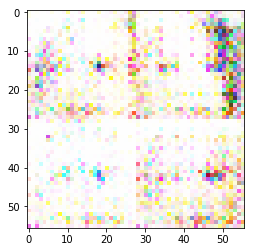

****Local Iteration loss comparison****


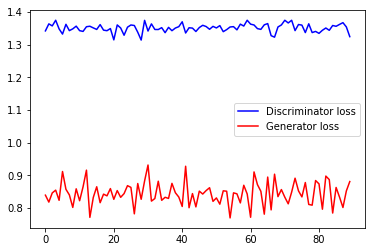

Epoch 3/3... Discriminator Loss: 1.3401... Generator Loss: 0.9179


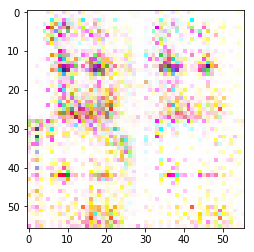

****Local Iteration loss comparison****


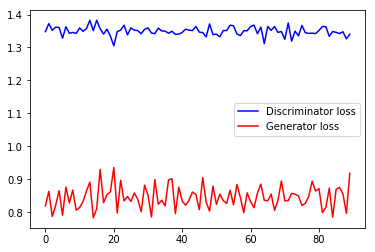

Epoch 3/3... Discriminator Loss: 1.3474... Generator Loss: 0.8443


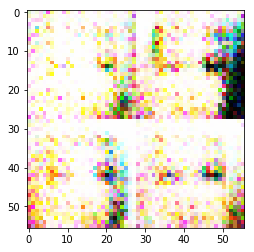

****Local Iteration loss comparison****


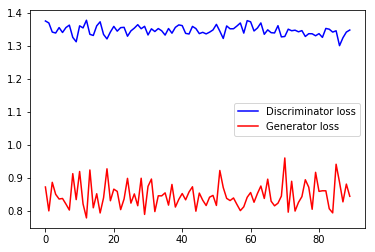

Epoch 3/3... Discriminator Loss: 1.3144... Generator Loss: 0.8505


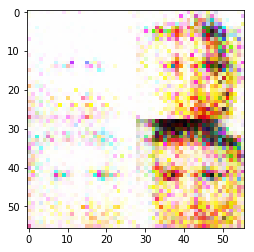

****Local Iteration loss comparison****


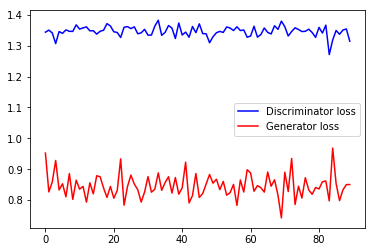

Epoch 3/3... Discriminator Loss: 1.3648... Generator Loss: 0.8407


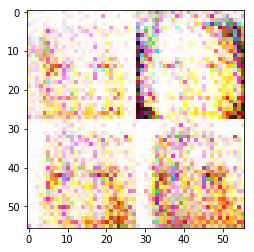

****Local Iteration loss comparison****


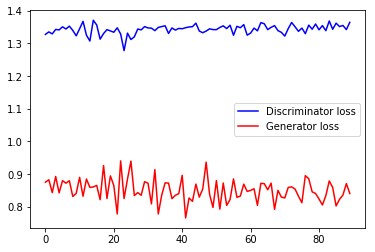

****Whole epochs loss comparison****


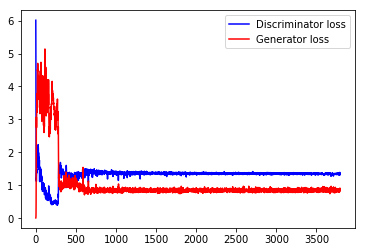

finished


In [18]:
batch_size = 160
z_dim = 256
learning_rate = .0001
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 1.3241... Generator Loss: 2.6868


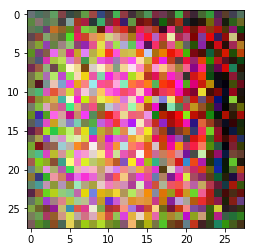

Epoch 1/3... Discriminator Loss: 0.5405... Generator Loss: 3.8324


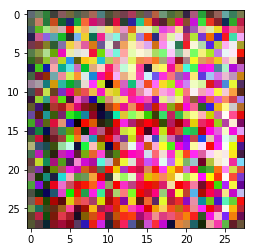

Epoch 1/3... Discriminator Loss: 0.4615... Generator Loss: 3.3319


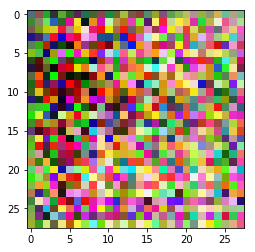

Epoch 1/3... Discriminator Loss: 0.3993... Generator Loss: 3.5335


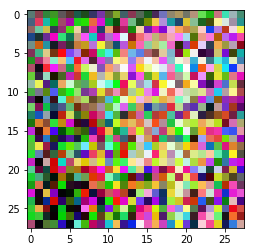

Epoch 1/3... Discriminator Loss: 0.3916... Generator Loss: 3.6965


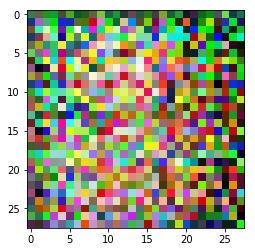

Epoch 1/3... Discriminator Loss: 0.3522... Generator Loss: 4.5467


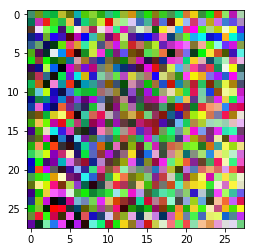

Epoch 1/3... Discriminator Loss: 0.3604... Generator Loss: 3.8814


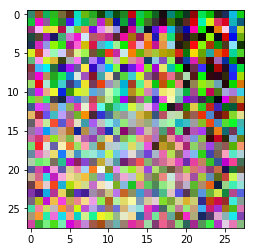

Epoch 1/3... Discriminator Loss: 0.3449... Generator Loss: 4.4902


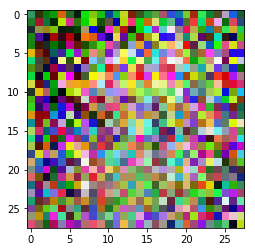

Epoch 1/3... Discriminator Loss: 0.3420... Generator Loss: 4.6456


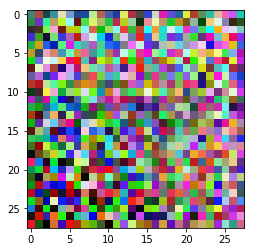

Epoch 1/3... Discriminator Loss: 0.3386... Generator Loss: 5.1356


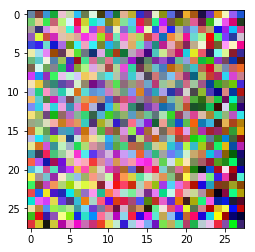

Epoch 1/3... Discriminator Loss: 0.3429... Generator Loss: 4.8735


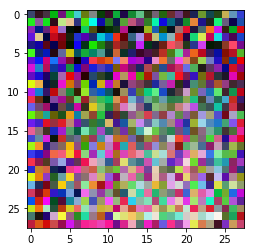

Epoch 1/3... Discriminator Loss: 0.3387... Generator Loss: 5.0115


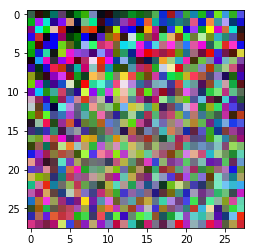

Epoch 1/3... Discriminator Loss: 1.1346... Generator Loss: 1.2072


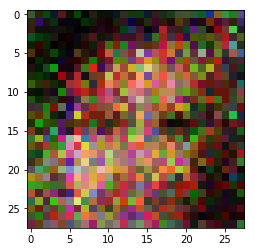

Epoch 1/3... Discriminator Loss: 0.8932... Generator Loss: 2.0697


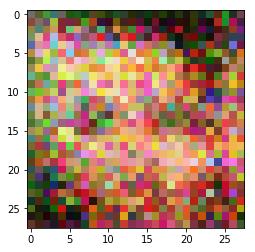

Epoch 2/3... Discriminator Loss: 0.8113... Generator Loss: 1.6220


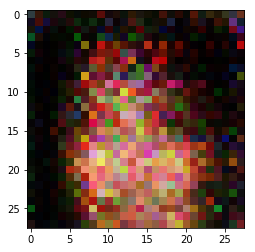

Epoch 2/3... Discriminator Loss: 1.2368... Generator Loss: 1.1694


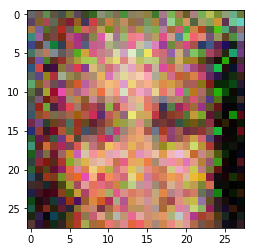

Epoch 2/3... Discriminator Loss: 1.0739... Generator Loss: 1.2019


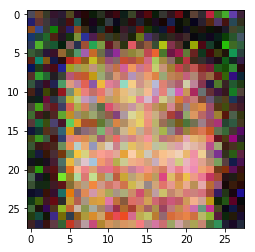

Epoch 2/3... Discriminator Loss: 1.1068... Generator Loss: 1.1497


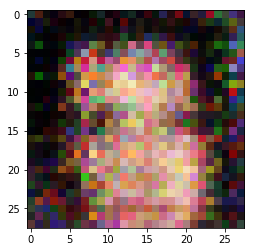

Epoch 2/3... Discriminator Loss: 1.0824... Generator Loss: 1.1288


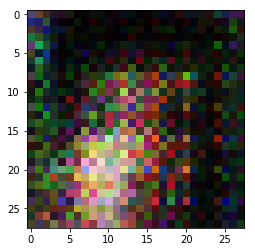

Epoch 2/3... Discriminator Loss: 0.9905... Generator Loss: 1.3429


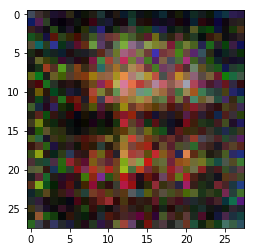

Epoch 2/3... Discriminator Loss: 0.8714... Generator Loss: 1.5360


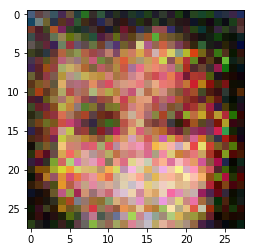

Epoch 2/3... Discriminator Loss: 0.7710... Generator Loss: 2.0273


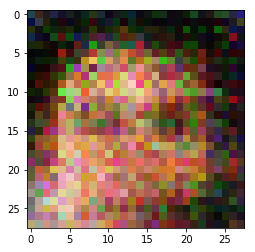

Epoch 2/3... Discriminator Loss: 0.4660... Generator Loss: 2.9026


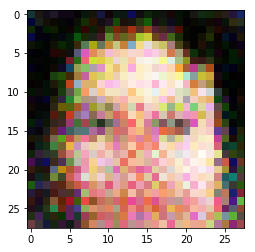

Epoch 2/3... Discriminator Loss: 0.4345... Generator Loss: 2.8849


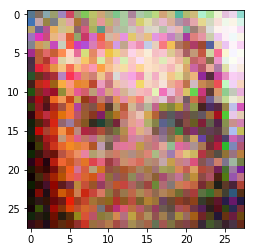

Epoch 2/3... Discriminator Loss: 0.4378... Generator Loss: 2.7365


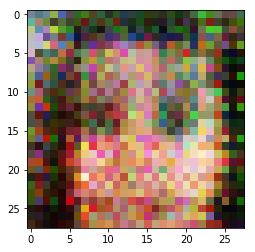

Epoch 2/3... Discriminator Loss: 0.4488... Generator Loss: 2.5210


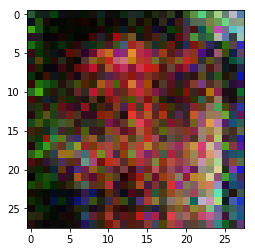

Epoch 2/3... Discriminator Loss: 0.4104... Generator Loss: 3.0769


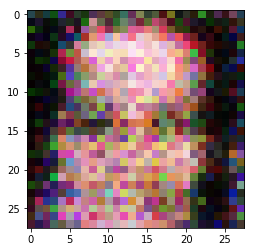

Epoch 2/3... Discriminator Loss: 0.4270... Generator Loss: 2.6247


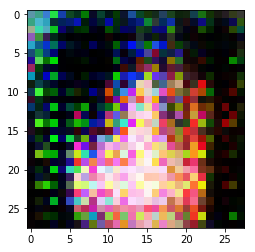

Epoch 3/3... Discriminator Loss: 0.4542... Generator Loss: 3.2894


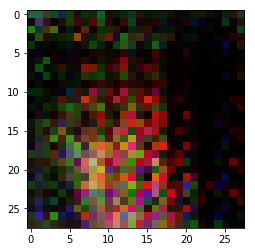

Epoch 3/3... Discriminator Loss: 0.3888... Generator Loss: 3.7819


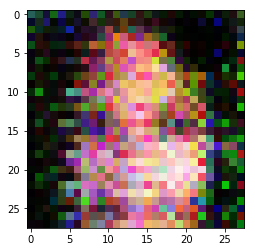

Epoch 3/3... Discriminator Loss: 0.3637... Generator Loss: 3.7624


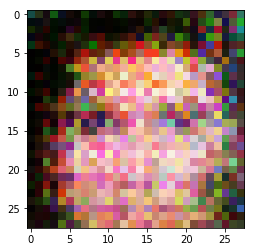

Epoch 3/3... Discriminator Loss: 0.4045... Generator Loss: 2.7701


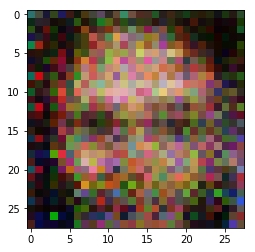

Epoch 3/3... Discriminator Loss: 0.3522... Generator Loss: 4.1257


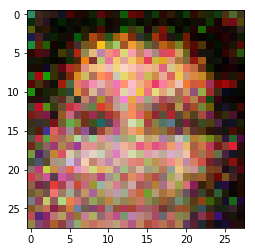

Epoch 3/3... Discriminator Loss: 0.3833... Generator Loss: 3.5342


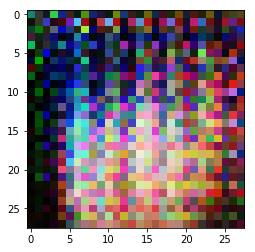

Epoch 3/3... Discriminator Loss: 0.3499... Generator Loss: 4.4480


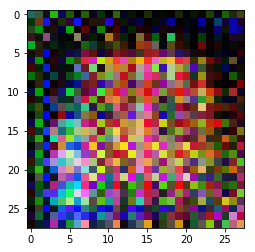

Epoch 3/3... Discriminator Loss: 0.3675... Generator Loss: 3.9166


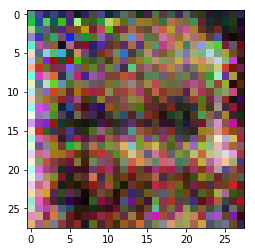

Epoch 3/3... Discriminator Loss: 0.3415... Generator Loss: 4.6750


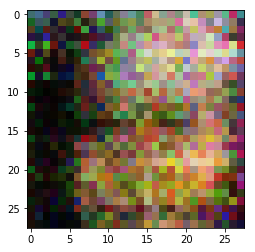

Epoch 3/3... Discriminator Loss: 0.3541... Generator Loss: 4.1442


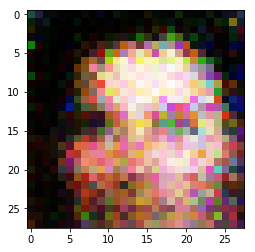

Epoch 3/3... Discriminator Loss: 0.3527... Generator Loss: 4.4801


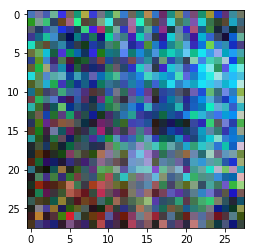

Epoch 3/3... Discriminator Loss: 0.3458... Generator Loss: 4.1499


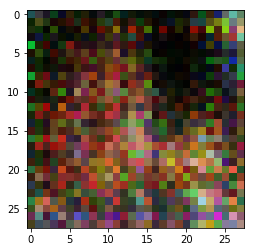

Epoch 3/3... Discriminator Loss: 0.3894... Generator Loss: 4.4070


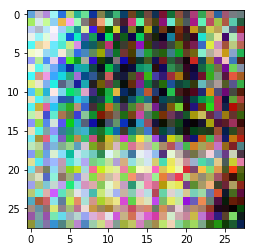

Epoch 3/3... Discriminator Loss: 0.3468... Generator Loss: 4.3698


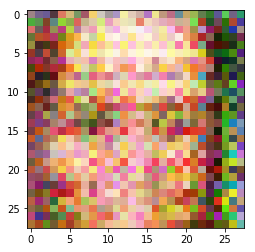

****Whole epochs loss comparison****


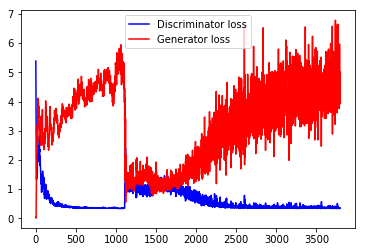

finished


In [24]:
batch_size = 160
z_dim = 128
learning_rate = .0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 1.1691... Generator Loss: 4.4858


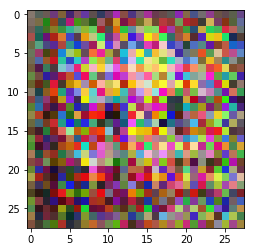

Epoch 1/3... Discriminator Loss: 0.5444... Generator Loss: 2.8330


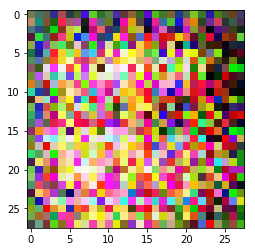

Epoch 1/3... Discriminator Loss: 0.4067... Generator Loss: 3.2293


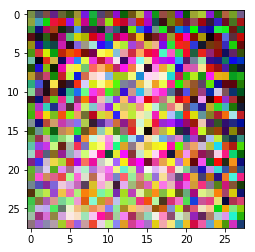

Epoch 1/3... Discriminator Loss: 0.3926... Generator Loss: 3.8622


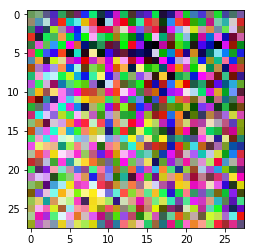

Epoch 1/3... Discriminator Loss: 0.3685... Generator Loss: 4.1066


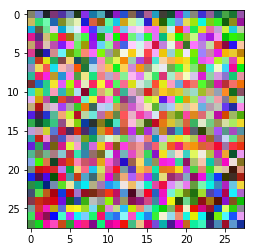

Epoch 1/3... Discriminator Loss: 0.3569... Generator Loss: 3.9561


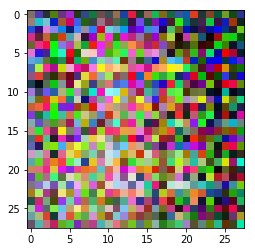

Epoch 1/3... Discriminator Loss: 0.3531... Generator Loss: 4.2038


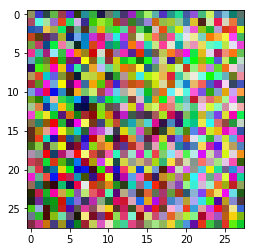

Epoch 1/3... Discriminator Loss: 0.3439... Generator Loss: 4.6901


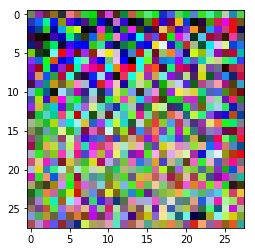

Epoch 1/3... Discriminator Loss: 0.3389... Generator Loss: 4.7748


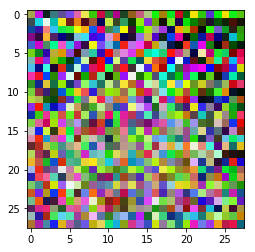

Epoch 1/3... Discriminator Loss: 0.3372... Generator Loss: 4.9222


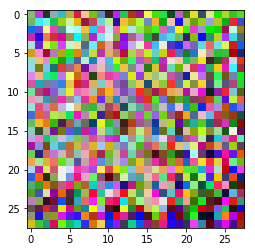

Epoch 1/3... Discriminator Loss: 0.3337... Generator Loss: 5.4902


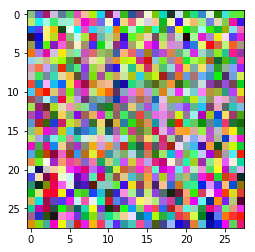

Epoch 1/3... Discriminator Loss: 0.3390... Generator Loss: 4.8252


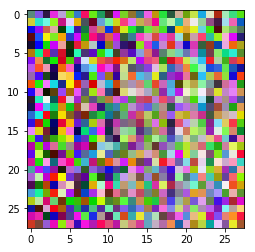

Epoch 1/3... Discriminator Loss: 1.0273... Generator Loss: 1.3986


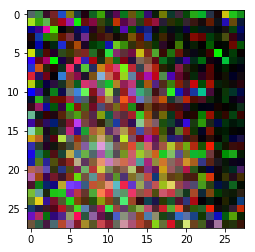

Epoch 1/3... Discriminator Loss: 0.8916... Generator Loss: 2.0020


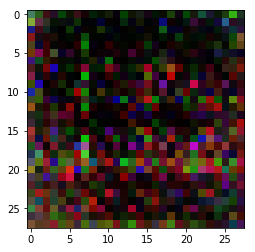

Epoch 2/3... Discriminator Loss: 1.1413... Generator Loss: 1.2373


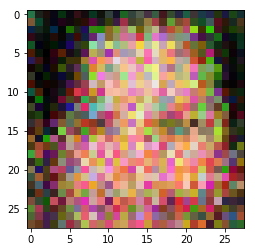

Epoch 2/3... Discriminator Loss: 1.1388... Generator Loss: 1.0350


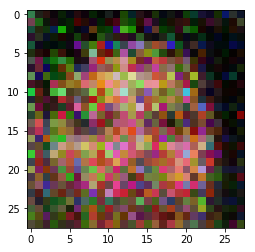

Epoch 2/3... Discriminator Loss: 1.2960... Generator Loss: 1.0757


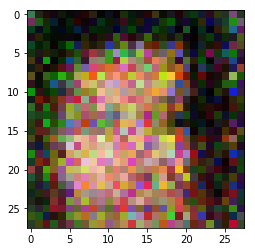

Epoch 2/3... Discriminator Loss: 1.2223... Generator Loss: 1.2601


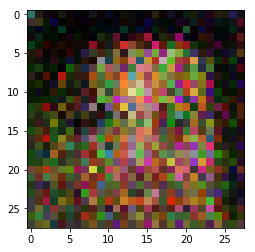

Epoch 2/3... Discriminator Loss: 1.0577... Generator Loss: 1.2631


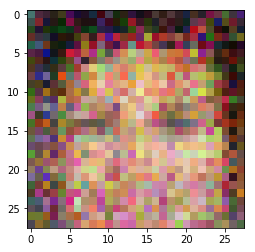

Epoch 2/3... Discriminator Loss: 0.9069... Generator Loss: 1.3390


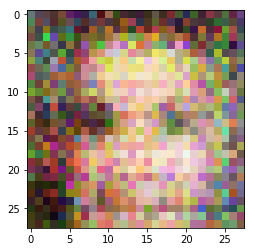

Epoch 2/3... Discriminator Loss: 0.9771... Generator Loss: 1.5780


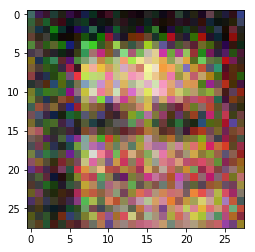

Epoch 2/3... Discriminator Loss: 0.6607... Generator Loss: 1.7706


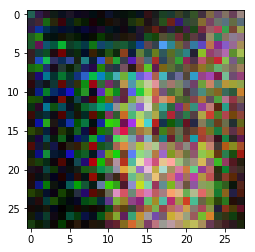

Epoch 2/3... Discriminator Loss: 0.5552... Generator Loss: 2.8020


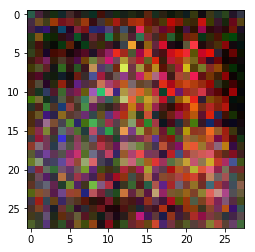

Epoch 2/3... Discriminator Loss: 0.5442... Generator Loss: 2.3748


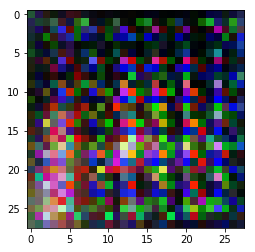

Epoch 2/3... Discriminator Loss: 0.4742... Generator Loss: 2.8483


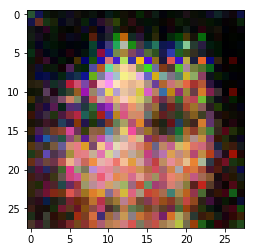

Epoch 2/3... Discriminator Loss: 0.4526... Generator Loss: 2.5360


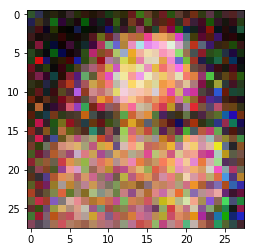

Epoch 2/3... Discriminator Loss: 0.5184... Generator Loss: 2.6377


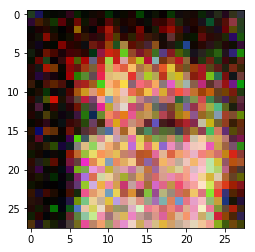

Epoch 2/3... Discriminator Loss: 0.4445... Generator Loss: 2.6504


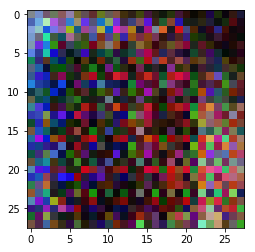

Epoch 3/3... Discriminator Loss: 0.4182... Generator Loss: 3.9328


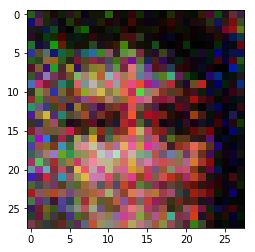

Epoch 3/3... Discriminator Loss: 0.3480... Generator Loss: 4.9072


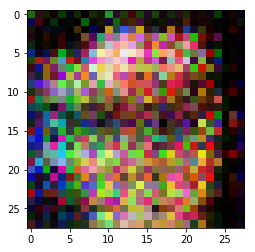

Epoch 3/3... Discriminator Loss: 0.3649... Generator Loss: 3.6967


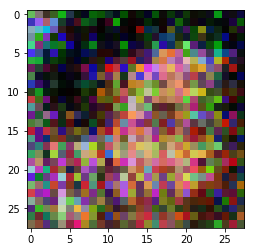

Epoch 3/3... Discriminator Loss: 0.4164... Generator Loss: 2.6503


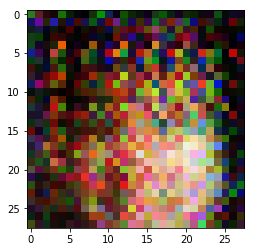

Epoch 3/3... Discriminator Loss: 0.3459... Generator Loss: 4.3713


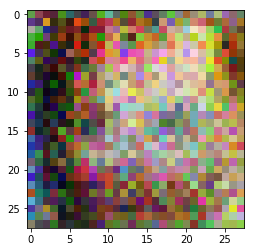

Epoch 3/3... Discriminator Loss: 0.3614... Generator Loss: 3.9472


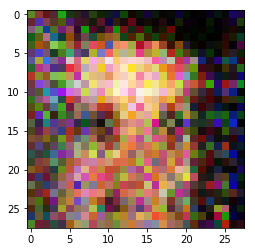

Epoch 3/3... Discriminator Loss: 0.3695... Generator Loss: 3.7704


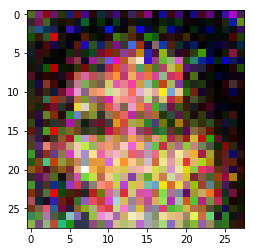

Epoch 3/3... Discriminator Loss: 0.3541... Generator Loss: 3.9866


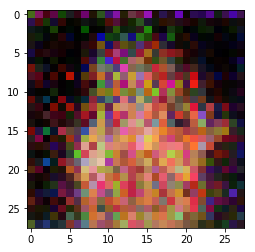

Epoch 3/3... Discriminator Loss: 0.3487... Generator Loss: 4.4518


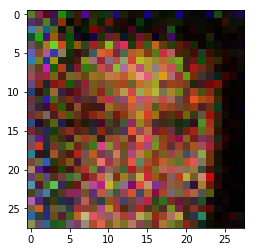

Epoch 3/3... Discriminator Loss: 0.3549... Generator Loss: 3.9773


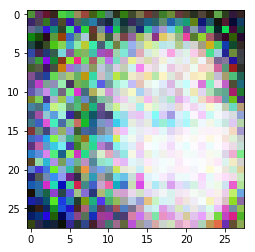

Epoch 3/3... Discriminator Loss: 0.3585... Generator Loss: 4.0076


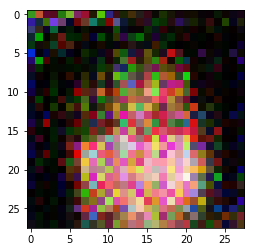

Epoch 3/3... Discriminator Loss: 0.3501... Generator Loss: 4.1077


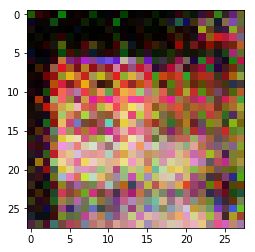

Epoch 3/3... Discriminator Loss: 0.3709... Generator Loss: 4.5779


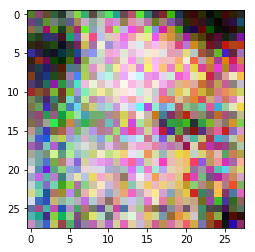

Epoch 3/3... Discriminator Loss: 0.3355... Generator Loss: 5.3608


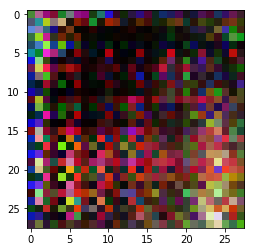

****Whole epochs loss comparison****


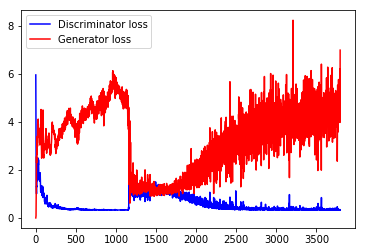

finished


In [26]:
batch_size = 160
z_dim = 128
learning_rate = .0001
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 0.9004... Generator Loss: 4.1311


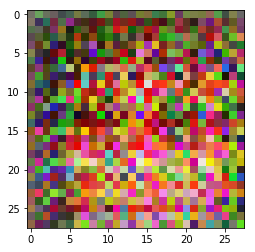

Epoch 1/3... Discriminator Loss: 0.5392... Generator Loss: 3.2758


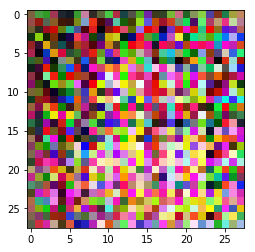

Epoch 1/3... Discriminator Loss: 0.4329... Generator Loss: 3.1806


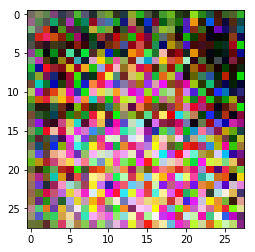

Epoch 1/3... Discriminator Loss: 0.3848... Generator Loss: 3.7272


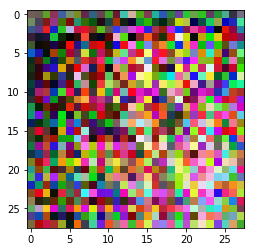

Epoch 1/3... Discriminator Loss: 0.3712... Generator Loss: 3.9080


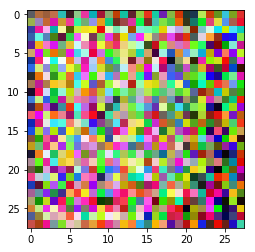

Epoch 1/3... Discriminator Loss: 0.3503... Generator Loss: 4.4217


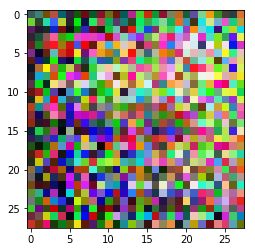

Epoch 1/3... Discriminator Loss: 0.3499... Generator Loss: 4.0766


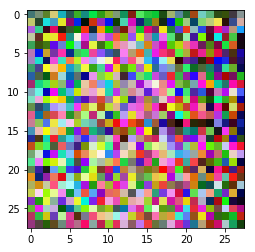

Epoch 1/3... Discriminator Loss: 0.3424... Generator Loss: 4.8684


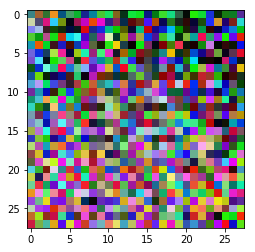

Epoch 1/3... Discriminator Loss: 0.3375... Generator Loss: 4.9983


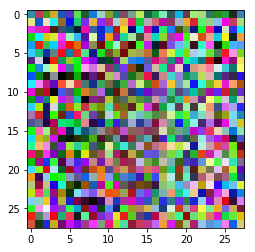

Epoch 1/3... Discriminator Loss: 0.3444... Generator Loss: 4.4320


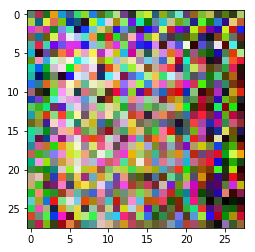

Epoch 1/3... Discriminator Loss: 0.3334... Generator Loss: 5.4893


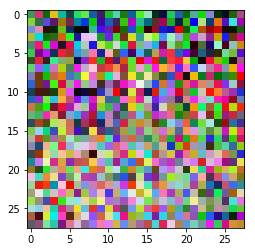

Epoch 1/3... Discriminator Loss: 0.3334... Generator Loss: 5.5330


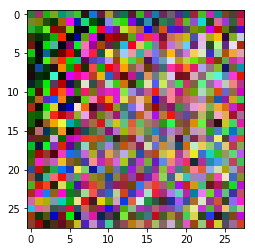

Epoch 1/3... Discriminator Loss: 0.3342... Generator Loss: 5.6245


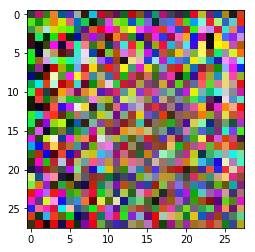

Epoch 1/3... Discriminator Loss: 0.3346... Generator Loss: 5.1319


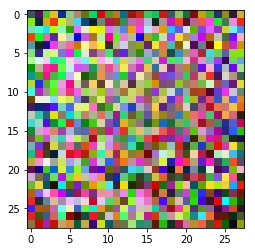

Epoch 2/3... Discriminator Loss: 0.3336... Generator Loss: 5.1001


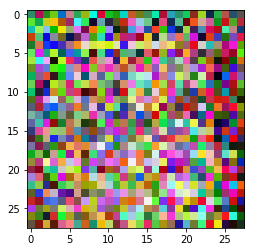

Epoch 2/3... Discriminator Loss: 0.3308... Generator Loss: 6.0012


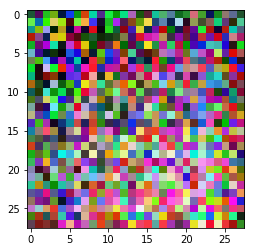

Epoch 2/3... Discriminator Loss: 0.3284... Generator Loss: 6.2517


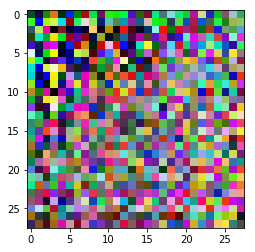

Epoch 2/3... Discriminator Loss: 0.3277... Generator Loss: 7.0310


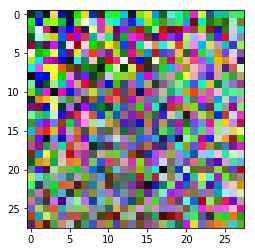

Epoch 2/3... Discriminator Loss: 0.3283... Generator Loss: 6.8180


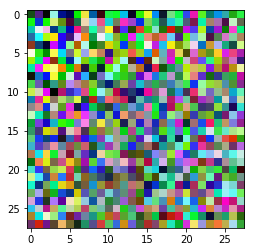

Epoch 2/3... Discriminator Loss: 0.3280... Generator Loss: 6.5529


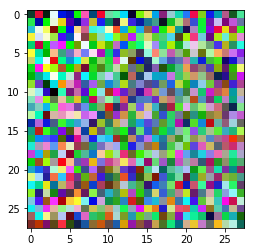

Epoch 2/3... Discriminator Loss: 0.3309... Generator Loss: 5.8149


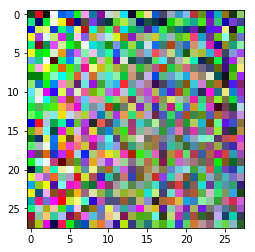

Epoch 2/3... Discriminator Loss: 0.3288... Generator Loss: 6.1487


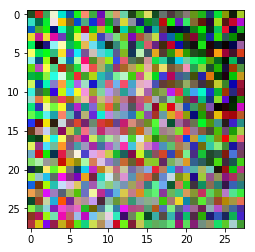

Epoch 2/3... Discriminator Loss: 0.3288... Generator Loss: 6.1039


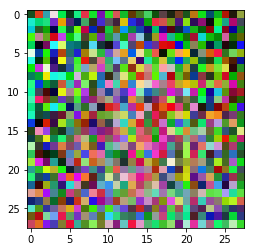

Epoch 2/3... Discriminator Loss: 0.3313... Generator Loss: 5.7133


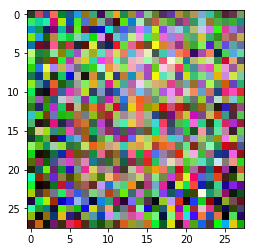

Epoch 2/3... Discriminator Loss: 0.3289... Generator Loss: 6.9259


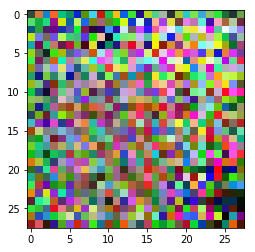

Epoch 2/3... Discriminator Loss: 0.3273... Generator Loss: 7.2801


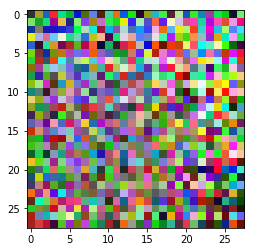

Epoch 2/3... Discriminator Loss: 0.3267... Generator Loss: 7.6585


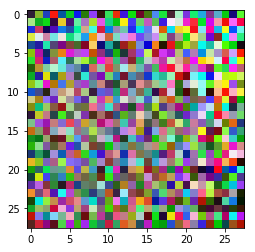

Epoch 2/3... Discriminator Loss: 0.3269... Generator Loss: 7.8501


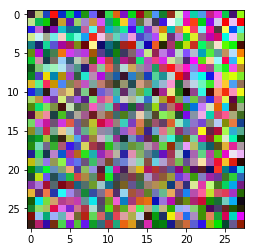

Epoch 3/3... Discriminator Loss: 0.3262... Generator Loss: 7.7379


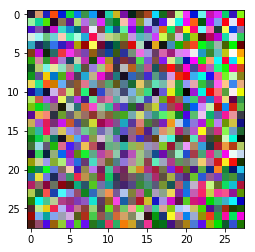

Epoch 3/3... Discriminator Loss: 0.3297... Generator Loss: 6.0188


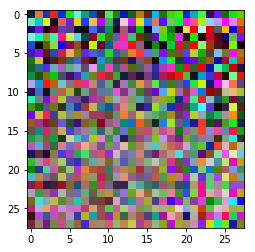

Epoch 3/3... Discriminator Loss: 0.7983... Generator Loss: 1.4183


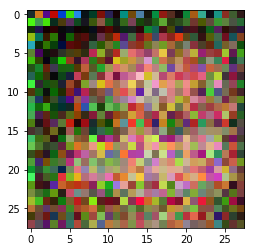

Epoch 3/3... Discriminator Loss: 0.7119... Generator Loss: 2.5864


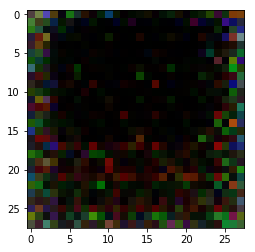

Epoch 3/3... Discriminator Loss: 0.9578... Generator Loss: 1.5439


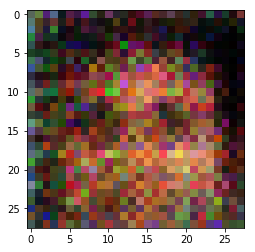

Epoch 3/3... Discriminator Loss: 1.0561... Generator Loss: 1.7248


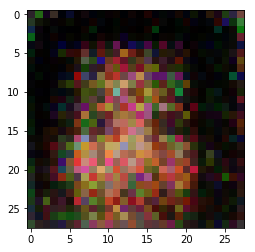

Epoch 3/3... Discriminator Loss: 1.1111... Generator Loss: 1.4478


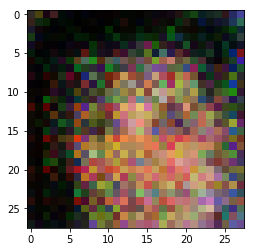

Epoch 3/3... Discriminator Loss: 0.8539... Generator Loss: 1.7593


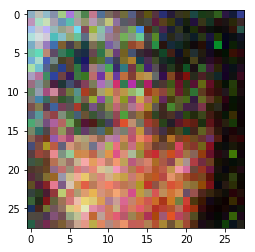

Epoch 3/3... Discriminator Loss: 1.0385... Generator Loss: 1.6017


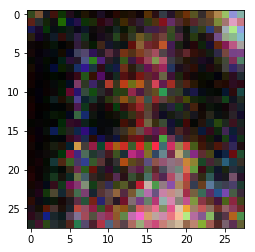

Epoch 3/3... Discriminator Loss: 0.7093... Generator Loss: 1.7398


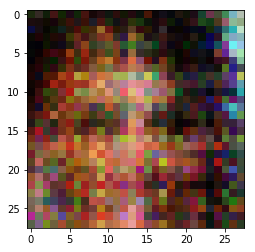

Epoch 3/3... Discriminator Loss: 0.8270... Generator Loss: 2.0826


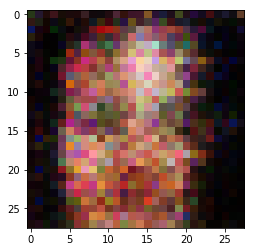

Epoch 3/3... Discriminator Loss: 0.5007... Generator Loss: 3.2596


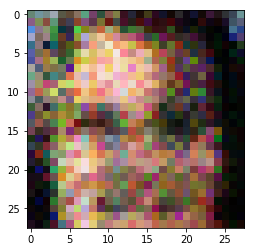

Epoch 3/3... Discriminator Loss: 0.3703... Generator Loss: 3.6692


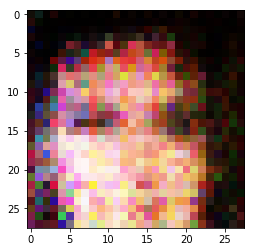

Epoch 3/3... Discriminator Loss: 0.3949... Generator Loss: 3.1823


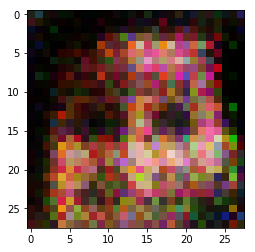

****Whole epochs loss comparison****


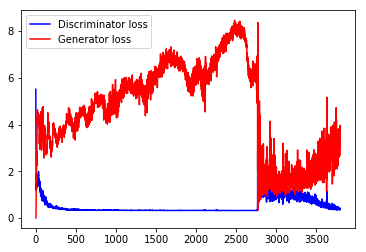

finished


In [27]:
batch_size = 160
z_dim = 128
learning_rate = .0001
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 0.8273... Generator Loss: 3.3608


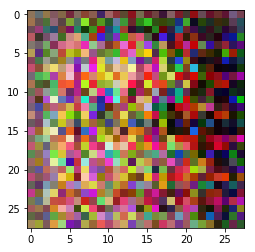

Epoch 1/3... Discriminator Loss: 0.4719... Generator Loss: 3.6908


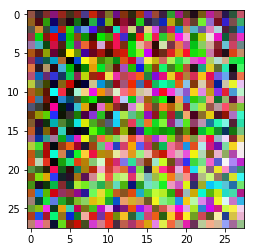

Epoch 1/3... Discriminator Loss: 0.4195... Generator Loss: 4.2444


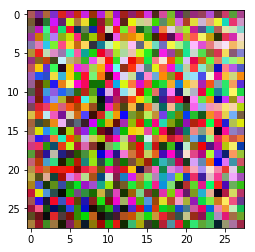

Epoch 1/3... Discriminator Loss: 0.3944... Generator Loss: 3.5901


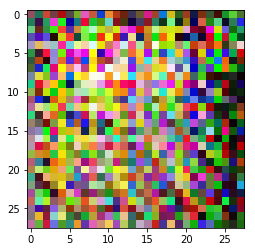

Epoch 1/3... Discriminator Loss: 0.3734... Generator Loss: 3.8278


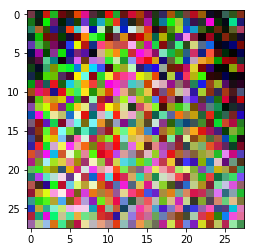

Epoch 1/3... Discriminator Loss: 0.3517... Generator Loss: 4.3275


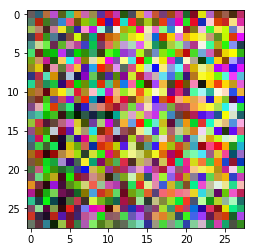

Epoch 1/3... Discriminator Loss: 0.3386... Generator Loss: 4.8590


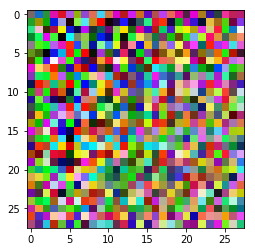

Epoch 1/3... Discriminator Loss: 0.3427... Generator Loss: 4.8062


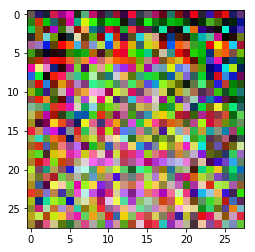

Epoch 1/3... Discriminator Loss: 0.3370... Generator Loss: 5.1965


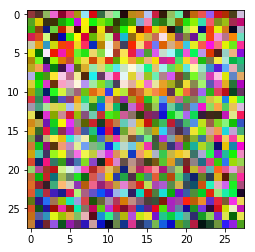

Epoch 1/3... Discriminator Loss: 0.3332... Generator Loss: 5.5009


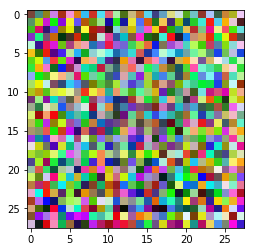

Epoch 1/3... Discriminator Loss: 0.3314... Generator Loss: 5.6928


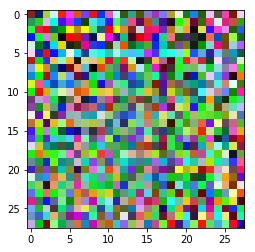

Epoch 1/3... Discriminator Loss: 0.3361... Generator Loss: 5.0158


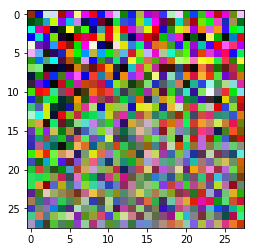

Epoch 1/3... Discriminator Loss: 0.3366... Generator Loss: 5.0474


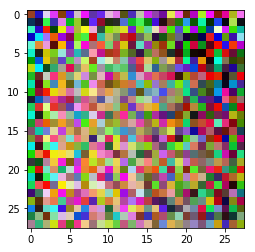

Epoch 1/3... Discriminator Loss: 0.3332... Generator Loss: 5.4332


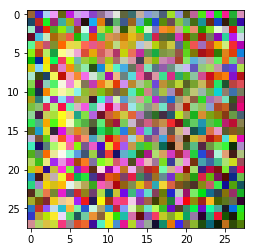

Epoch 2/3... Discriminator Loss: 0.3303... Generator Loss: 5.9094


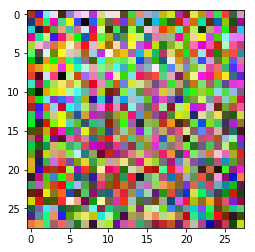

Epoch 2/3... Discriminator Loss: 0.3339... Generator Loss: 5.4833


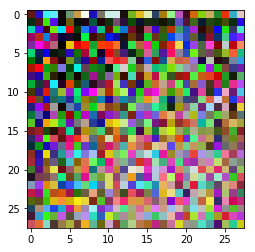

Epoch 2/3... Discriminator Loss: 0.3303... Generator Loss: 5.9267


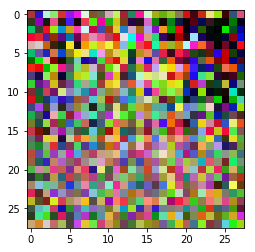

Epoch 2/3... Discriminator Loss: 0.3283... Generator Loss: 6.6240


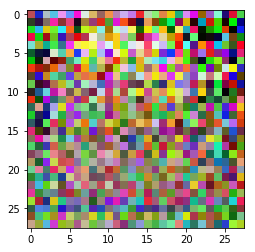

Epoch 2/3... Discriminator Loss: 0.3281... Generator Loss: 6.4607


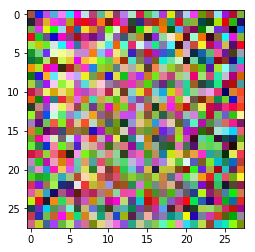

Epoch 2/3... Discriminator Loss: 0.3271... Generator Loss: 7.3021


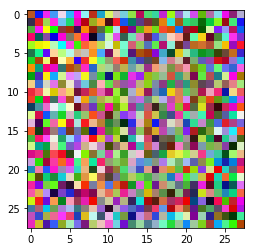

Epoch 2/3... Discriminator Loss: 0.3279... Generator Loss: 6.7060


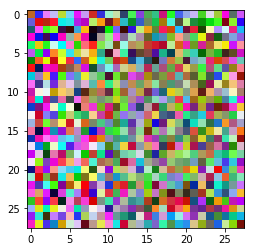

Epoch 2/3... Discriminator Loss: 0.3288... Generator Loss: 6.2761


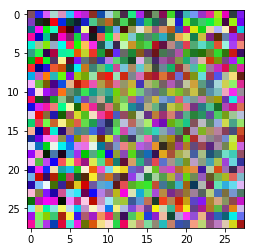

Epoch 2/3... Discriminator Loss: 0.3278... Generator Loss: 6.4590


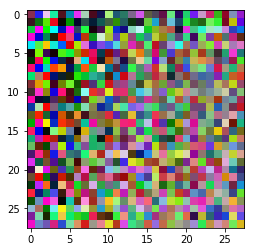

Epoch 2/3... Discriminator Loss: 0.3316... Generator Loss: 6.2142


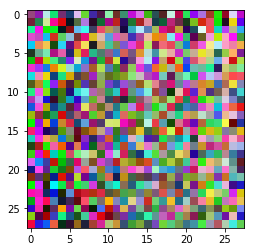

Epoch 2/3... Discriminator Loss: 0.3285... Generator Loss: 6.5728


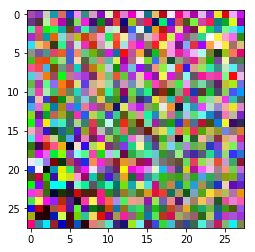

Epoch 2/3... Discriminator Loss: 0.3270... Generator Loss: 7.1488


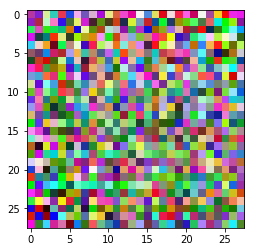

Epoch 2/3... Discriminator Loss: 0.3269... Generator Loss: 7.3613


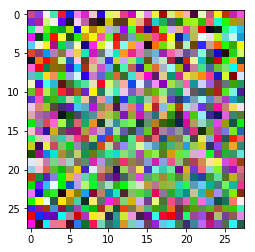

Epoch 2/3... Discriminator Loss: 0.3304... Generator Loss: 5.6279


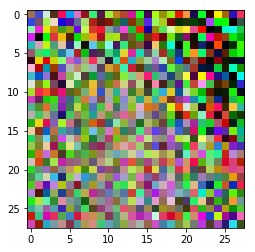

Epoch 3/3... Discriminator Loss: 1.8593... Generator Loss: 3.3954


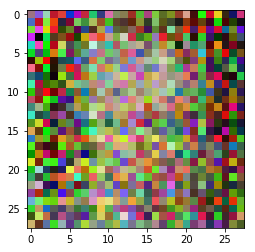

Epoch 3/3... Discriminator Loss: 1.0898... Generator Loss: 1.1300


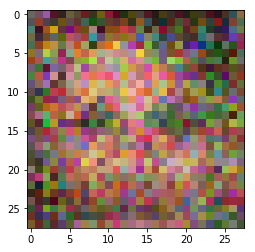

Epoch 3/3... Discriminator Loss: 1.2244... Generator Loss: 1.7859


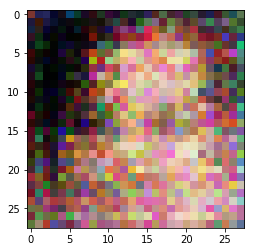

Epoch 3/3... Discriminator Loss: 0.8595... Generator Loss: 1.4819


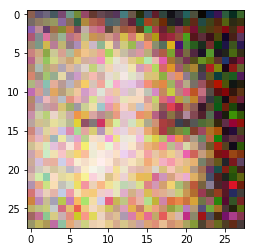

Epoch 3/3... Discriminator Loss: 1.0356... Generator Loss: 1.4631


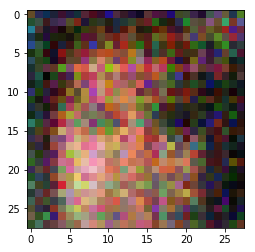

Epoch 3/3... Discriminator Loss: 0.7748... Generator Loss: 1.6810


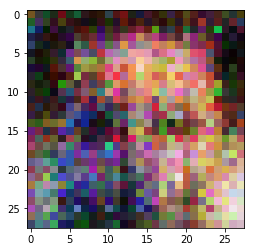

Epoch 3/3... Discriminator Loss: 1.0502... Generator Loss: 1.4408


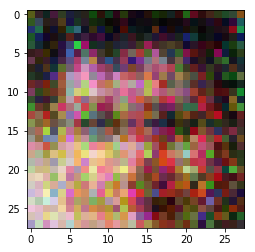

Epoch 3/3... Discriminator Loss: 0.6421... Generator Loss: 2.1588


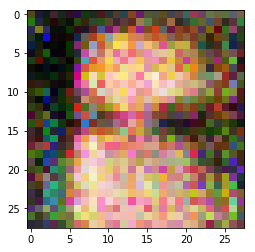

Epoch 3/3... Discriminator Loss: 0.6573... Generator Loss: 1.6986


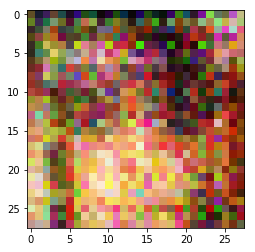

Epoch 3/3... Discriminator Loss: 0.4429... Generator Loss: 2.6082


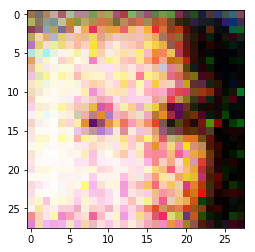

Epoch 3/3... Discriminator Loss: 0.4169... Generator Loss: 3.2248


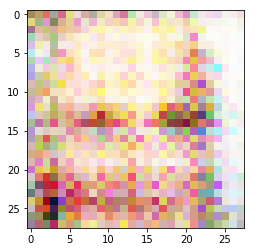

Epoch 3/3... Discriminator Loss: 0.3585... Generator Loss: 3.9239


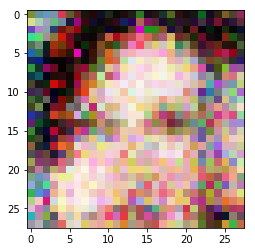

Epoch 3/3... Discriminator Loss: 0.5450... Generator Loss: 5.6130


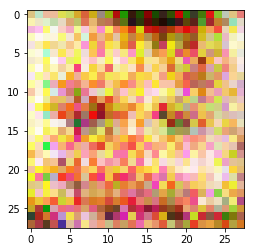

Epoch 3/3... Discriminator Loss: 0.3634... Generator Loss: 3.6321


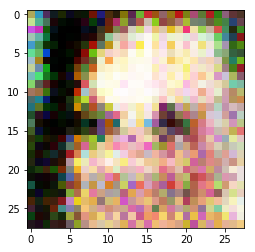

****Whole epochs loss comparison****


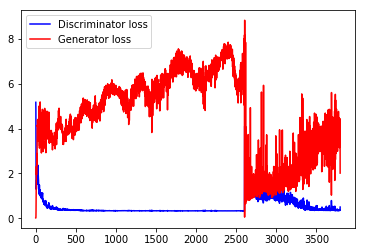

finished


In [28]:
batch_size = 160
z_dim = 128
learning_rate = .0001
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 1.4081... Generator Loss: 2.7701


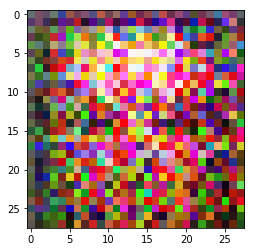

Epoch 1/3... Discriminator Loss: 0.9676... Generator Loss: 2.5690


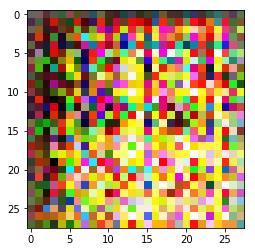

Epoch 1/3... Discriminator Loss: 0.4814... Generator Loss: 2.9825


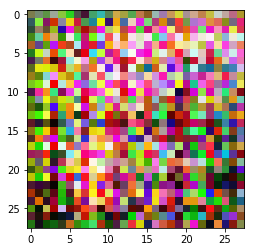

Epoch 1/3... Discriminator Loss: 1.5396... Generator Loss: 0.9701


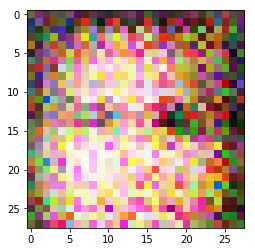

Epoch 1/3... Discriminator Loss: 1.2084... Generator Loss: 1.0507


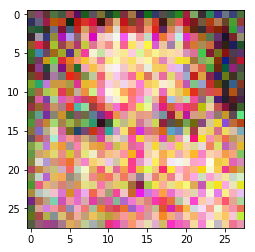

Epoch 1/3... Discriminator Loss: 1.1772... Generator Loss: 1.1676


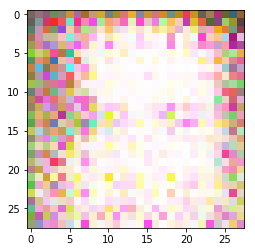

Epoch 1/3... Discriminator Loss: 0.9969... Generator Loss: 1.3217


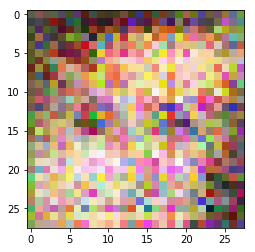

Epoch 1/3... Discriminator Loss: 1.1662... Generator Loss: 1.2520


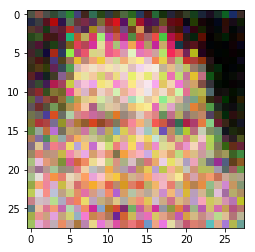

Epoch 1/3... Discriminator Loss: 1.5942... Generator Loss: 0.7836


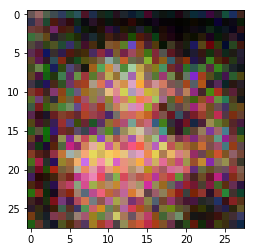

Epoch 1/3... Discriminator Loss: 1.3237... Generator Loss: 0.8625


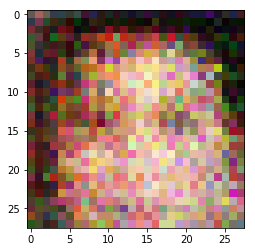

Epoch 1/3... Discriminator Loss: 1.4589... Generator Loss: 0.7359


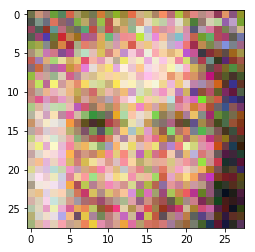

Epoch 1/3... Discriminator Loss: 1.2491... Generator Loss: 0.9889


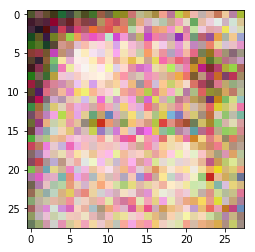

Epoch 1/3... Discriminator Loss: 1.3268... Generator Loss: 0.9228


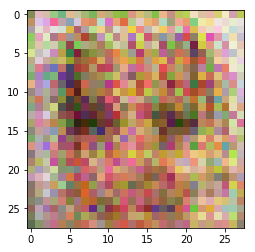

Epoch 1/3... Discriminator Loss: 1.2131... Generator Loss: 0.9801


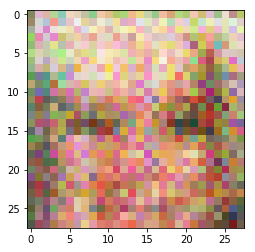

Epoch 2/3... Discriminator Loss: 1.2628... Generator Loss: 1.0916


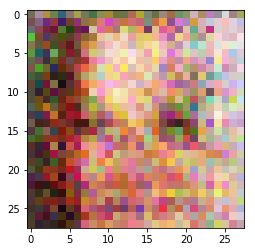

Epoch 2/3... Discriminator Loss: 1.3537... Generator Loss: 0.9827


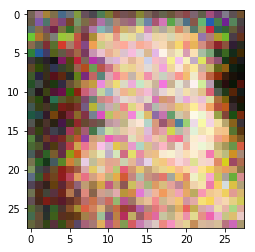

Epoch 2/3... Discriminator Loss: 1.1939... Generator Loss: 1.1231


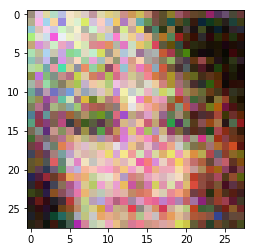

Epoch 2/3... Discriminator Loss: 1.0594... Generator Loss: 1.2140


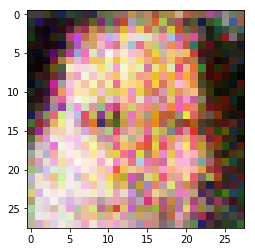

Epoch 2/3... Discriminator Loss: 1.1436... Generator Loss: 1.2143


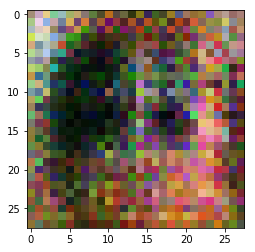

Epoch 2/3... Discriminator Loss: 1.0086... Generator Loss: 1.0458


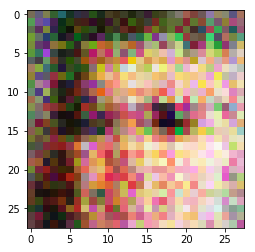

Epoch 2/3... Discriminator Loss: 0.8670... Generator Loss: 1.5452


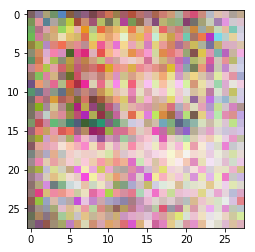

Epoch 2/3... Discriminator Loss: 0.7038... Generator Loss: 1.7268


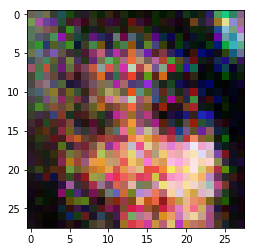

Epoch 2/3... Discriminator Loss: 0.5240... Generator Loss: 2.0600


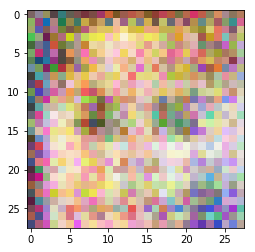

Epoch 2/3... Discriminator Loss: 0.4577... Generator Loss: 2.9094


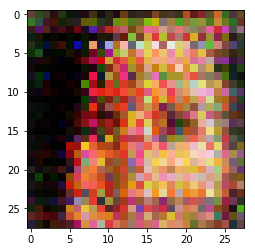

Epoch 2/3... Discriminator Loss: 0.6297... Generator Loss: 1.6056


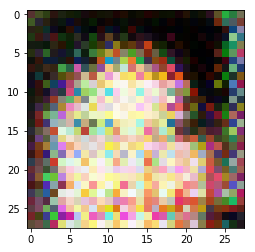

Epoch 2/3... Discriminator Loss: 0.4709... Generator Loss: 2.9135


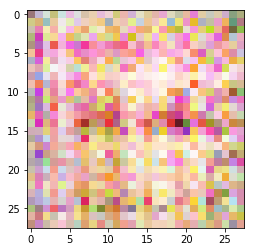

Epoch 2/3... Discriminator Loss: 0.4879... Generator Loss: 2.2337


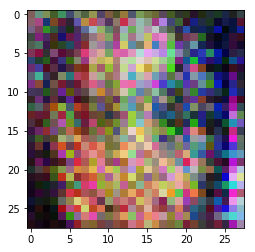

Epoch 2/3... Discriminator Loss: 0.4363... Generator Loss: 2.9282


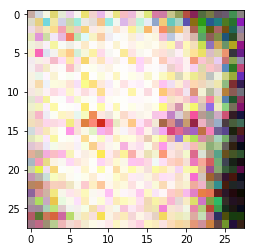

Epoch 3/3... Discriminator Loss: 0.4127... Generator Loss: 3.0638


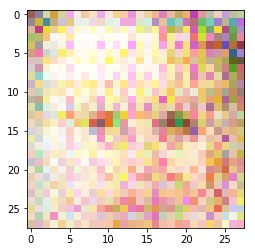

Epoch 3/3... Discriminator Loss: 0.3756... Generator Loss: 4.0558


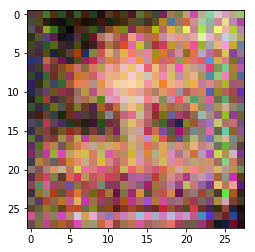

Epoch 3/3... Discriminator Loss: 0.3690... Generator Loss: 3.8401


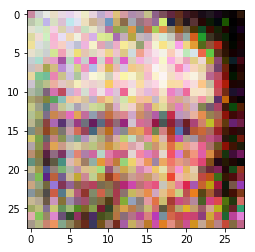

Epoch 3/3... Discriminator Loss: 0.4052... Generator Loss: 2.9172


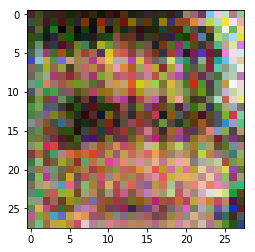

Epoch 3/3... Discriminator Loss: 0.3453... Generator Loss: 4.6697


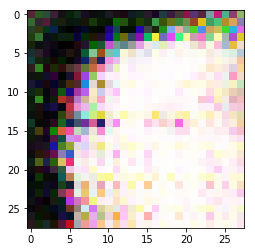

Epoch 3/3... Discriminator Loss: 0.3915... Generator Loss: 3.8672


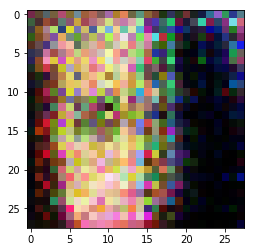

Epoch 3/3... Discriminator Loss: 0.3890... Generator Loss: 3.3106


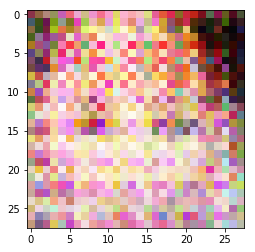

Epoch 3/3... Discriminator Loss: 0.3808... Generator Loss: 3.9149


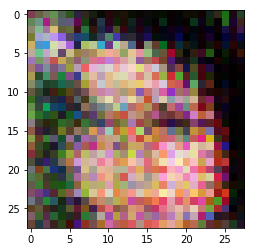

Epoch 3/3... Discriminator Loss: 0.3444... Generator Loss: 4.4471


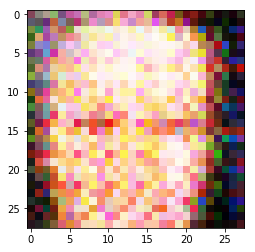

Epoch 3/3... Discriminator Loss: 0.3622... Generator Loss: 4.7348


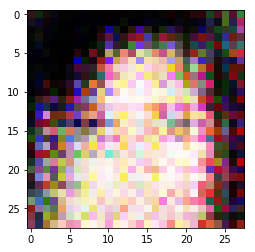

Epoch 3/3... Discriminator Loss: 0.3569... Generator Loss: 4.1762


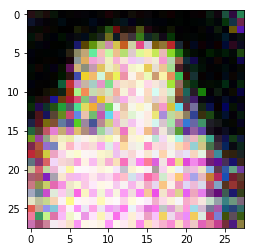

Epoch 3/3... Discriminator Loss: 0.3501... Generator Loss: 4.3383


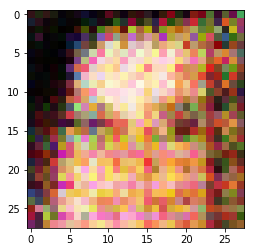

Epoch 3/3... Discriminator Loss: 0.3982... Generator Loss: 4.0317


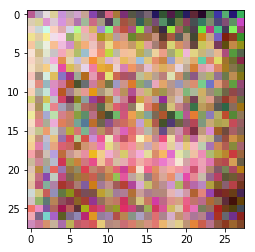

Epoch 3/3... Discriminator Loss: 0.3533... Generator Loss: 4.9099


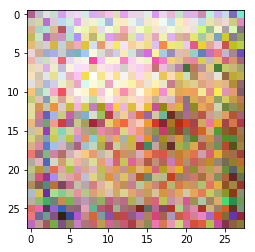

****Whole epochs loss comparison****


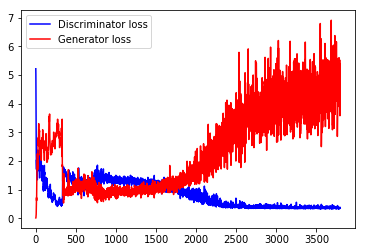

finished


In [29]:
batch_size = 160
z_dim = 128
learning_rate = .0001
beta1 = 0.7


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

In [25]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
  

    
    #print(data_shape)
    step = 0
    real_input,z_input,lr = model_inputs(data_shape[1],data_shape[2],data_shape[3], z_dim)
    
    d_loss, g_loss = model_loss(real_input, z_input, data_shape[3])
    
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    
    d_loss_change =[]
    g_loss_change =[]
    
    d_loss_local_change =[]
    g_loss_local_change =[]
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            
            for batch_images in get_batches(batch_size):
                #print(batch_images.shape)
                
                
                step += 1
                # TODO: Train Model
                batch_z = np.random.uniform(-1,1 , size=(batch_size, z_dim))

                #print('batch_z shape',batch_z.shape)
                batch_images = batch_images * 2
                # Run optimizers
                _ = sess.run(g_train_opt, feed_dict = {z_input: batch_z, real_input: batch_images, lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict = {z_input: batch_z, real_input: batch_images, lr: learning_rate})
                _ = sess.run(d_train_opt, feed_dict = {real_input: batch_images, z_input: batch_z,lr: learning_rate})
                
                d, g = sess.run([d_loss, g_loss], feed_dict={z_input: batch_z, real_input: batch_images})
                #print(d,g)
                d_loss_change.append(d)
                g_loss_change.append(g)
                
                d_loss_local_change.append(d)

                g_loss_local_change.append(g)
                
                if step % 90 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({z_input: batch_z, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
               
                    show_generator_output(sess,96, z_input, data_shape[3], data_image_mode)
    
#                     Discriminator_loss, = plt.plot(d_loss_local_change, color='b', label='Discriminator loss')
#                     Genereator_loss, = plt.plot(g_loss_local_change, color='r', label='Generator loss')
#                     plt.legend(handles=[ Discriminator_loss, Genereator_loss])
#                     print("****Local Iteration loss comparison****")
#                     plt.show()
#                     d_loss_local_change.clear()
#                     g_loss_local_change.clear()

    Discriminator_loss, = plt.plot(d_loss_change, color='b', label='Discriminator loss')
    Genereator_loss, = plt.plot(g_loss_change, color='r', label='Generator loss')
    plt.legend(handles=[ Discriminator_loss, Genereator_loss])
    print("****Whole epochs loss comparison****")
    plt.show()

             
                

Epoch 1/3... Discriminator Loss: 1.0692... Generator Loss: 3.8789


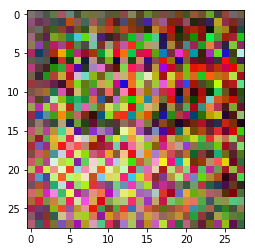

Epoch 1/3... Discriminator Loss: 0.5506... Generator Loss: 3.7154


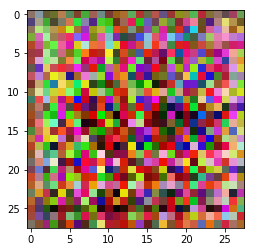

Epoch 1/3... Discriminator Loss: 0.4745... Generator Loss: 3.0883


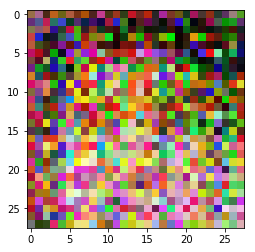

Epoch 1/3... Discriminator Loss: 0.4512... Generator Loss: 3.0524


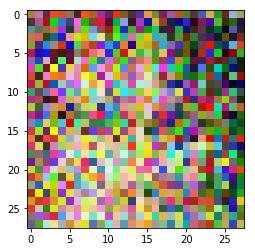

Epoch 1/3... Discriminator Loss: 0.3697... Generator Loss: 3.8383


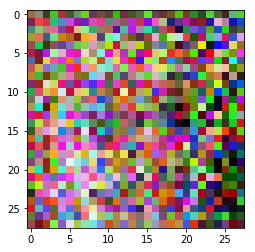

Epoch 1/3... Discriminator Loss: 0.3590... Generator Loss: 4.4306


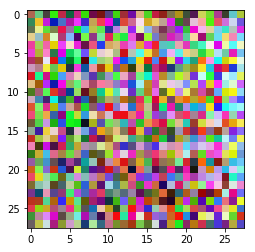

Epoch 1/3... Discriminator Loss: 0.3465... Generator Loss: 4.3845


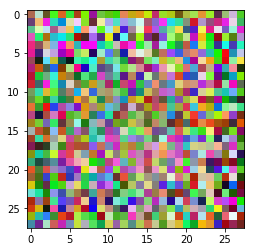

Epoch 1/3... Discriminator Loss: 0.3527... Generator Loss: 4.3012


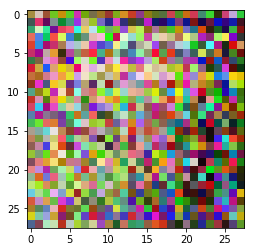

Epoch 1/3... Discriminator Loss: 0.3720... Generator Loss: 3.6843


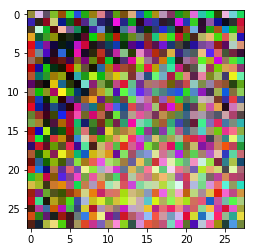

Epoch 1/3... Discriminator Loss: 0.3415... Generator Loss: 4.9305


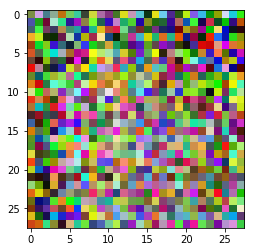

Epoch 1/3... Discriminator Loss: 0.3331... Generator Loss: 5.8451


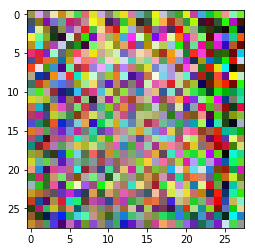

Epoch 1/3... Discriminator Loss: 0.3373... Generator Loss: 4.9159


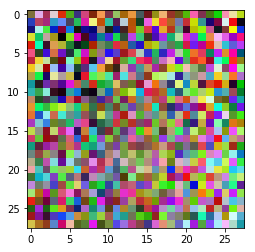

Epoch 1/3... Discriminator Loss: 0.3326... Generator Loss: 5.6036


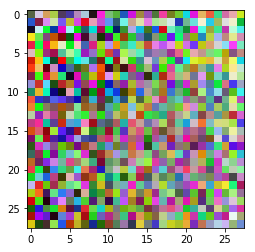

Epoch 1/3... Discriminator Loss: 0.3349... Generator Loss: 5.5601


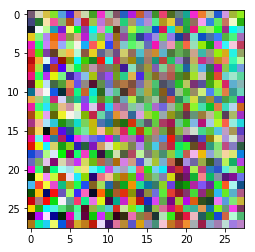

Epoch 2/3... Discriminator Loss: 0.3344... Generator Loss: 5.2958


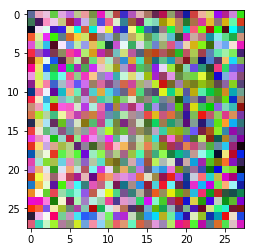

Epoch 2/3... Discriminator Loss: 0.3361... Generator Loss: 5.0917


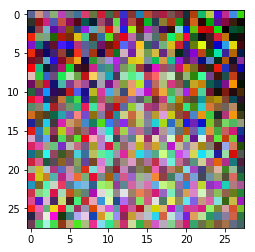

Epoch 2/3... Discriminator Loss: 0.3359... Generator Loss: 5.3636


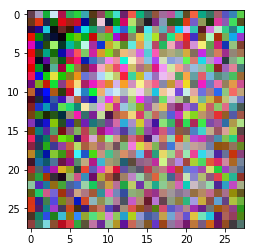

Epoch 2/3... Discriminator Loss: 0.3314... Generator Loss: 6.2110


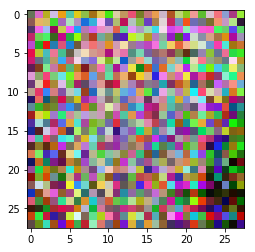

Epoch 2/3... Discriminator Loss: 0.3292... Generator Loss: 6.4012


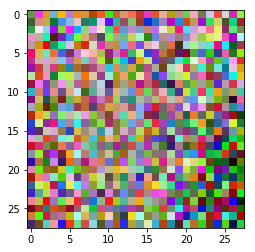

Epoch 2/3... Discriminator Loss: 0.3306... Generator Loss: 5.6926


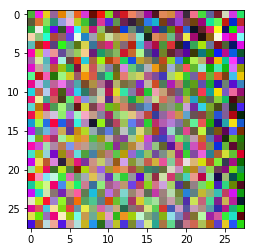

Epoch 2/3... Discriminator Loss: 0.3351... Generator Loss: 5.5597


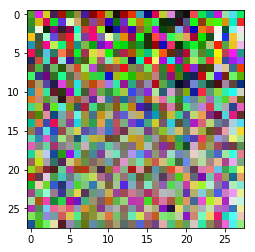

Epoch 2/3... Discriminator Loss: 0.3320... Generator Loss: 6.2964


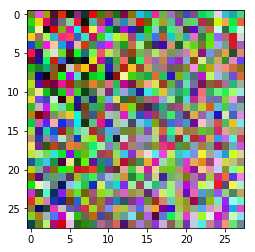

Epoch 2/3... Discriminator Loss: 0.3290... Generator Loss: 6.5312


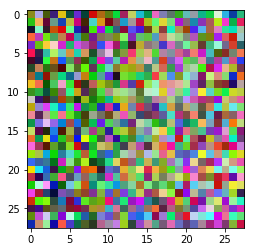

Epoch 2/3... Discriminator Loss: 0.3302... Generator Loss: 6.6217


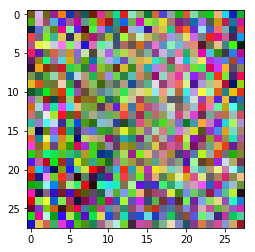

Epoch 2/3... Discriminator Loss: 0.3280... Generator Loss: 6.4614


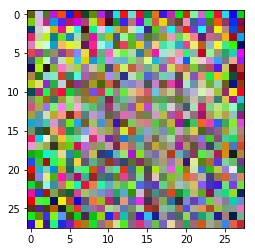

Epoch 2/3... Discriminator Loss: 0.3303... Generator Loss: 6.1838


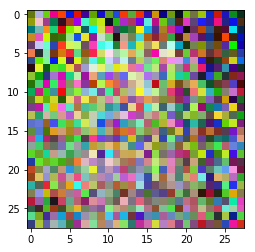

Epoch 2/3... Discriminator Loss: 0.3428... Generator Loss: 4.3031


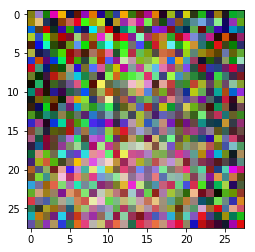

Epoch 2/3... Discriminator Loss: 1.0783... Generator Loss: 1.4671


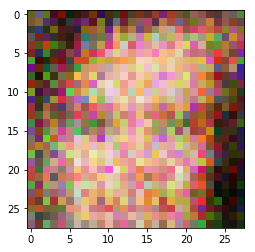

Epoch 3/3... Discriminator Loss: 0.9618... Generator Loss: 1.4937


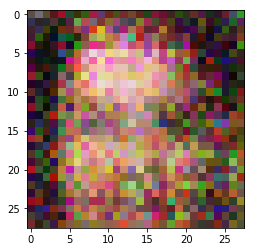

Epoch 3/3... Discriminator Loss: 0.7564... Generator Loss: 1.9593


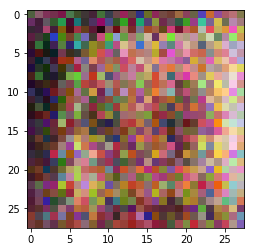

Epoch 3/3... Discriminator Loss: 1.0591... Generator Loss: 1.5820


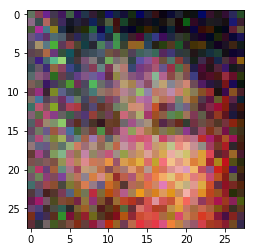

Epoch 3/3... Discriminator Loss: 1.0866... Generator Loss: 1.2841


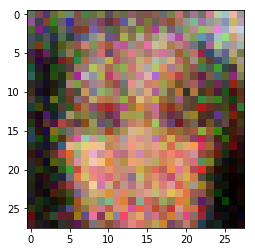

Epoch 3/3... Discriminator Loss: 1.0984... Generator Loss: 1.2632


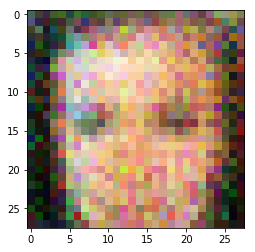

Epoch 3/3... Discriminator Loss: 0.9502... Generator Loss: 1.9488


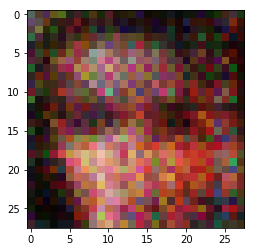

Epoch 3/3... Discriminator Loss: 0.8369... Generator Loss: 1.6686


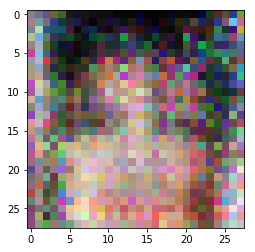

Epoch 3/3... Discriminator Loss: 0.6667... Generator Loss: 2.7843


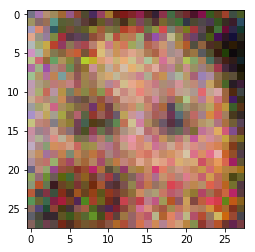

Epoch 3/3... Discriminator Loss: 0.5152... Generator Loss: 2.0241


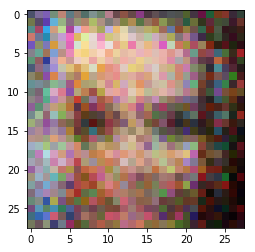

Epoch 3/3... Discriminator Loss: 0.3734... Generator Loss: 3.5683


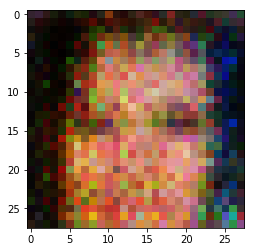

Epoch 3/3... Discriminator Loss: 0.3526... Generator Loss: 4.1535


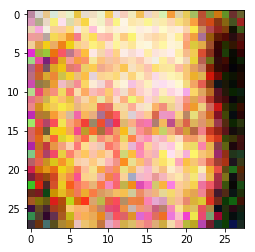

Epoch 3/3... Discriminator Loss: 0.3470... Generator Loss: 4.3883


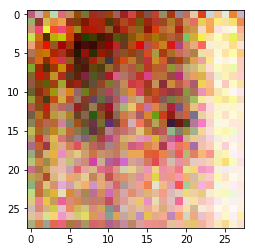

Epoch 3/3... Discriminator Loss: 0.3623... Generator Loss: 3.8991


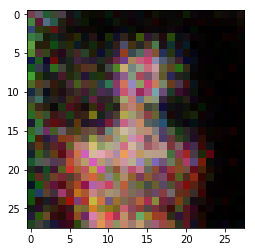

Epoch 3/3... Discriminator Loss: 0.3845... Generator Loss: 3.1038


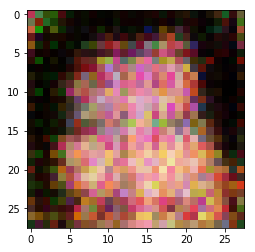

****Whole epochs loss comparison****


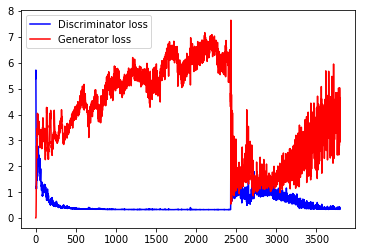

finished


In [16]:
batch_size = 160
z_dim = 128
learning_rate = .0001
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 1.1015... Generator Loss: 1.8386


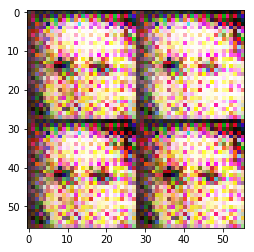

Epoch 1/3... Discriminator Loss: 1.2833... Generator Loss: 1.1397


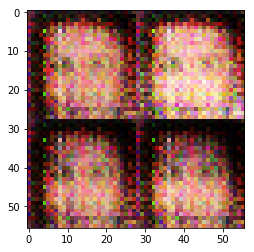

Epoch 1/3... Discriminator Loss: 1.0662... Generator Loss: 1.0624


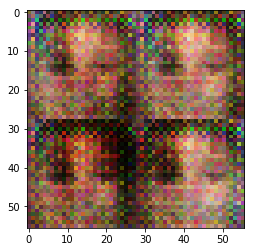

Epoch 1/3... Discriminator Loss: 0.9263... Generator Loss: 1.1985


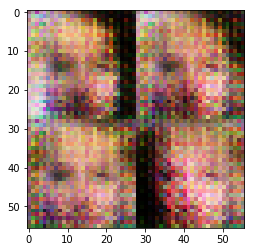

Epoch 1/3... Discriminator Loss: 0.7725... Generator Loss: 2.0079


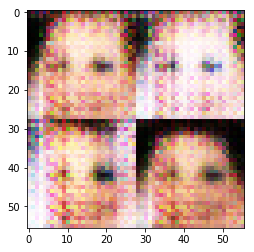

Epoch 1/3... Discriminator Loss: 0.5490... Generator Loss: 1.8379


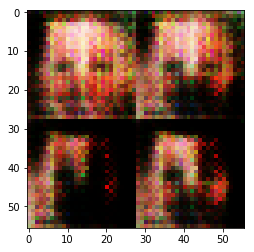

Epoch 1/3... Discriminator Loss: 0.3817... Generator Loss: 3.3958


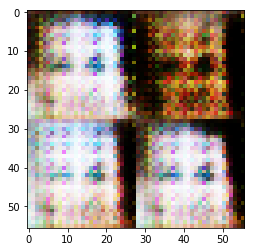

Epoch 1/3... Discriminator Loss: 0.5047... Generator Loss: 2.0284


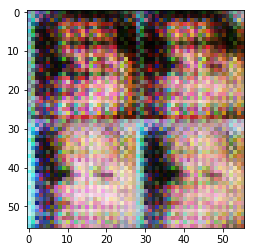

Epoch 1/3... Discriminator Loss: 0.3697... Generator Loss: 5.3881


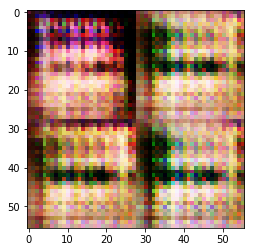

Epoch 1/3... Discriminator Loss: 0.5905... Generator Loss: 2.6895


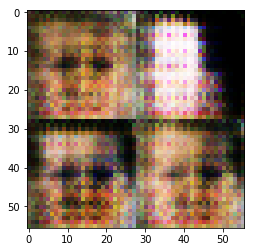

Epoch 1/3... Discriminator Loss: 0.3897... Generator Loss: 3.3100


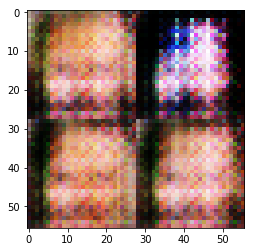

Epoch 1/3... Discriminator Loss: 0.4112... Generator Loss: 5.4217


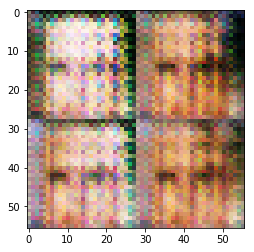

Epoch 1/3... Discriminator Loss: 0.3686... Generator Loss: 3.8211


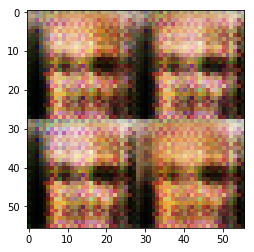

Epoch 1/3... Discriminator Loss: 0.3464... Generator Loss: 4.7292


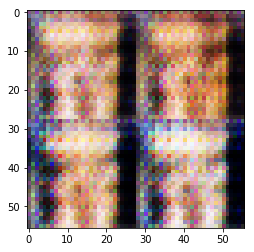

Epoch 2/3... Discriminator Loss: 0.4278... Generator Loss: 2.6937


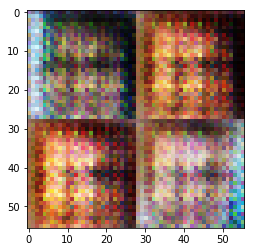

Epoch 2/3... Discriminator Loss: 0.3504... Generator Loss: 4.3503


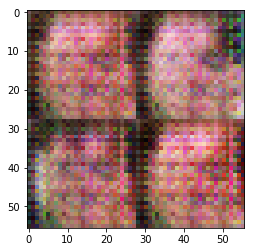

Epoch 2/3... Discriminator Loss: 0.3471... Generator Loss: 4.5943


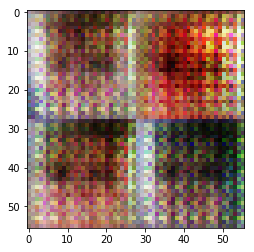

Epoch 2/3... Discriminator Loss: 0.3918... Generator Loss: 4.0660


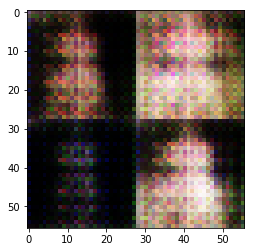

Epoch 2/3... Discriminator Loss: 0.3701... Generator Loss: 6.0955


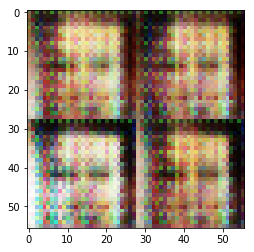

Epoch 2/3... Discriminator Loss: 0.3531... Generator Loss: 4.2505


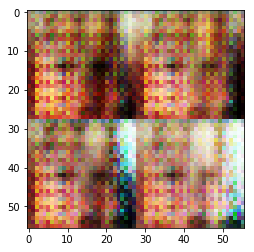

Epoch 2/3... Discriminator Loss: 0.4119... Generator Loss: 3.0313


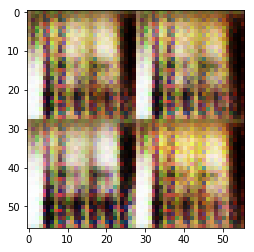

Epoch 2/3... Discriminator Loss: 0.3556... Generator Loss: 4.9254


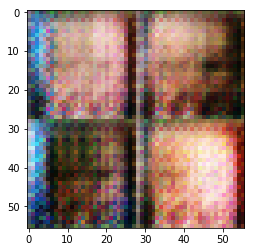

Epoch 2/3... Discriminator Loss: 0.3357... Generator Loss: 5.9135


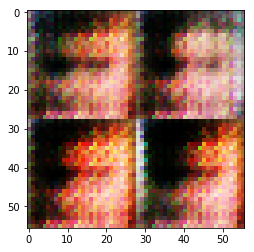

Epoch 2/3... Discriminator Loss: 0.3374... Generator Loss: 6.4626


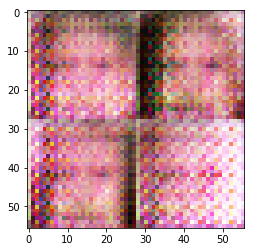

Epoch 2/3... Discriminator Loss: 0.3360... Generator Loss: 6.1341


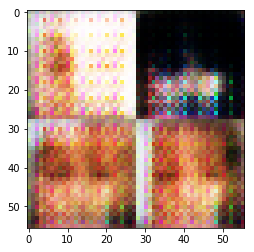

Epoch 2/3... Discriminator Loss: 0.3547... Generator Loss: 5.7669


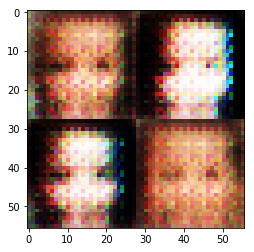

Epoch 2/3... Discriminator Loss: 0.4879... Generator Loss: 3.3094


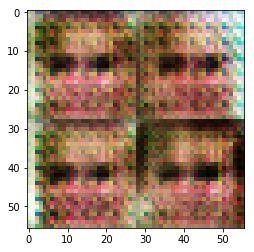

Epoch 2/3... Discriminator Loss: 0.3393... Generator Loss: 5.3269


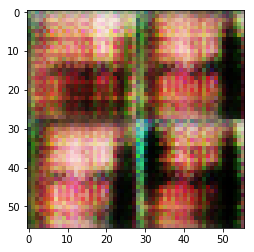

Epoch 3/3... Discriminator Loss: 0.4038... Generator Loss: 3.6392


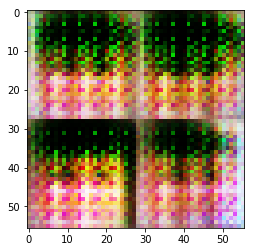

Epoch 3/3... Discriminator Loss: 0.3739... Generator Loss: 6.2204


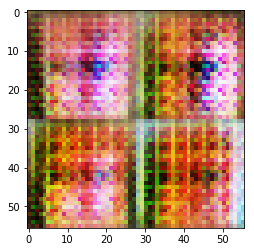

Epoch 3/3... Discriminator Loss: 0.3436... Generator Loss: 5.0369


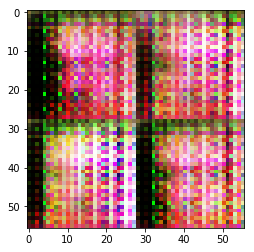

Epoch 3/3... Discriminator Loss: 0.4345... Generator Loss: 9.8751


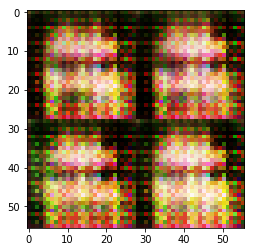

Epoch 3/3... Discriminator Loss: 0.3797... Generator Loss: 5.5214


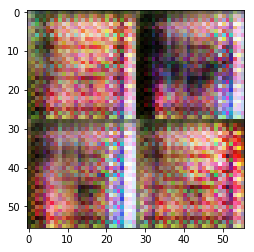

Epoch 3/3... Discriminator Loss: 0.3572... Generator Loss: 6.2058


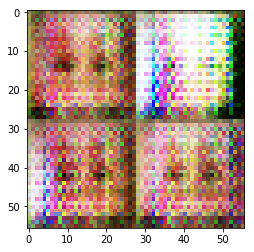

Epoch 3/3... Discriminator Loss: 0.3606... Generator Loss: 5.0014


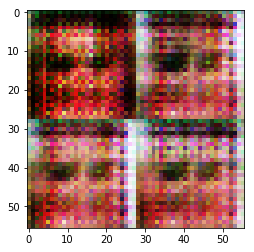

Epoch 3/3... Discriminator Loss: 0.3335... Generator Loss: 5.1616


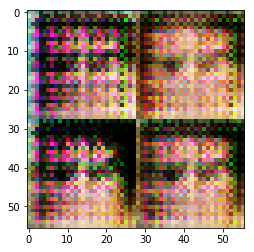

Epoch 3/3... Discriminator Loss: 0.3361... Generator Loss: 4.8357


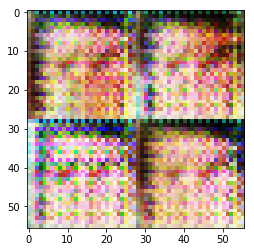

Epoch 3/3... Discriminator Loss: 0.3507... Generator Loss: 4.9537


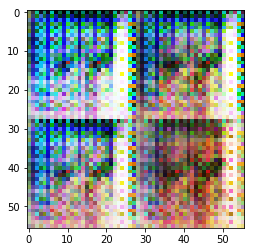

Epoch 3/3... Discriminator Loss: 0.3348... Generator Loss: 8.1046


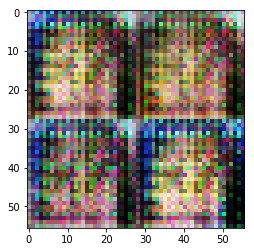

Epoch 3/3... Discriminator Loss: 0.3294... Generator Loss: 6.3039


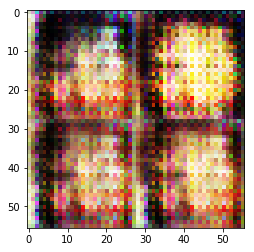

Epoch 3/3... Discriminator Loss: 0.3359... Generator Loss: 5.8835


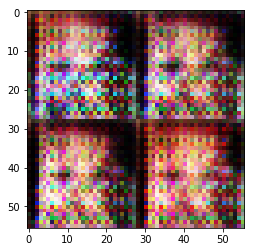

Epoch 3/3... Discriminator Loss: 0.3344... Generator Loss: 5.0929


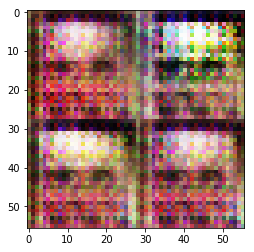

****Whole epochs loss comparison****


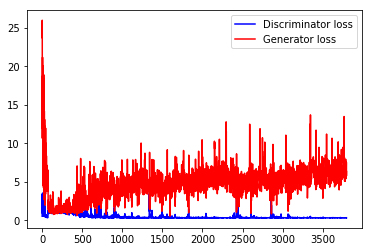

finished


In [15]:
batch_size = 160
z_dim = 256
learning_rate = .001
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 1.3072... Generator Loss: 2.3465


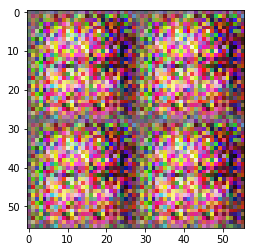

Epoch 1/3... Discriminator Loss: 0.6743... Generator Loss: 3.0634


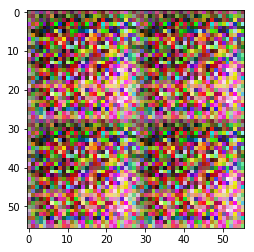

Epoch 1/3... Discriminator Loss: 0.4403... Generator Loss: 4.0978


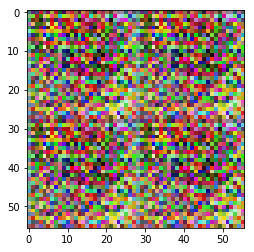

Epoch 1/3... Discriminator Loss: 1.5092... Generator Loss: 0.9113


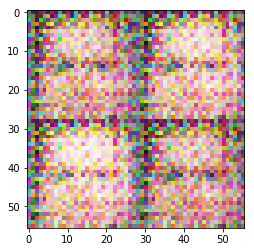

Epoch 1/3... Discriminator Loss: 1.3027... Generator Loss: 1.0108


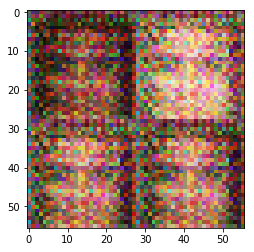

Epoch 1/3... Discriminator Loss: 1.2594... Generator Loss: 1.0164


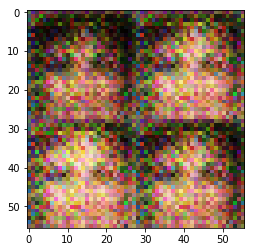

Epoch 1/3... Discriminator Loss: 1.2675... Generator Loss: 0.9361


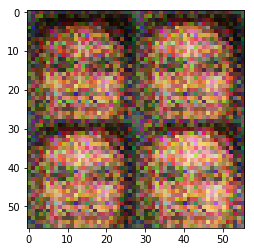

Epoch 1/3... Discriminator Loss: 1.1036... Generator Loss: 1.0693


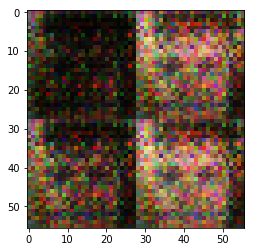

Epoch 1/3... Discriminator Loss: 1.3029... Generator Loss: 1.1249


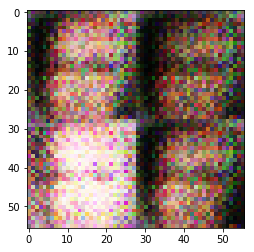

Epoch 1/3... Discriminator Loss: 1.3660... Generator Loss: 0.8292


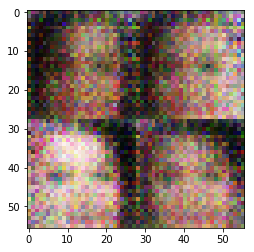

Epoch 1/3... Discriminator Loss: 1.4531... Generator Loss: 0.7484


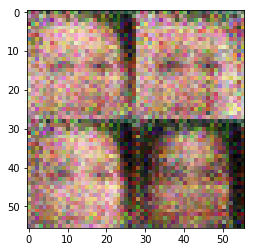

Epoch 1/3... Discriminator Loss: 1.3469... Generator Loss: 0.8442


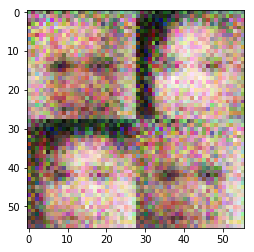

Epoch 1/3... Discriminator Loss: 1.3597... Generator Loss: 0.8523


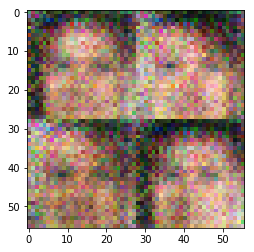

Epoch 1/3... Discriminator Loss: 1.3972... Generator Loss: 0.8177


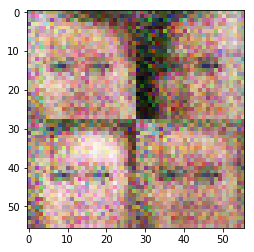

Epoch 2/3... Discriminator Loss: 1.3370... Generator Loss: 0.8805


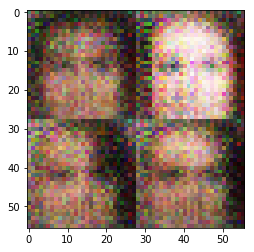

Epoch 2/3... Discriminator Loss: 1.3450... Generator Loss: 0.8069


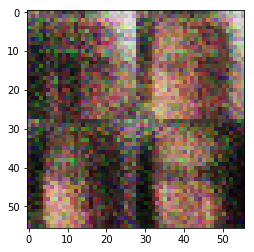

Epoch 2/3... Discriminator Loss: 1.3517... Generator Loss: 0.8397


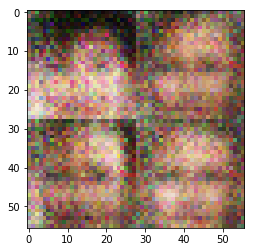

Epoch 2/3... Discriminator Loss: 1.3867... Generator Loss: 0.9059


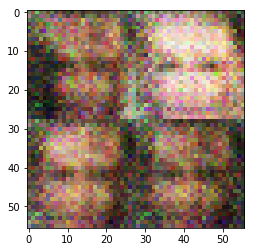

Epoch 2/3... Discriminator Loss: 1.3887... Generator Loss: 0.7404


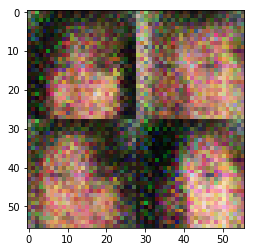

Epoch 2/3... Discriminator Loss: 1.3517... Generator Loss: 0.8401


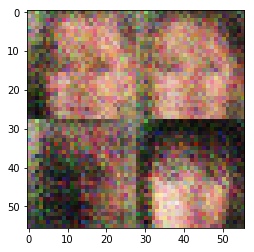

Epoch 2/3... Discriminator Loss: 1.3710... Generator Loss: 0.8695


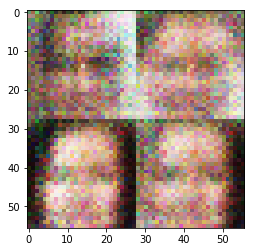

Epoch 2/3... Discriminator Loss: 1.3809... Generator Loss: 0.8332


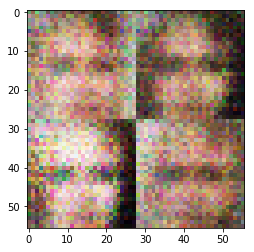

Epoch 2/3... Discriminator Loss: 1.3565... Generator Loss: 0.9013


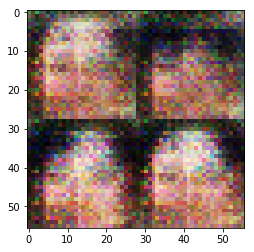

Epoch 2/3... Discriminator Loss: 1.3469... Generator Loss: 0.8376


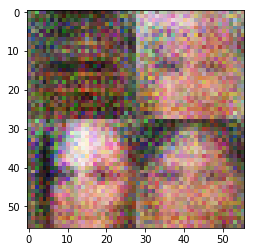

Epoch 2/3... Discriminator Loss: 1.3397... Generator Loss: 0.8433


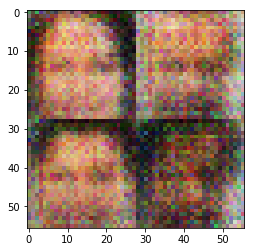

Epoch 2/3... Discriminator Loss: 1.3465... Generator Loss: 0.8350


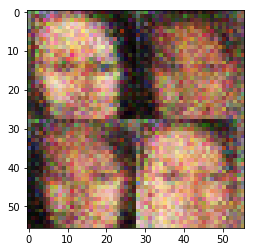

Epoch 2/3... Discriminator Loss: 1.3582... Generator Loss: 0.8109


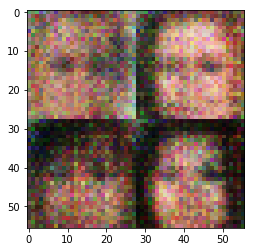

Epoch 2/3... Discriminator Loss: 1.3584... Generator Loss: 0.8304


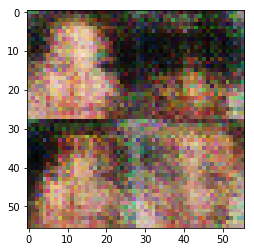

Epoch 3/3... Discriminator Loss: 1.3956... Generator Loss: 0.8034


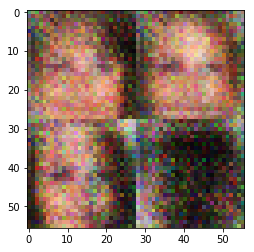

Epoch 3/3... Discriminator Loss: 1.3766... Generator Loss: 0.8406


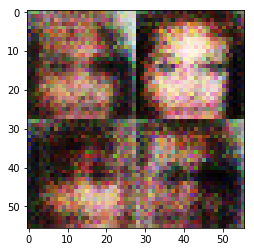

Epoch 3/3... Discriminator Loss: 1.3581... Generator Loss: 0.8895


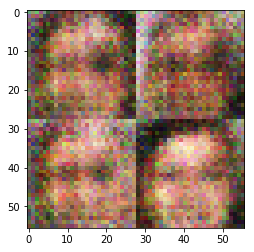

Epoch 3/3... Discriminator Loss: 1.3167... Generator Loss: 0.8182


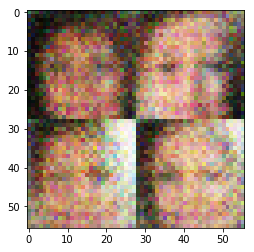

Epoch 3/3... Discriminator Loss: 1.3306... Generator Loss: 0.8174


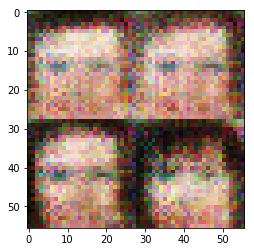

Epoch 3/3... Discriminator Loss: 1.3115... Generator Loss: 0.8246


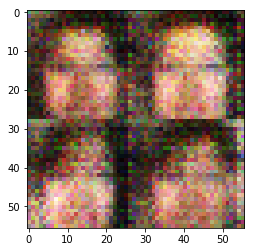

Epoch 3/3... Discriminator Loss: 1.2944... Generator Loss: 0.9680


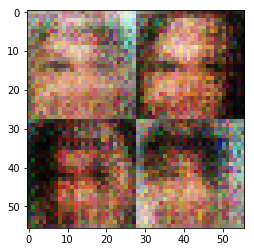

Epoch 3/3... Discriminator Loss: 1.2876... Generator Loss: 0.9203


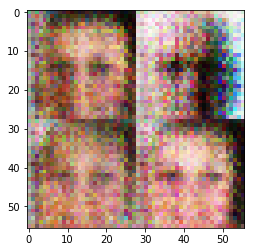

Epoch 3/3... Discriminator Loss: 1.2903... Generator Loss: 0.9250


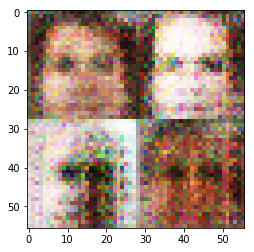

Epoch 3/3... Discriminator Loss: 1.2884... Generator Loss: 0.9056


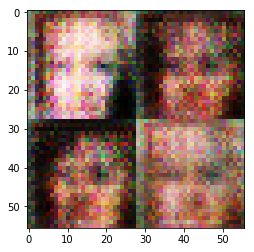

Epoch 3/3... Discriminator Loss: 1.2971... Generator Loss: 0.8844


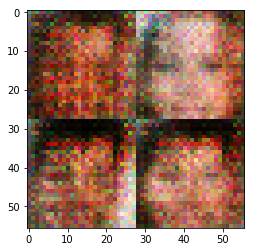

Epoch 3/3... Discriminator Loss: 1.2318... Generator Loss: 0.9535


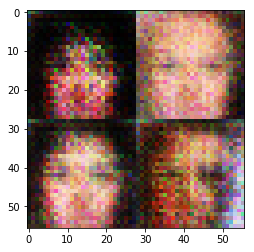

Epoch 3/3... Discriminator Loss: 1.2791... Generator Loss: 0.9214


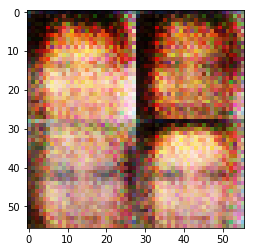

Epoch 3/3... Discriminator Loss: 1.1523... Generator Loss: 1.1574


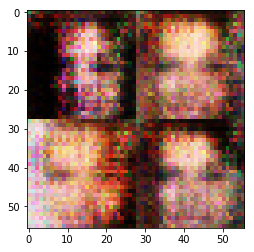

****Whole epochs loss comparison****


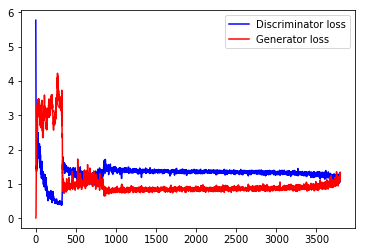

finished


In [ ]:
batch_size = 160
z_dim = 256
learning_rate = .0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

Epoch 1/3... Discriminator Loss: 1.9508... Generator Loss: 2.8722


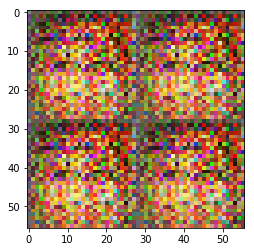

Epoch 1/3... Discriminator Loss: 0.8713... Generator Loss: 3.1193


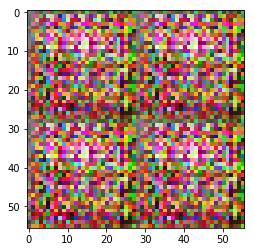

Epoch 1/3... Discriminator Loss: 0.7587... Generator Loss: 2.6665


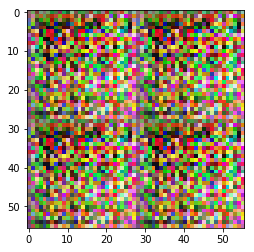

Epoch 1/3... Discriminator Loss: 0.7248... Generator Loss: 2.2869


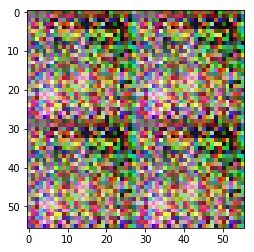

Epoch 1/3... Discriminator Loss: 0.6709... Generator Loss: 2.6237


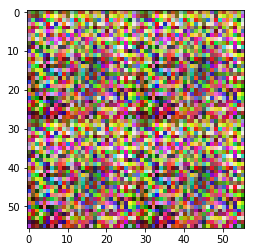

Epoch 1/3... Discriminator Loss: 0.6726... Generator Loss: 2.7693


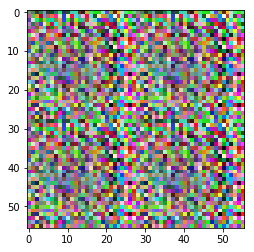

Epoch 1/3... Discriminator Loss: 0.6558... Generator Loss: 2.4188


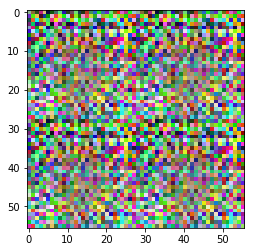

Epoch 1/3... Discriminator Loss: 0.6563... Generator Loss: 2.3076


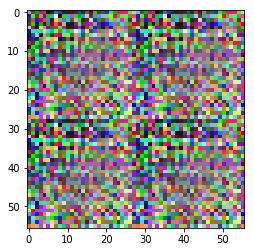

Epoch 1/3... Discriminator Loss: 0.6622... Generator Loss: 2.5135


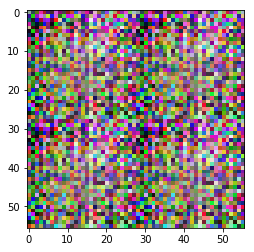

Epoch 1/3... Discriminator Loss: 0.6602... Generator Loss: 2.4607


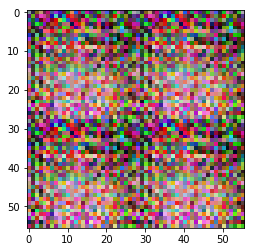

Epoch 1/3... Discriminator Loss: 0.6563... Generator Loss: 2.3026


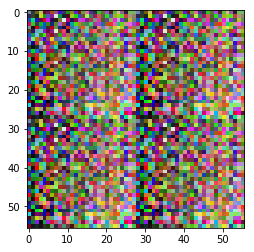

Epoch 1/3... Discriminator Loss: 0.6530... Generator Loss: 2.2954


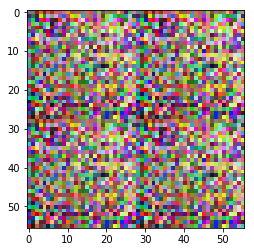

Epoch 1/3... Discriminator Loss: 0.6526... Generator Loss: 2.2216


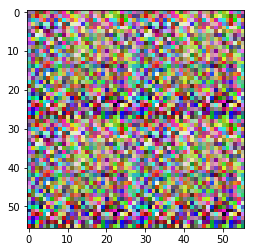

Epoch 1/3... Discriminator Loss: 0.6532... Generator Loss: 2.3987


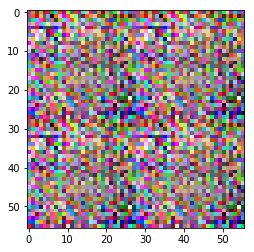

Epoch 1/3... Discriminator Loss: 0.6531... Generator Loss: 2.3801


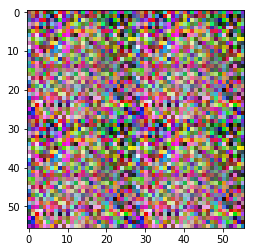

Epoch 1/3... Discriminator Loss: 0.6634... Generator Loss: 1.9954


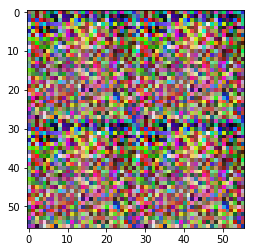

Epoch 1/3... Discriminator Loss: 0.6568... Generator Loss: 2.2810


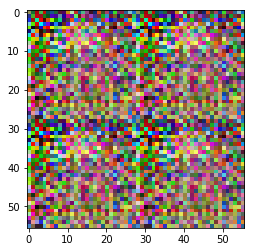

Epoch 1/3... Discriminator Loss: 0.6551... Generator Loss: 2.3957


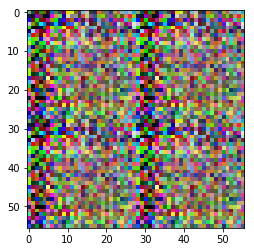

Epoch 1/3... Discriminator Loss: 0.6536... Generator Loss: 2.1830


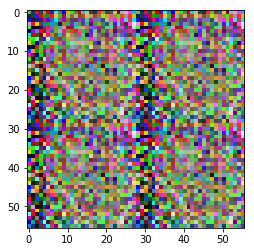

Epoch 1/3... Discriminator Loss: 0.6518... Generator Loss: 2.3645


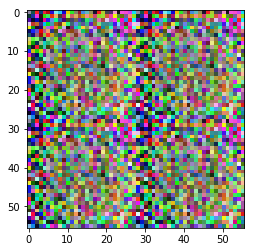

Epoch 1/3... Discriminator Loss: 0.6569... Generator Loss: 2.5945


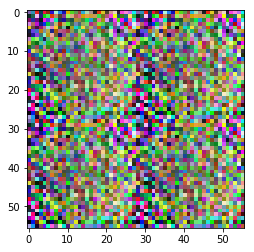

Epoch 1/3... Discriminator Loss: 0.6524... Generator Loss: 2.3064


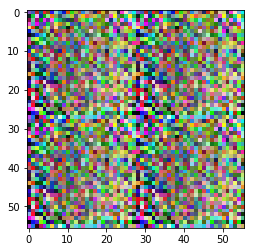

Epoch 1/3... Discriminator Loss: 0.6534... Generator Loss: 2.1844


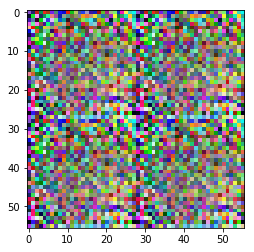

Epoch 1/3... Discriminator Loss: 0.6514... Generator Loss: 2.3358


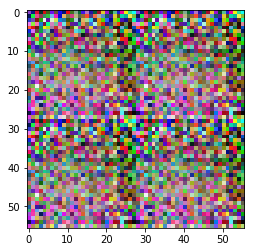

Epoch 1/3... Discriminator Loss: 0.6535... Generator Loss: 2.4094


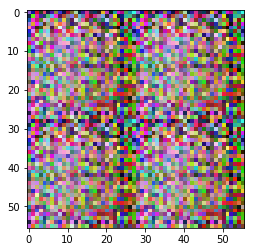

Epoch 1/3... Discriminator Loss: 0.6526... Generator Loss: 2.3195


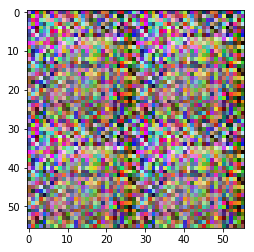

Epoch 1/3... Discriminator Loss: 0.6516... Generator Loss: 2.3505


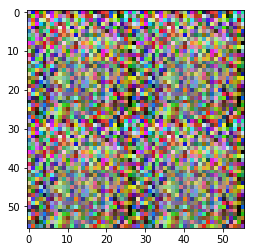

Epoch 1/3... Discriminator Loss: 0.6519... Generator Loss: 2.4309


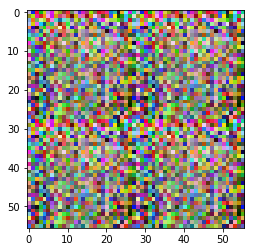

Epoch 2/3... Discriminator Loss: 0.6658... Generator Loss: 2.8522


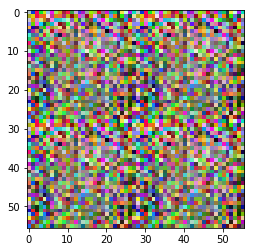

Epoch 2/3... Discriminator Loss: 0.6606... Generator Loss: 2.7619


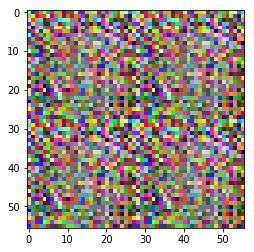

Epoch 2/3... Discriminator Loss: 0.6510... Generator Loss: 2.2364


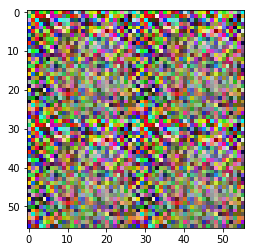

Epoch 2/3... Discriminator Loss: 0.6524... Generator Loss: 2.1802


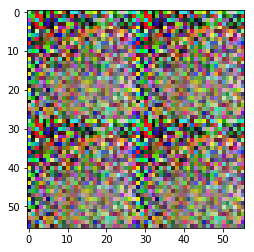

Epoch 2/3... Discriminator Loss: 0.6519... Generator Loss: 2.3207


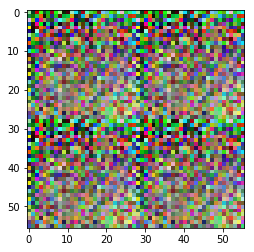

Epoch 2/3... Discriminator Loss: 0.6536... Generator Loss: 2.4678


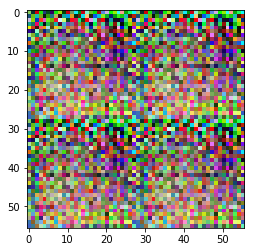

Epoch 2/3... Discriminator Loss: 0.6690... Generator Loss: 2.9171


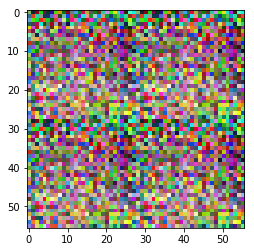

Epoch 2/3... Discriminator Loss: 0.6522... Generator Loss: 2.4631


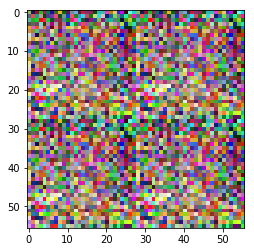

Epoch 2/3... Discriminator Loss: 0.6529... Generator Loss: 2.3039


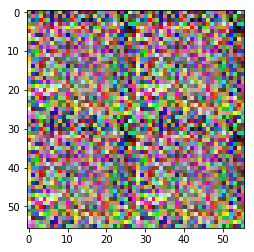

Epoch 2/3... Discriminator Loss: 0.6511... Generator Loss: 2.2159


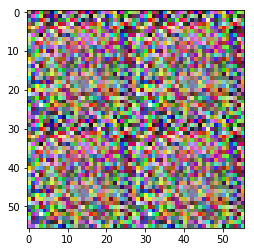

Epoch 2/3... Discriminator Loss: 0.6521... Generator Loss: 2.4601


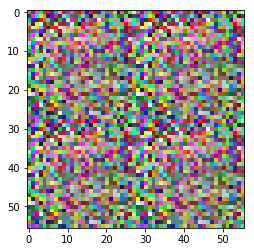

Epoch 2/3... Discriminator Loss: 0.6551... Generator Loss: 2.5824


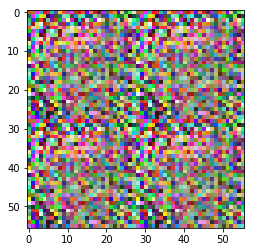

Epoch 2/3... Discriminator Loss: 0.6536... Generator Loss: 2.5414


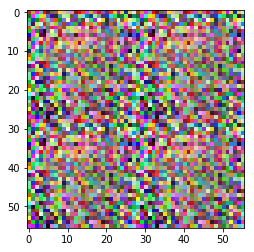

Epoch 2/3... Discriminator Loss: 0.6517... Generator Loss: 2.4583


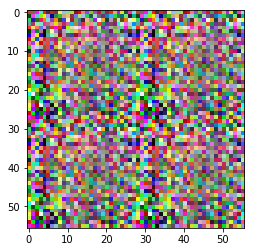

Epoch 2/3... Discriminator Loss: 0.6524... Generator Loss: 2.4980


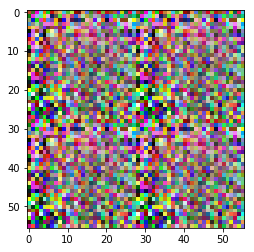

Epoch 2/3... Discriminator Loss: 0.6518... Generator Loss: 2.1857


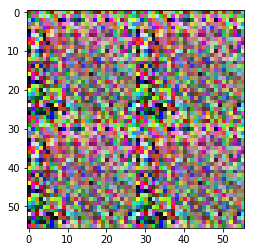

Epoch 2/3... Discriminator Loss: 0.6659... Generator Loss: 2.8843


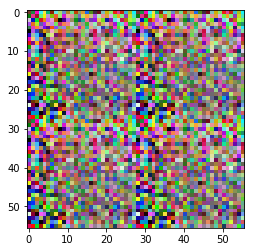

Epoch 2/3... Discriminator Loss: 0.6596... Generator Loss: 2.7420


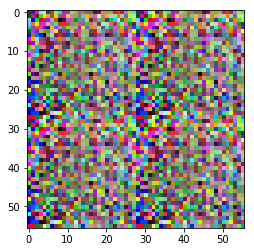

Epoch 2/3... Discriminator Loss: 0.6513... Generator Loss: 2.1976


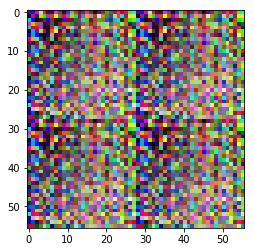

Epoch 2/3... Discriminator Loss: 1.2374... Generator Loss: 0.9181


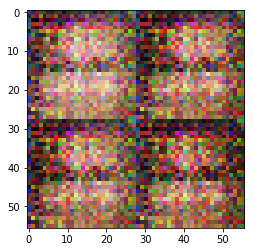

Epoch 2/3... Discriminator Loss: 0.9220... Generator Loss: 1.1931


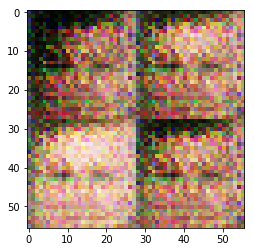

Epoch 2/3... Discriminator Loss: 0.8133... Generator Loss: 2.2456


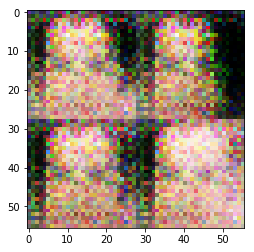

Epoch 2/3... Discriminator Loss: 1.1533... Generator Loss: 0.9442


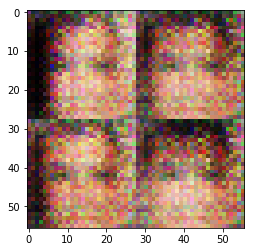

Epoch 2/3... Discriminator Loss: 1.0043... Generator Loss: 1.1668


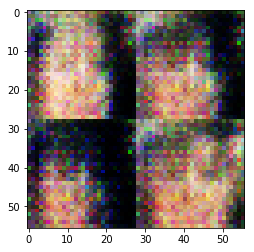

Epoch 2/3... Discriminator Loss: 1.2462... Generator Loss: 1.1114


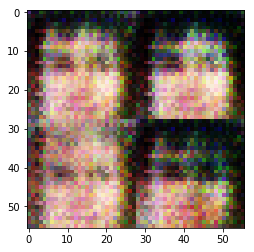

Epoch 2/3... Discriminator Loss: 1.0242... Generator Loss: 1.4254


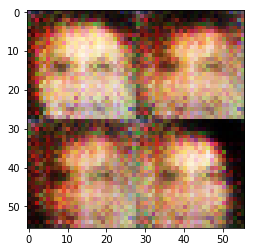

Epoch 2/3... Discriminator Loss: 0.8957... Generator Loss: 1.7066


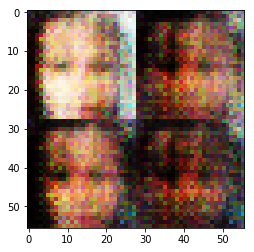

Epoch 2/3... Discriminator Loss: 0.7783... Generator Loss: 2.5189


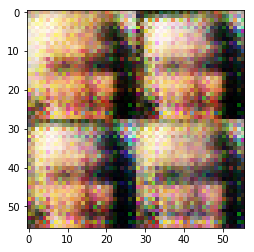

Epoch 3/3... Discriminator Loss: 0.7784... Generator Loss: 1.8463


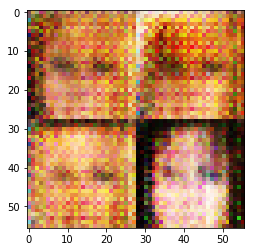

Epoch 3/3... Discriminator Loss: 0.7270... Generator Loss: 2.1705


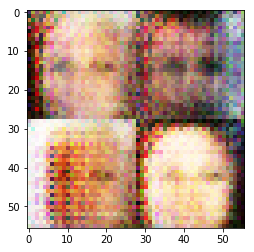

Epoch 3/3... Discriminator Loss: 0.7415... Generator Loss: 1.8674


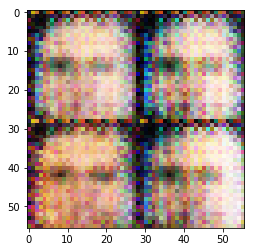

Epoch 3/3... Discriminator Loss: 0.7091... Generator Loss: 2.3714


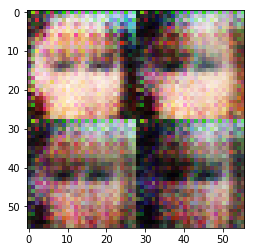

Epoch 3/3... Discriminator Loss: 0.6844... Generator Loss: 1.8797


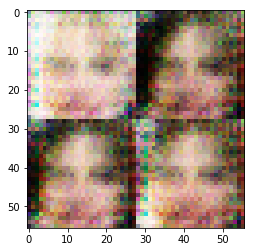

Epoch 3/3... Discriminator Loss: 0.6893... Generator Loss: 1.9584


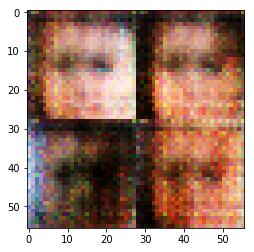

Epoch 3/3... Discriminator Loss: 0.6622... Generator Loss: 2.2110


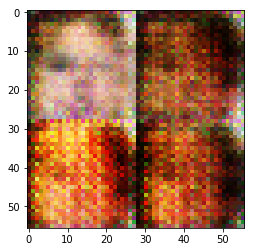

Epoch 3/3... Discriminator Loss: 0.6767... Generator Loss: 2.1166


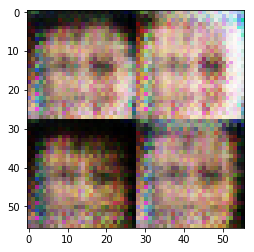

Epoch 3/3... Discriminator Loss: 0.6574... Generator Loss: 2.1409


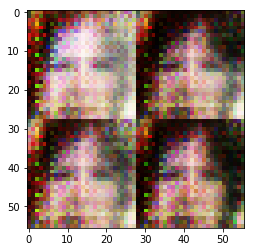

Epoch 3/3... Discriminator Loss: 0.6881... Generator Loss: 2.6083


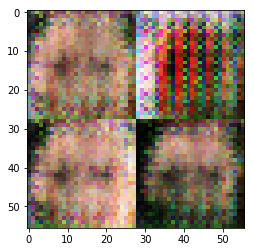

Epoch 3/3... Discriminator Loss: 0.6546... Generator Loss: 2.2933


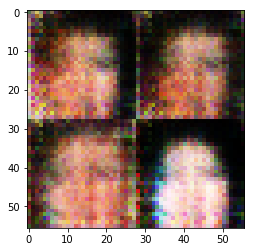

Epoch 3/3... Discriminator Loss: 0.6663... Generator Loss: 2.6956


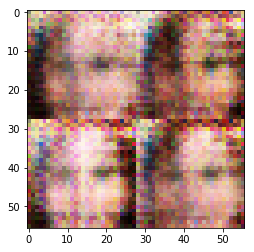

Epoch 3/3... Discriminator Loss: 0.6676... Generator Loss: 2.0587


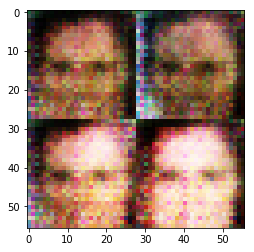

Epoch 3/3... Discriminator Loss: 0.6696... Generator Loss: 2.2316


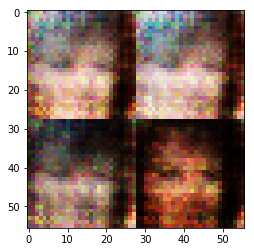

Epoch 3/3... Discriminator Loss: 0.6584... Generator Loss: 2.3049


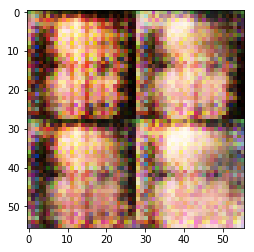

Epoch 3/3... Discriminator Loss: 0.6664... Generator Loss: 2.0225


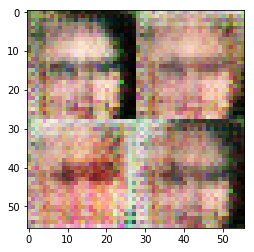

Epoch 3/3... Discriminator Loss: 0.6570... Generator Loss: 2.4556


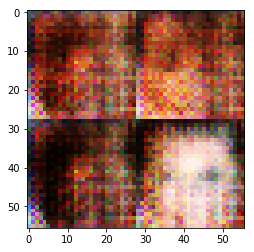

Epoch 3/3... Discriminator Loss: 0.6714... Generator Loss: 1.9564


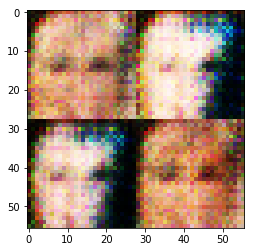

Epoch 3/3... Discriminator Loss: 0.6568... Generator Loss: 2.4620


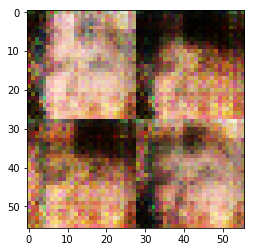

Epoch 3/3... Discriminator Loss: 0.6704... Generator Loss: 1.9590


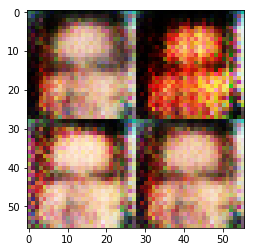

Epoch 3/3... Discriminator Loss: 0.6720... Generator Loss: 2.7164


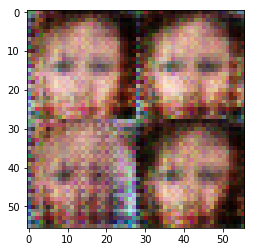

Epoch 3/3... Discriminator Loss: 0.6625... Generator Loss: 2.0245


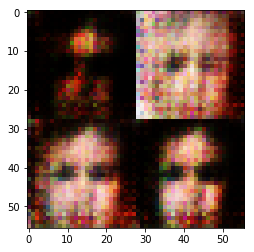

Epoch 3/3... Discriminator Loss: 0.6792... Generator Loss: 1.7903


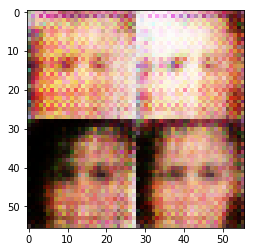

Epoch 3/3... Discriminator Loss: 0.6547... Generator Loss: 2.3402


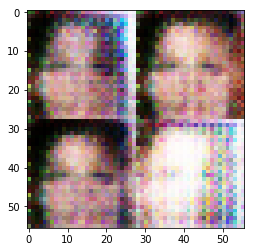

Epoch 3/3... Discriminator Loss: 0.6615... Generator Loss: 2.2554


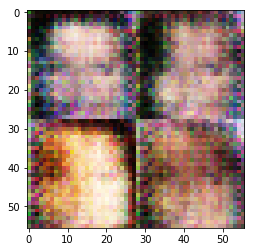

Epoch 3/3... Discriminator Loss: 0.6563... Generator Loss: 2.4150


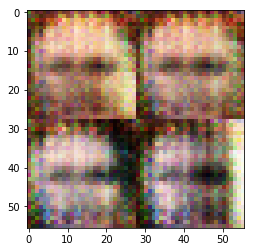

Epoch 3/3... Discriminator Loss: 0.6542... Generator Loss: 2.4716


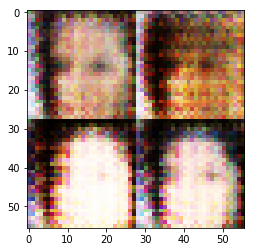

Epoch 3/3... Discriminator Loss: 0.6547... Generator Loss: 2.3973


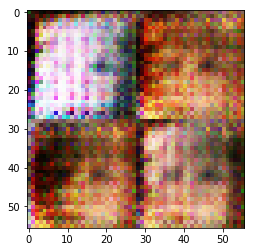

****Whole epochs loss comparison****


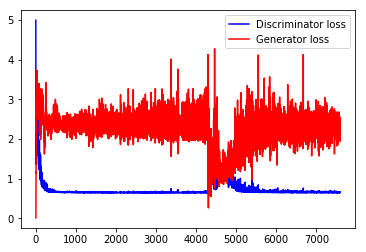

finished


In [18]:
batch_size = 80
z_dim = 256
learning_rate = .0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

In [24]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    g_output = generator(input_z, out_channel_dim, is_train=True)
    
    d_output_real, d_logit_real = discriminator(input_real, reuse= False)
    d_output_fake, d_logit_fake = discriminator(g_output, reuse= True)
    
    
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_real, labels=tf.ones_like(d_output_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_fake, labels=tf.ones_like(d_output_fake)*smooth))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logit_fake,labels = tf.ones_like(d_output_fake)))
    
    
    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


Epoch 1/3... Discriminator Loss: 1.1751... Generator Loss: 2.8885


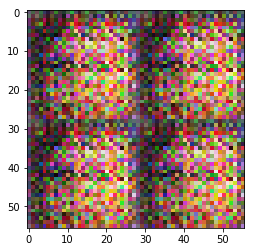

Epoch 1/3... Discriminator Loss: 0.8225... Generator Loss: 2.6306


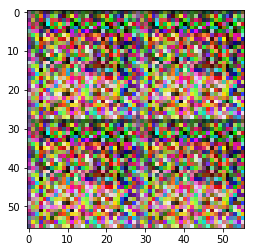

Epoch 1/3... Discriminator Loss: 0.6879... Generator Loss: 2.3275


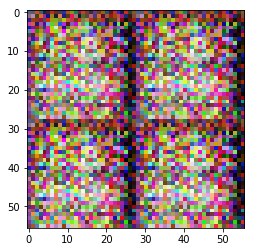

Epoch 1/3... Discriminator Loss: 0.6684... Generator Loss: 2.3612


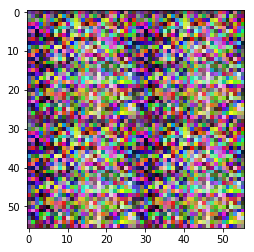

Epoch 1/3... Discriminator Loss: 0.6679... Generator Loss: 2.4848


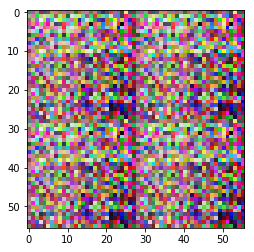

Epoch 1/3... Discriminator Loss: 0.6721... Generator Loss: 2.7138


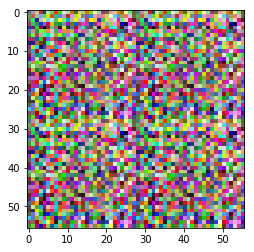

Epoch 1/3... Discriminator Loss: 0.6587... Generator Loss: 2.4426


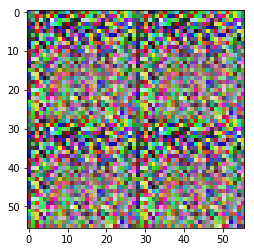

Epoch 1/3... Discriminator Loss: 0.6605... Generator Loss: 2.1662


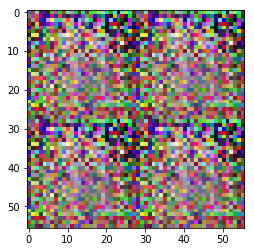

Epoch 1/3... Discriminator Loss: 0.6636... Generator Loss: 2.5039


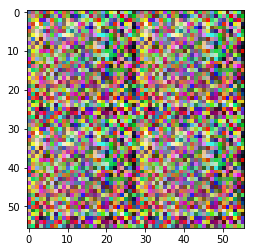

Epoch 1/3... Discriminator Loss: 0.6552... Generator Loss: 2.3565


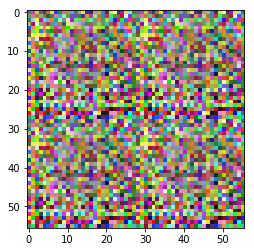

Epoch 1/3... Discriminator Loss: 0.6660... Generator Loss: 2.8016


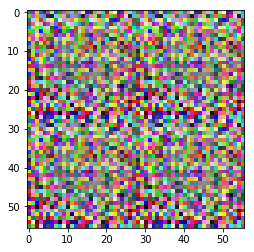

Epoch 1/3... Discriminator Loss: 0.6534... Generator Loss: 2.4013


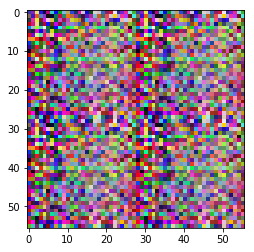

Epoch 1/3... Discriminator Loss: 0.6526... Generator Loss: 2.3006


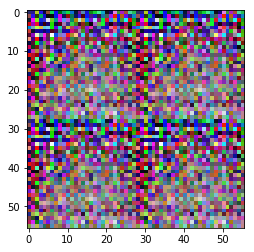

Epoch 1/3... Discriminator Loss: 0.6529... Generator Loss: 2.2999


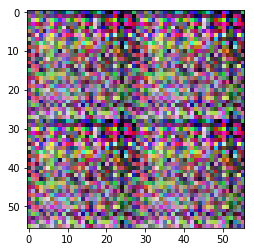

Epoch 1/3... Discriminator Loss: 0.6588... Generator Loss: 2.3022


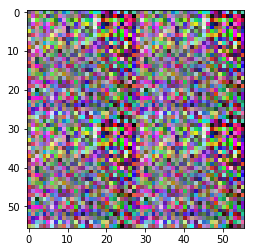

Epoch 1/3... Discriminator Loss: 0.6571... Generator Loss: 2.0793


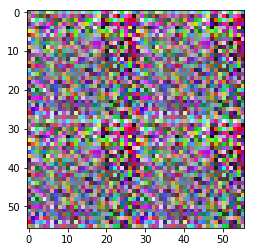

Epoch 1/3... Discriminator Loss: 0.6539... Generator Loss: 2.2386


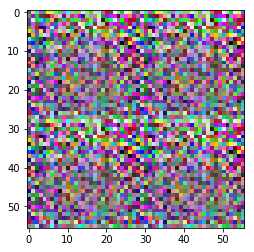

Epoch 1/3... Discriminator Loss: 0.6529... Generator Loss: 2.1948


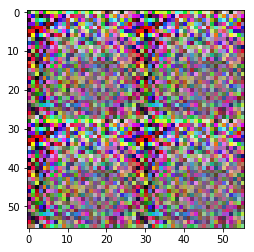

Epoch 1/3... Discriminator Loss: 0.6528... Generator Loss: 2.2551


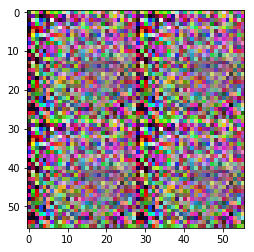

Epoch 1/3... Discriminator Loss: 0.6533... Generator Loss: 2.4542


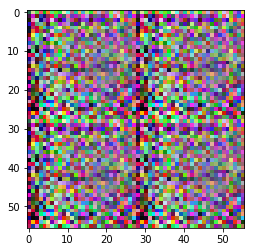

Epoch 1/3... Discriminator Loss: 0.6647... Generator Loss: 2.8411


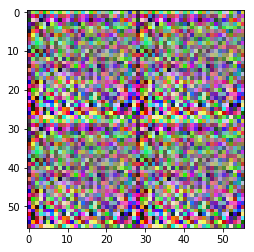

Epoch 1/3... Discriminator Loss: 0.6515... Generator Loss: 2.2657


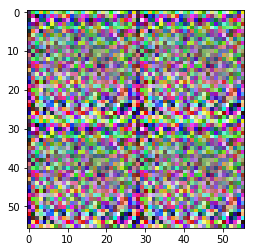

Epoch 1/3... Discriminator Loss: 0.6540... Generator Loss: 2.1404


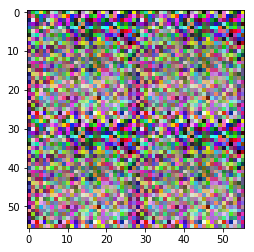

Epoch 1/3... Discriminator Loss: 0.6525... Generator Loss: 2.1829


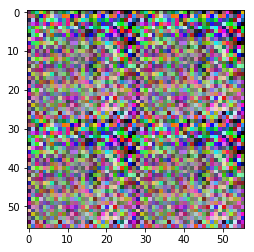

Epoch 1/3... Discriminator Loss: 0.6553... Generator Loss: 2.6045


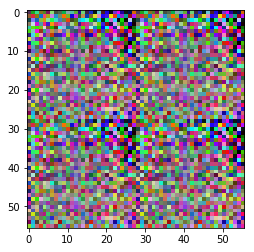

Epoch 1/3... Discriminator Loss: 0.6555... Generator Loss: 2.5523


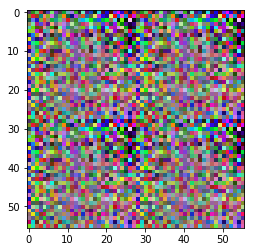

Epoch 1/3... Discriminator Loss: 0.6517... Generator Loss: 2.3617


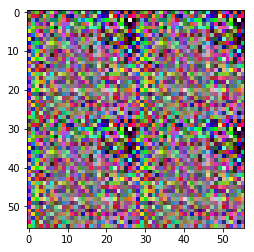

Epoch 1/3... Discriminator Loss: 0.6513... Generator Loss: 2.2380


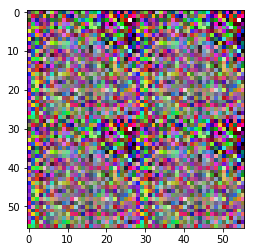

Epoch 2/3... Discriminator Loss: 0.6511... Generator Loss: 2.2502


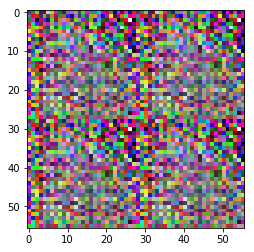

Epoch 2/3... Discriminator Loss: 0.6533... Generator Loss: 2.5295


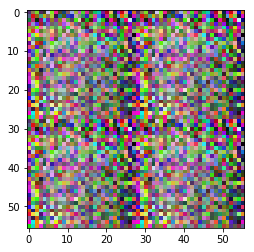

Epoch 2/3... Discriminator Loss: 0.6517... Generator Loss: 2.2141


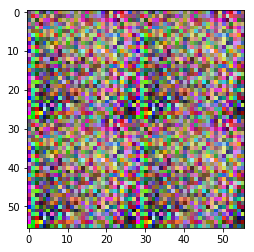

Epoch 2/3... Discriminator Loss: 0.6520... Generator Loss: 2.3767


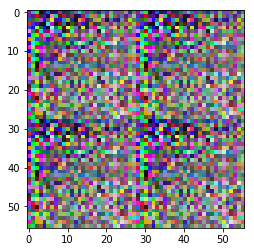

Epoch 2/3... Discriminator Loss: 0.6512... Generator Loss: 2.2493


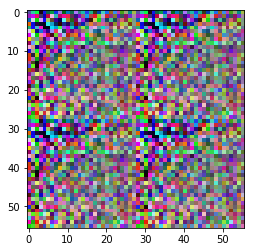

Epoch 2/3... Discriminator Loss: 0.6524... Generator Loss: 2.2911


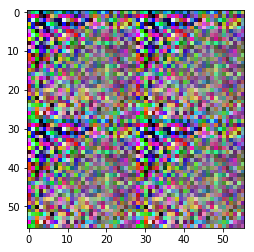

Epoch 2/3... Discriminator Loss: 0.6513... Generator Loss: 2.3656


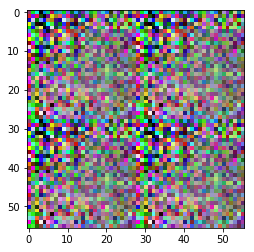

Epoch 2/3... Discriminator Loss: 0.6535... Generator Loss: 2.5316


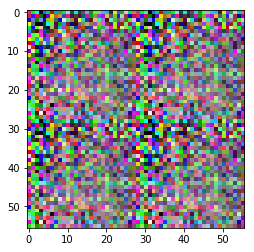

Epoch 2/3... Discriminator Loss: 0.6535... Generator Loss: 2.5346


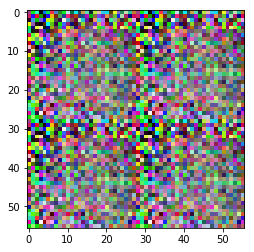

Epoch 2/3... Discriminator Loss: 0.6514... Generator Loss: 2.1959


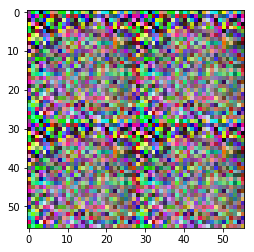

Epoch 2/3... Discriminator Loss: 0.6525... Generator Loss: 2.5041


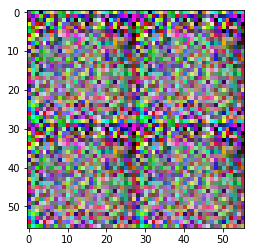

Epoch 2/3... Discriminator Loss: 0.7230... Generator Loss: 3.7527


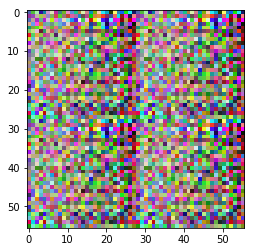

Epoch 2/3... Discriminator Loss: 0.6544... Generator Loss: 2.5770


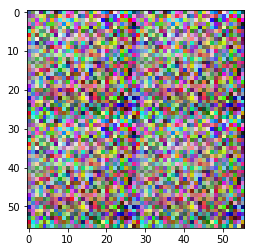

Epoch 2/3... Discriminator Loss: 0.6528... Generator Loss: 2.1087


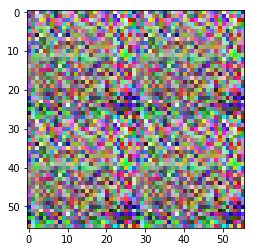

Epoch 2/3... Discriminator Loss: 0.6512... Generator Loss: 2.4188


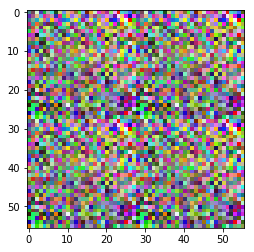

Epoch 2/3... Discriminator Loss: 0.6532... Generator Loss: 2.1077


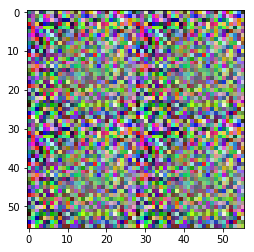

Epoch 2/3... Discriminator Loss: 0.6606... Generator Loss: 2.7584


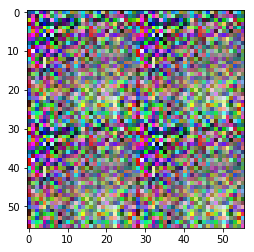

Epoch 2/3... Discriminator Loss: 0.6507... Generator Loss: 2.3639


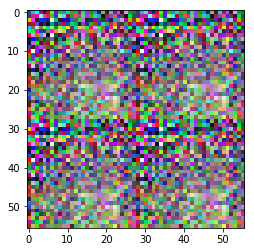

Epoch 2/3... Discriminator Loss: 1.4767... Generator Loss: 0.4520


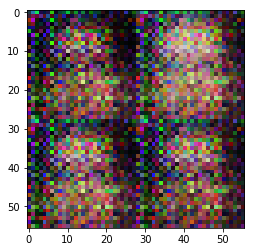

Epoch 2/3... Discriminator Loss: 1.3435... Generator Loss: 2.1681


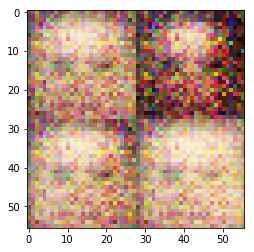

Epoch 2/3... Discriminator Loss: 0.8003... Generator Loss: 1.7157


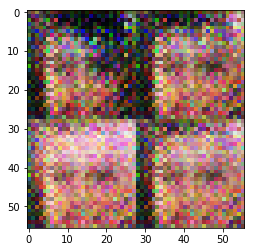

Epoch 2/3... Discriminator Loss: 0.9581... Generator Loss: 1.2797


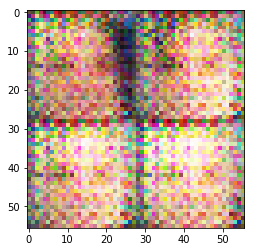

Epoch 2/3... Discriminator Loss: 1.1057... Generator Loss: 1.0238


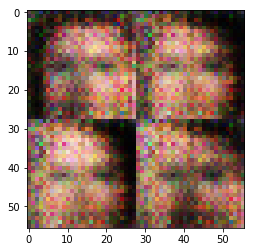

Epoch 2/3... Discriminator Loss: 1.1265... Generator Loss: 1.1554


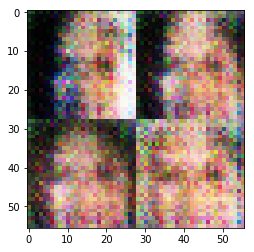

Epoch 2/3... Discriminator Loss: 0.9884... Generator Loss: 1.3659


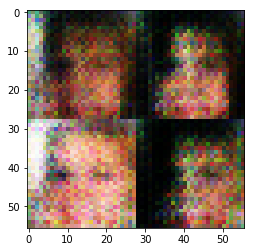

Epoch 2/3... Discriminator Loss: 0.8645... Generator Loss: 1.5649


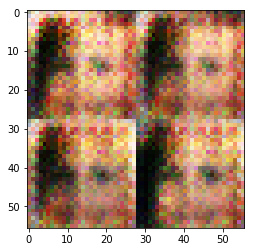

Epoch 2/3... Discriminator Loss: 0.7700... Generator Loss: 1.6648


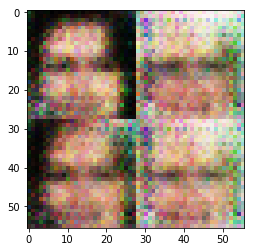

Epoch 2/3... Discriminator Loss: 0.9190... Generator Loss: 1.1579


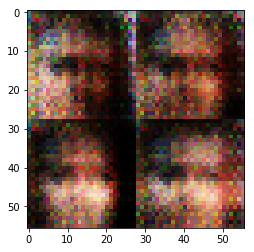

Epoch 3/3... Discriminator Loss: 0.7315... Generator Loss: 2.2285


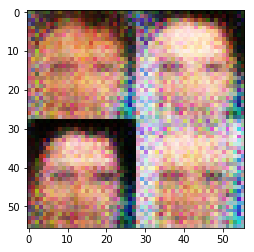

Epoch 3/3... Discriminator Loss: 0.6900... Generator Loss: 2.3183


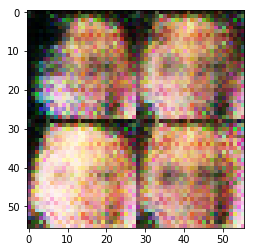

Epoch 3/3... Discriminator Loss: 0.7011... Generator Loss: 1.8725


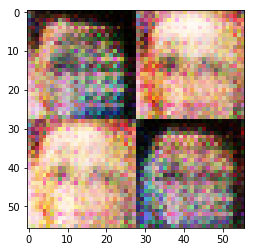

Epoch 3/3... Discriminator Loss: 0.6990... Generator Loss: 2.2167


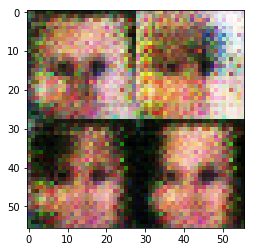

Epoch 3/3... Discriminator Loss: 0.7013... Generator Loss: 2.1365


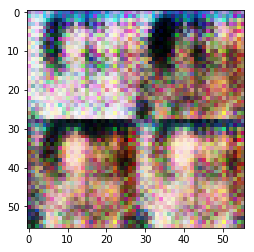

Epoch 3/3... Discriminator Loss: 0.7439... Generator Loss: 1.7172


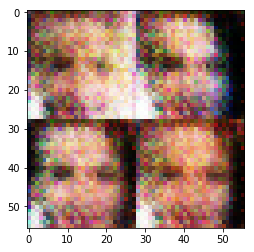

Epoch 3/3... Discriminator Loss: 0.6835... Generator Loss: 2.1620


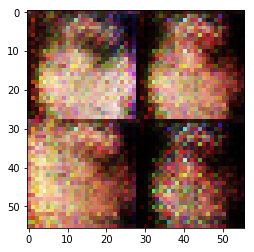

Epoch 3/3... Discriminator Loss: 0.6685... Generator Loss: 2.1770


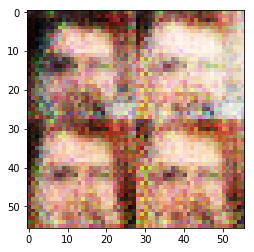

Epoch 3/3... Discriminator Loss: 0.6739... Generator Loss: 2.0109


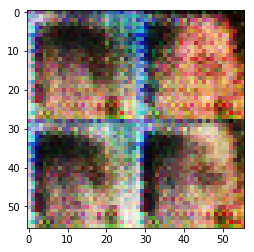

Epoch 3/3... Discriminator Loss: 0.6676... Generator Loss: 2.4580


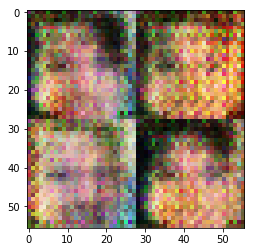

Epoch 3/3... Discriminator Loss: 0.6672... Generator Loss: 1.9532


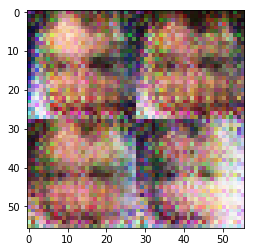

Epoch 3/3... Discriminator Loss: 0.6564... Generator Loss: 2.4624


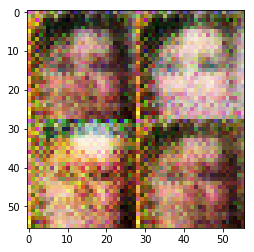

Epoch 3/3... Discriminator Loss: 0.6594... Generator Loss: 2.0990


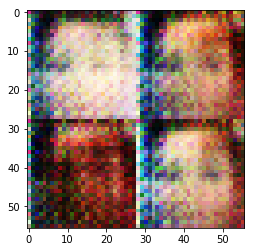

Epoch 3/3... Discriminator Loss: 0.6724... Generator Loss: 2.5676


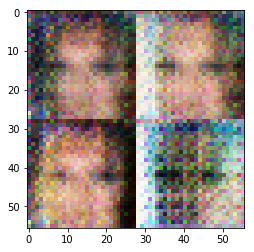

Epoch 3/3... Discriminator Loss: 0.6560... Generator Loss: 2.4825


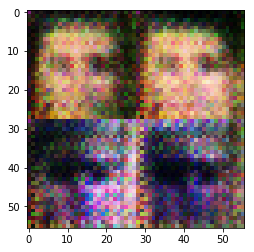

Epoch 3/3... Discriminator Loss: 0.6992... Generator Loss: 1.7237


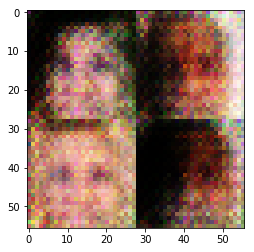

Epoch 3/3... Discriminator Loss: 0.6595... Generator Loss: 2.5445


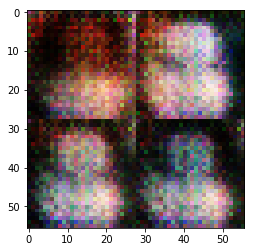

Epoch 3/3... Discriminator Loss: 0.6550... Generator Loss: 2.2688


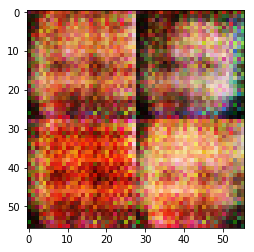

Epoch 3/3... Discriminator Loss: 0.6584... Generator Loss: 2.6516


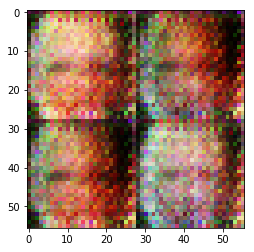

Epoch 3/3... Discriminator Loss: 0.6547... Generator Loss: 2.1516


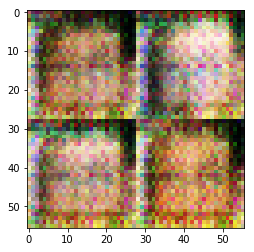

Epoch 3/3... Discriminator Loss: 0.6593... Generator Loss: 2.6082


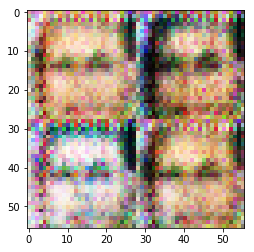

Epoch 3/3... Discriminator Loss: 0.6586... Generator Loss: 2.0759


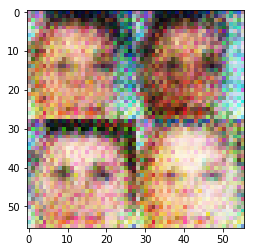

Epoch 3/3... Discriminator Loss: 0.6786... Generator Loss: 1.7680


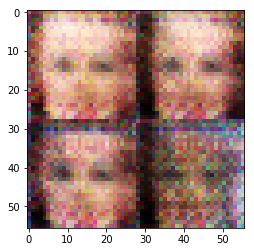

Epoch 3/3... Discriminator Loss: 0.6524... Generator Loss: 2.2597


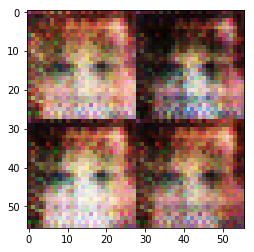

Epoch 3/3... Discriminator Loss: 0.6680... Generator Loss: 2.0638


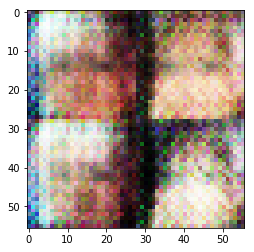

Epoch 3/3... Discriminator Loss: 0.6556... Generator Loss: 2.4858


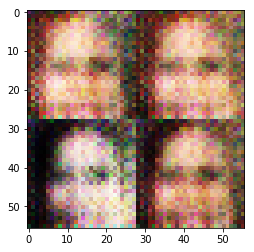

Epoch 3/3... Discriminator Loss: 0.6542... Generator Loss: 2.4045


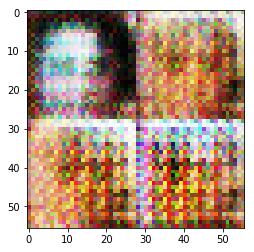

Epoch 3/3... Discriminator Loss: 0.6516... Generator Loss: 2.3845


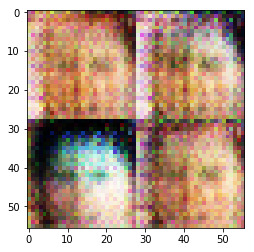

****Whole epochs loss comparison****


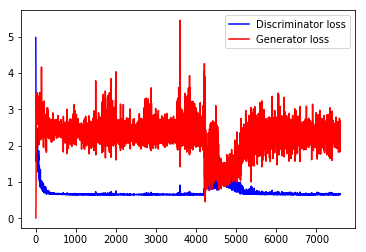

finished


In [17]:
batch_size = 80
z_dim = 256
learning_rate = .0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)
    
    
print('finished')

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.